In [128]:
import csv
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import os
import math
import numpy as np
import sklearn.cluster as skclust 
import copy

def load_all_fitnesses(filename,obj) :
    with open(filename) as file :
        csv_data = csv.reader(file,delimiter=',')
        best_fitnesses = []
        best_ind_id = []
        avg_fitnesses = []
        pop_size= []
        nb_eval = []
        nb_eval_tot = 0
        for row in csv_data :
            best_fitness = 0
            best_id = 0
            avg_fitness = 0
            nb_eval_tot += int(row[1])
            for i in range(3,len(row[:-1]),int(row[2])) :
                if(float(row[i+obj]) > best_fitness) :
                    best_fitness = float(row[i+obj])
                    best_id = int(i/int(row[2]) - 1)
                avg_fitness += float(row[i+obj])
            avg_fitness = avg_fitness/float(row[1])
            avg_fitnesses.append(avg_fitness)
            best_fitnesses.append(best_fitness)
            best_ind_id.append(best_id)
            nb_eval.append(nb_eval_tot)
            pop_size.append(int(row[1]))
            
    return nb_eval, best_ind_id, best_fitnesses, avg_fitnesses, pop_size

def load_ind_fitnesses(filename,obj):
    with open(filename) as file:
        csv_data = csv.reader(file,delimiter=',')
        lines = []
        for row in csv_data:
            for i in range(3,int(row[1])+3):
                lines.append([int(row[0]),i-3,float(row[i])])
    return lines

def load_controller_archive(filename):
    lines = []
    with open(filename) as file :
        csv_data = csv.reader(file,delimiter=',')
        coord = [0]*3
        state = 0
        nbr_param = 0
        i=0
        for row in csv_data:
            if(len(row) == 3):
                coord[0] = int(row[0])
                coord[1] = int(row[1])
                coord[2] = int(row[2])
                state = 1
                i=0
            elif(state == 1):
                nbr_param = int(row[0])
                state = 2
            elif(state == 2):
                nbr_param += int(row[0])
                state = 3
            elif(state == 3 and i < nbr_param):
                i+=1
            elif(state == 3 and i >= nbr_param):
                lines.append([coord[0],coord[1],coord[2],float(row[0])])
    return pd.DataFrame(data=lines,columns=["number of wheels","number of joints","number of sensors","fitness"])
                
def load_number_of_eval_per_gen(foldername,nbr_gen):
    nbr_eval_per_gen = [0]*nbr_gen
    for filename in os.listdir(foldername):
        if(filename.split('_')[0] != "controllers"):
            continue
        gen = int(filename.split('_')[1])
        with open(foldername + '/' + filename) as file:
            csv_data = csv.reader(file,delimiter=',')
            nbr_eval = 0
            for row in csv_data:
                if(len(row) == 4):
                    nbr_eval+=1
        nbr_eval_per_gen[gen] += nbr_eval
   # for i in range(1,len(nbr_eval_per_gen)):
    #    nbr_eval_per_gen[i] += nbr_eval_per_gen[i-1]
    return nbr_eval_per_gen
    
def load_controllers_fitnesses(foldername,nbr_gen):
    best_fits = [[] for _ in range(nbr_gen)]
    for filename in os.listdir(foldername):
        if(filename.split('_')[0] != "controllers"):
            continue
        gen = int(filename.split('_')[1])
        
        with open(foldername + '/' + filename) as file:
            csv_data = csv.reader(file,delimiter=',')
            best_fit = 0
            avg_fit = 0
            for row in csv_data:
                if(len(row) == 2):
                    if(best_fit < float(row[0])):
                        best_fit = float(row[0])
                    
            best_fits[gen].append(best_fit)
        
        
    return best_fits

    
def load_descriptor(filename,desc_size) :
    '''
    Load a list of descriptor from a file
    Trait descriptor: <width,depth,height,voxels,wheels,sensor,joint,caster>
    '''
    with open(filename) as file :
        csv_data = csv.reader(file,delimiter=',')
        descriptors = []
        for row in csv_data :
            desc = []
            for i in range(desc_size+2) :
                desc.append(float(row[i]))
            descriptors.append(desc)
        return np.array(descriptors)
    
def sparsness_per_gen(descriptors,pop_size):
    sparsness = []
    for i in range(int(len(descriptors)/pop_size)):
        tmp_desc = descriptors[i*pop_size:(i+1)*pop_size]
        spars = 0
        for o in range(len(tmp_desc)):
            for p in range(len(tmp_desc)):
                if(o==p):
                    continue
                dist = np.linalg.norm(np.array(tmp_desc[o][3:])-np.array(tmp_desc[p][3:]))
            spars += dist
        sparsness.append([i,spars/10])
    return sparsness

def read_parameters(filename):
    '''
    Read a parameter and return a dictionnary
    '''
    parameters = dict()
    with open(filename) as file :
        csv_data = csv.reader(file,delimiter=',')
        for row in csv_data:
            parameters[row[0]] = row[2]
    return parameters

def plot_hist_nbr_rob(title,data,organ,bins,nb_rob):
    fig = plt.gcf()
    fig.set_size_inches(25,10)
    ax = sns.histplot(data=data,multiple="stack",bins=bins,x='gen',hue=organ,palette="light:b")
    ax.set_ylabel("Number of robots",fontsize=20)
    ax.set_xlabel("Generations",fontsize=20)
    plt.title(title,fontsize=20)
    plt.xticks(fontsize=20)
    plt.yticks(range(1,nb_rob+1),labels=[1]*nb_rob,fontsize=20)
    plt.show()

In [5]:
pmni_folder = "/home/leni/are-logs/pmnipes_arena_functPop_eval/"
Maze = "Empty Arena"
best_fit_dict = dict()
avg_fit_dict = dict()
nbr_eval_dict = dict()
lines = []
for folder in os.listdir(pmni_folder) :
    for morph_dir in os.listdir(pmni_folder + folder) :
        if(morph_dir.split('_')[0] != "morph"):
            continue
        neval, best_ids, best_fit, avg_fit, pop_size = load_all_fitnesses(pmni_folder + folder + '/'+ morph_dir + "/fitnesses.csv",0)        
        key = int(morph_dir.split('_')[1])
        if(best_fit_dict.__contains__(key)) :

            best_fit_dict[key].append(best_fit[-1])
            avg_fit_dict[key].append(max(avg_fit))
            nbr_eval_dict[key].append(neval[-1])
        else :
            best_fit_dict.update({key:[best_fit[-1]]})
            avg_fit_dict.update({key:[max(avg_fit)]})
            nbr_eval_dict.update({key:[neval[-1]]})

descriptors = load_descriptor("/home/leni/git/genomes/20200929/traitDescriptor/lc_nsms_6_7_14-45-54-4875-4076501458/MD_Cart_WDH.csv",8)
ref_desc = np.full(8,0.5)
distances = []
sim_order = [0]
keys = list(avg_fit_dict.keys())
print(keys)
indexes = list(range(1,len(keys)))
k = 0
next_k = 1


avg_neval = []
for k,avg_fit,best_fit, nbr_eval in zip(avg_fit_dict.keys(),avg_fit_dict.values(),best_fit_dict.values(),nbr_eval_dict.values()) :
    avg_neval.append(np.mean(nbr_eval))
    for i in range(len(avg_fit)) :
        lines.append([k,avg_fit[i],best_fit[i],nbr_eval[i]])

        
count_1000 = 0
count_500 = 0
count_200 = 0
count_100 = 0
for v in avg_neval :
    if(v < 1000) :
        count_1000+=1
    if(v < 500):
        count_500+=1
    if(v < 200):
        count_200+=1
    if(v < 100):
        count_100+=1

print(count_1000/len(best_fit_dict)*100,"% of success with less than 1000 samples")
print(count_500/len(best_fit_dict)*100,"% of success with less than 500 samples")
print(count_200/len(best_fit_dict)*100,"% of success with less than 200 samples")
print(count_100/len(best_fit_dict)*100,"% of success with less than 100 samples")
print("Number of morphologies :",len(best_fit_dict))
    
d = pd.DataFrame(data=lines,columns=["morphology","average fitness","best fitness","number of samples"])

ax1 = sns.catplot(x="morphology",y="best fitness",data=d,kind="box",aspect=3,height=5)
ax2 = sns.catplot(x="morphology",y="average fitness",data=d,kind="box",aspect=3,height=5)
ax3 = sns.catplot(x="morphology",y="number of samples",data=d,kind="box",aspect=3,height=5)


FileNotFoundError: [Errno 2] No such file or directory: '/home/leni/git/genomes/20200929/traitDescriptor/lc_nsms_6_7_14-45-54-4875-4076501458/MD_Cart_WDH.csv'

[15943, 3073, 5612, 3939, 28207, 1704, 13875, 2567, 9101, 28702]
80.0 % of success with less than 1000 samples
60.0 % of success with less than 500 samples
10.0 % of success with less than 200 samples
10.0 % of success with less than 100 samples
Number of morphologies : 10


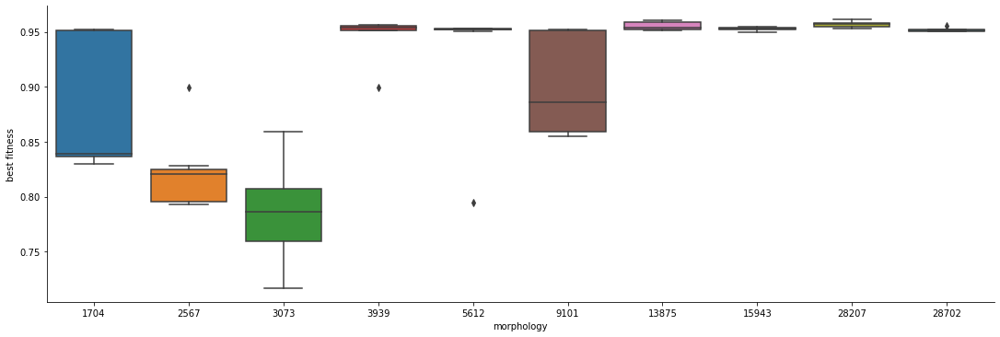

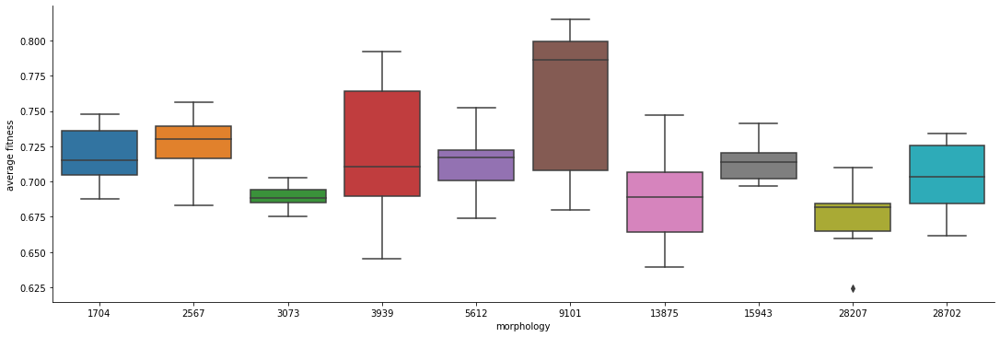

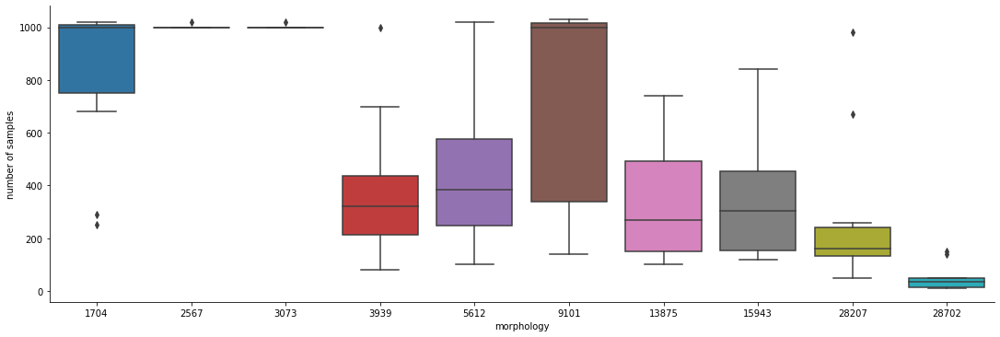

In [41]:
pmni_folder = "/home/leni/are-logs/pmnipes_escape_functPop_eval/"
Maze = "Escape Room"
best_fit_dict = dict()
avg_fit_dict = dict()
nbr_eval_dict = dict()
lines = []
for folder in os.listdir(pmni_folder) :
    for morph_dir in os.listdir(pmni_folder + folder) :
        if(morph_dir.split('_')[0] != "morph"):
            continue
        neval, best_ids, best_fit, avg_fit, pop_size = load_all_fitnesses(pmni_folder + folder + '/'+ morph_dir + "/fitnesses.csv",0)        
        key = int(morph_dir.split('_')[1])
        if(best_fit_dict.__contains__(key)) :

            best_fit_dict[key].append(best_fit[-1])
            avg_fit_dict[key].append(max(avg_fit))
            nbr_eval_dict[key].append(neval[-1])
        else :
            best_fit_dict.update({key:[best_fit[-1]]})
            avg_fit_dict.update({key:[max(avg_fit)]})
            nbr_eval_dict.update({key:[neval[-1]]})

descriptors = load_descriptor("/home/leni/git/genomes/20200929/traitDescriptor/lc_nsms_6_7_14-45-54-4875-4076501458/MD_Cart_WDH.csv",8)
ref_desc = np.full(8,0.5)
distances = []
sim_order = [0]
keys = list(avg_fit_dict.keys())
print(keys)
indexes = list(range(1,len(keys)))
k = 0
next_k = 1


avg_neval = []
for k,avg_fit,best_fit, nbr_eval in zip(avg_fit_dict.keys(),avg_fit_dict.values(),best_fit_dict.values(),nbr_eval_dict.values()) :
    avg_neval.append(np.mean(nbr_eval))
    for i in range(len(avg_fit)) :
        lines.append([k,avg_fit[i],best_fit[i],nbr_eval[i]])

        
count_1000 = 0
count_500 = 0
count_200 = 0
count_100 = 0
for v in avg_neval :
    if(v < 1000) :
        count_1000+=1
    if(v < 500):
        count_500+=1
    if(v < 200):
        count_200+=1
    if(v < 100):
        count_100+=1

print(count_1000/len(best_fit_dict)*100,"% of success with less than 1000 samples")
print(count_500/len(best_fit_dict)*100,"% of success with less than 500 samples")
print(count_200/len(best_fit_dict)*100,"% of success with less than 200 samples")
print(count_100/len(best_fit_dict)*100,"% of success with less than 100 samples")
print("Number of morphologies :",len(best_fit_dict))
    
d = pd.DataFrame(data=lines,columns=["morphology","average fitness","best fitness","number of samples"])

ax1 = sns.catplot(x="morphology",y="best fitness",data=d,kind="box",aspect=3,height=5)
ax2 = sns.catplot(x="morphology",y="average fitness",data=d,kind="box",aspect=3,height=5)
ax3 = sns.catplot(x="morphology",y="number of samples",data=d,kind="box",aspect=3,height=5)


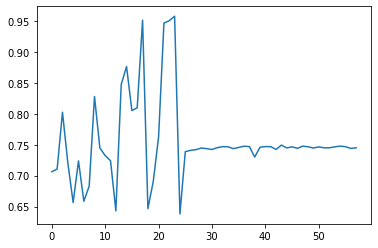

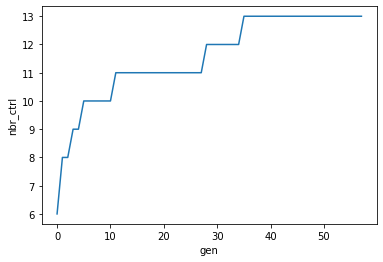

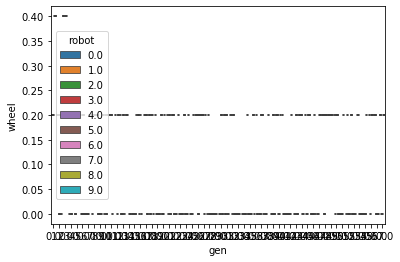

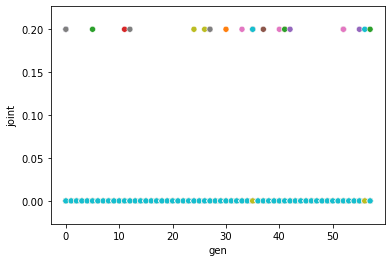

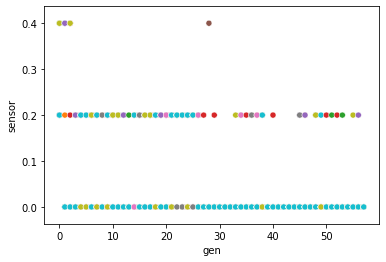

...

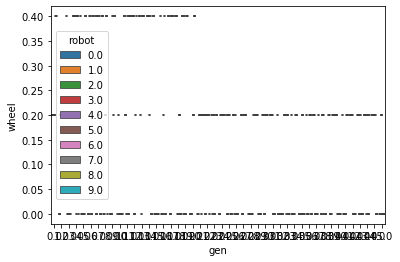

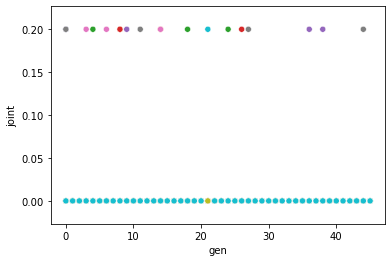

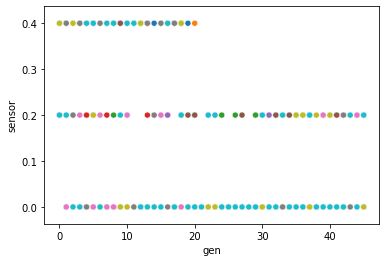

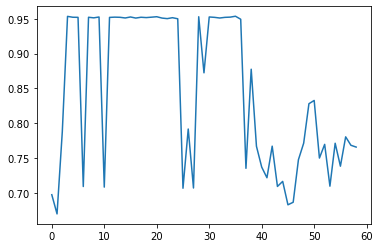

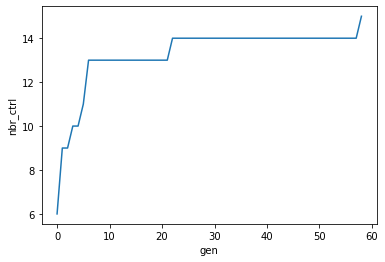

In [ ]:
for i in range(5):
    plt.plot(best_fits[i])
    plt.show()
    sns.lineplot(data=dataframes[i],x='gen',y='nbr_ctrl')
    plt.show()
    sns.scatterplot(data=morph_data[i],x='gen',y='wheel',hue='robot',legend=False)
    plt.show()
    sns.scatterplot(data=morph_data[i],x='gen',y='joint',hue='robot',legend=False)
    plt.show()
    sns.scatterplot(data=morph_data[i],x='gen',y='sensor',hue='robot',legend=False)
    plt.show()

In [66]:
exp_folder = "/home/leni/are-logs/mnipes_first_exp/escape/"
best_fits = []
avg_fits = []
for folder in os.listdir(exp_folder):
    neval, best_ids, best_fit, avg_fit, pop_size = load_all_fitnesses(exp_folder + folder + "/fitnesses.csv",0)
    best_fits.append(best_fit)
    avg_fits.append(avg_fit)


In [73]:
exp_folder = "/home/leni/are-logs/mnipes_first_exp/escape/"
dataframes=[]
for folder in os.listdir(exp_folder):
    lines = []
    for file in os.listdir(exp_folder + folder):
        if(file.split("_")[0] != "controller"):
            continue
        gen = float(file.split("archive")[-1])
        ctrl_arch = load_controller_archive(exp_folder + folder + "/" + file)
        nbr_ctrl=0
        for i,line in ctrl_arch.iterrows():
            if(line["fitness"] > 0):
                nbr_ctrl+=1
        lines.append([gen,nbr_ctrl])
    dataframes.append(pd.DataFrame(data=lines,columns=["gen","nbr_ctrl"]))

In [74]:
morph_data=[]
for folder in os.listdir(exp_folder):
    lines = []
    descriptors = load_descriptor(exp_folder + folder + "/MD_Cart_WDH.csv",8)
    for desc in descriptors:
        lines.append([desc[0],str(desc[1]),desc[6],desc[7],desc[8]])
    morph_data.append(pd.DataFrame(data=lines,columns=["gen","robot","wheel","sensor","joint"]))

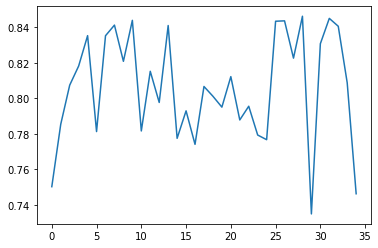

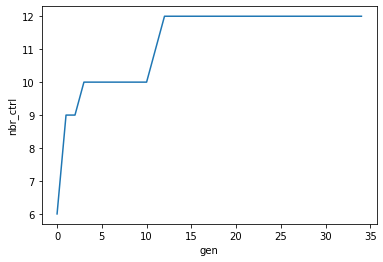

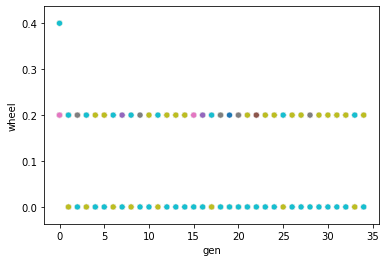

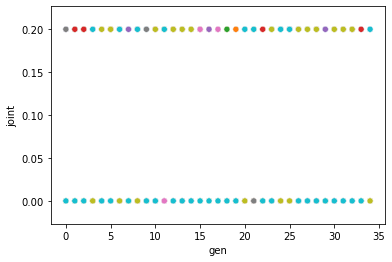

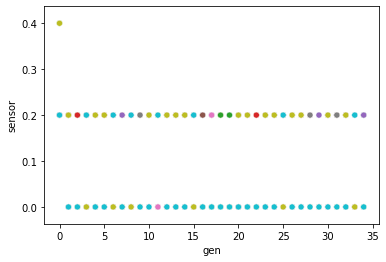

...

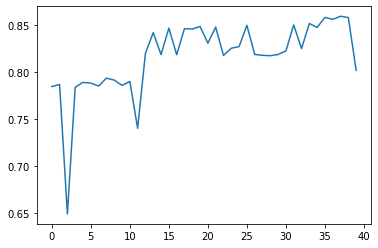

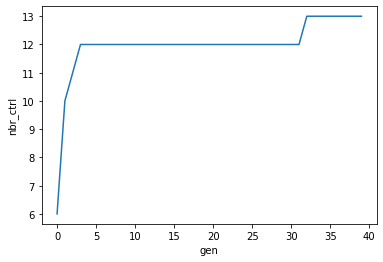

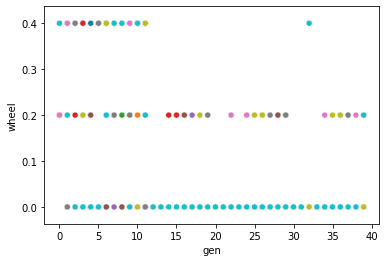

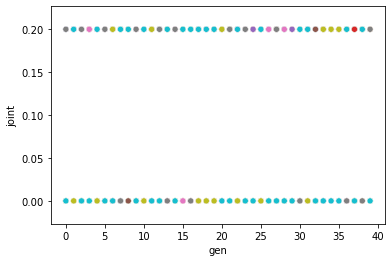

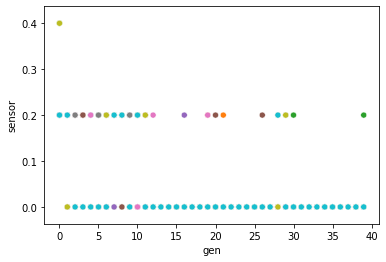

In [75]:
for i in range(5):
    plt.plot(best_fits[i])
    plt.show()
    sns.lineplot(data=dataframes[i],x='gen',y='nbr_ctrl')
    plt.show()
    sns.scatterplot(data=morph_data[i],x='gen',y='wheel',hue='robot',legend=False)
    plt.show()
    sns.scatterplot(data=morph_data[i],x='gen',y='joint',hue='robot',legend=False)
    plt.show()
    sns.scatterplot(data=morph_data[i],x='gen',y='sensor',hue='robot',legend=False)
    plt.show()

BEST FIT


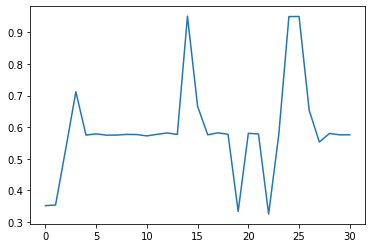

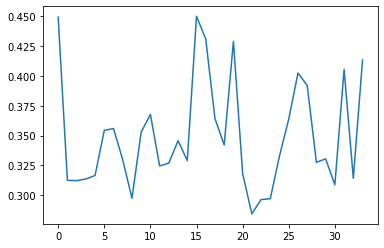

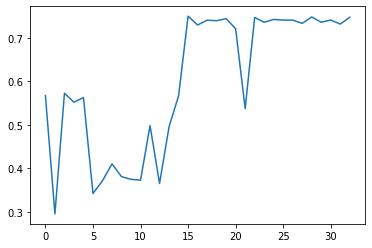

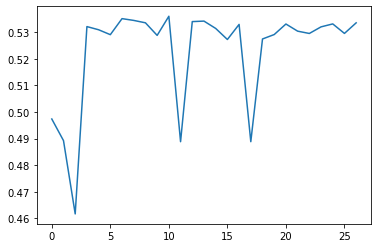

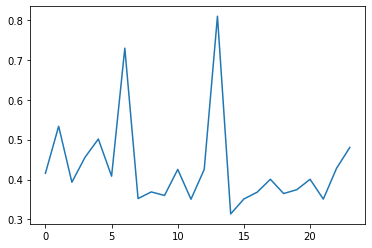

AVG FIT


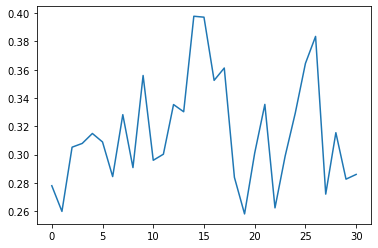

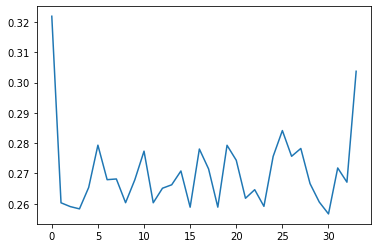

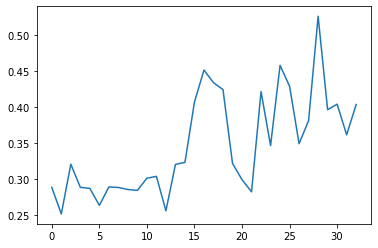

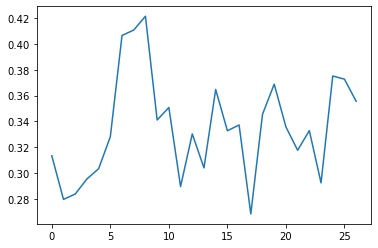

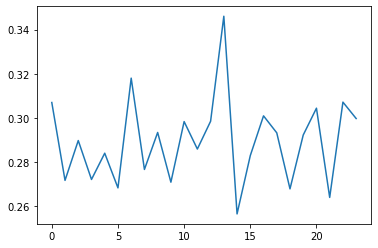

In [76]:
exp_folder = "/home/leni/are-logs/mnipes_first_exp/easy/"
best_fits = []
avg_fits = []
for folder in os.listdir(exp_folder):
    neval, best_ids, best_fit, avg_fit, pop_size = load_all_fitnesses(exp_folder + folder + "/fitnesses.csv",0)
    best_fits.append(best_fit)
    avg_fits.append(avg_fit)
print("BEST FIT")
for fit in best_fits:
    plt.plot(fit)
    plt.show()

print("AVG FIT")
for fit in avg_fits:
    plt.plot(fit)
    plt.show()


BEST FIT


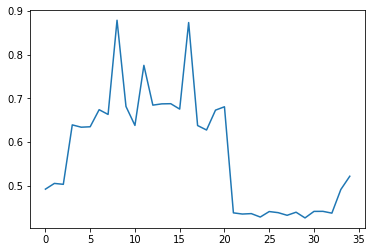

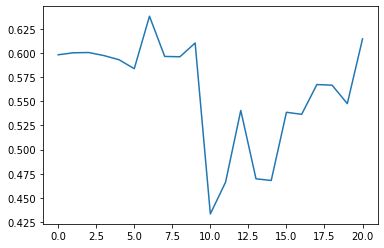

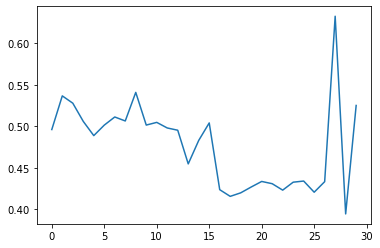

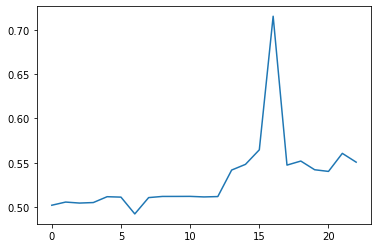

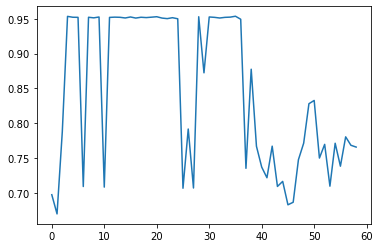

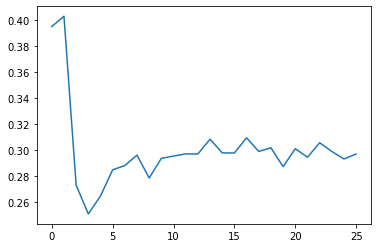

AVG FIT


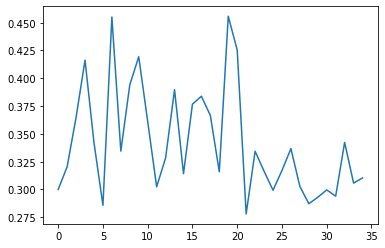

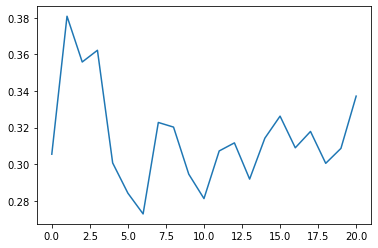

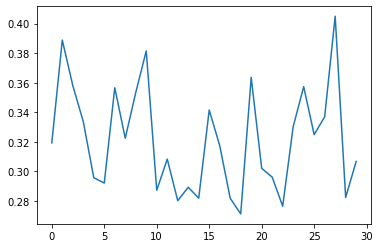

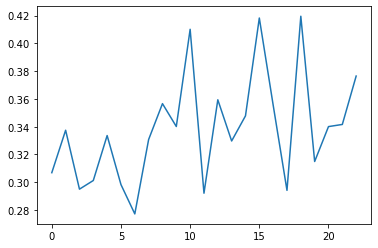

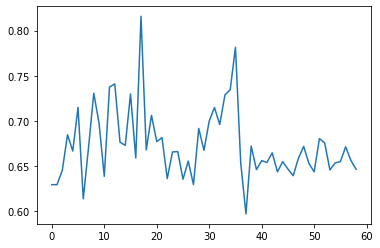

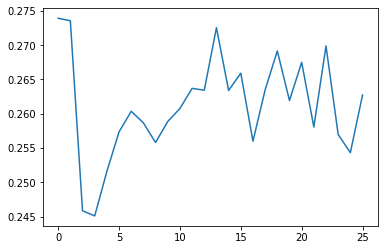

In [9]:
exp_folder = "/home/leni/are-logs/mnipes_first_exp/hard/"
best_fits = []
avg_fits = []
for folder in os.listdir(exp_folder):
    neval, best_ids, best_fit, avg_fit, pop_size = load_all_fitnesses(exp_folder + folder + "/fitnesses.csv",0)
    best_fits.append(best_fit)
    avg_fits.append(avg_fit)

print("BEST FIT")
for fit in best_fits:
    plt.plot(fit)
    plt.show()

print("AVG FIT")
for fit in avg_fits:
    plt.plot(fit)
    plt.show()


In [150]:
nocap_v_wcap = []
speedup_nvw = []

In [209]:
exp_folder = "/home/leni/are-logs/mnipes_second_exp/arena/"
best_fits = []
avg_fits = []
neval_per_gen = []
for folder in os.listdir(exp_folder):
    print(folder)
    neval, best_ids, best_fit, avg_fit, pop_size = load_all_fitnesses(exp_folder + folder + "/fitnesses.csv",0)
    nbr_eval = load_number_of_eval_per_gen(exp_folder + folder,len(best_fit))
    best_fits.append(best_fit)
    avg_fits.append(avg_fit)
    neval_per_gen.append(nbr_eval)
    nocap_v_wcap.append(["with archive","arena",max(best_fit),max(avg_fit),np.mean(best_fit),np.mean(avg_fit)])

mnipes_18_10_11-15-21-1798-2901853271
mnipes_18_10_11-15-17-7440-3455352808
mnipes_18_10_11-15-23-3637-3772116629
mnipes_18_10_11-15-27-7559-1773119749
mnipes_18_10_11-15-27-7576-4271991905


In [210]:
dataframes=[]
for folder in os.listdir(exp_folder):
    lines = []
    for file in os.listdir(exp_folder + folder):
        if(file.split("_")[0] != "controller"):
            continue
        gen = float(file.split("archive")[-1])
        ctrl_arch = load_controller_archive(exp_folder + folder + "/" + file)
        nbr_ctrl=0
        for i,line in ctrl_arch.iterrows():
            if(line["fitness"] > 0):
                nbr_ctrl+=1
        lines.append([gen,nbr_ctrl])
    dataframes.append(pd.DataFrame(data=lines,columns=["gen","nbr_ctrl"]))

In [211]:
morph_data=[]
for folder in os.listdir(exp_folder):
    lines = []
    descriptors = load_descriptor(exp_folder + folder + "/MD_Cart_WDH.csv",8)
    for desc in descriptors:
        lines.append([desc[0],str(desc[1]),desc[6]*5,desc[7]*5,desc[8]*5])
    morph_data.append(pd.DataFrame(data=lines,columns=["gen","robot","wheel","sensor","joint"]))

In [212]:
speedup = []
neval = []
for i in range(5):
    theo_max = [2000]*len(neval_per_gen[i])
    cumul_neval = copy.copy(neval_per_gen[i])    
    speedup.append(np.array(theo_max) - np.array(neval_per_gen[i]))
    for j in range(len(neval_per_gen[i])-1):
        cumul_neval[j+1]+=cumul_neval[j]
    neval.append(cumul_neval)
    speedup_nvw.append(["with archive","arena",max(speedup[-1]),np.mean(speedup[-1])])

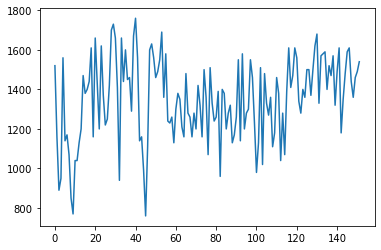

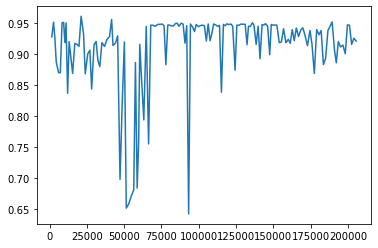

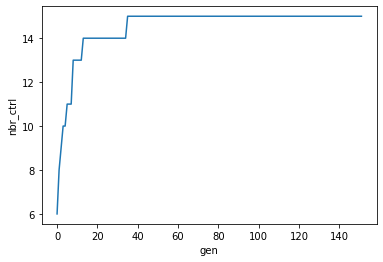

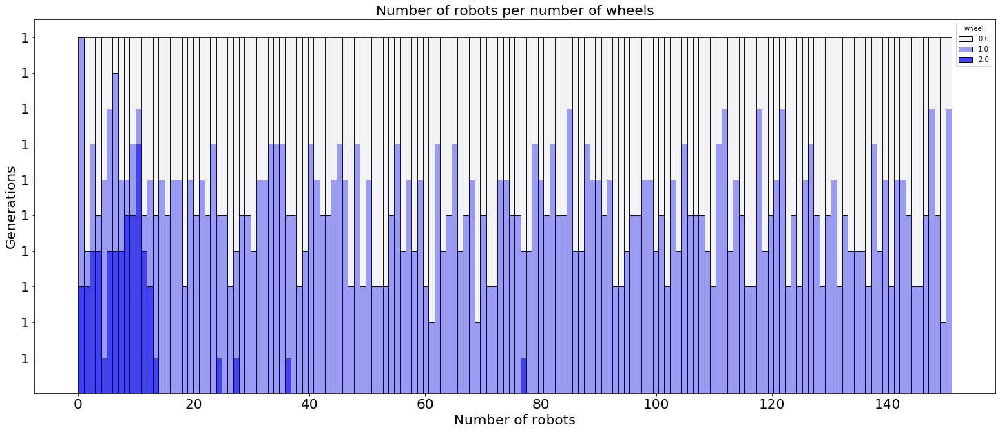

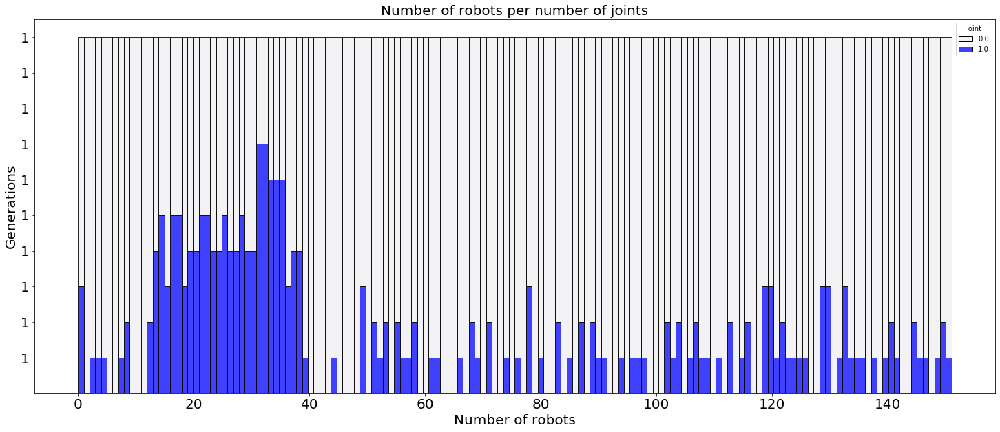

...

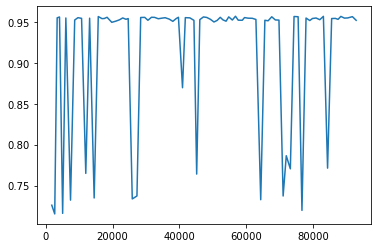

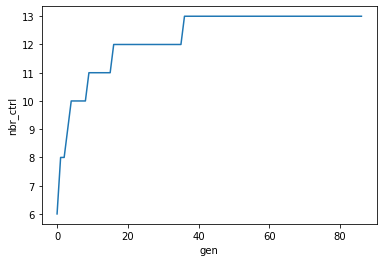

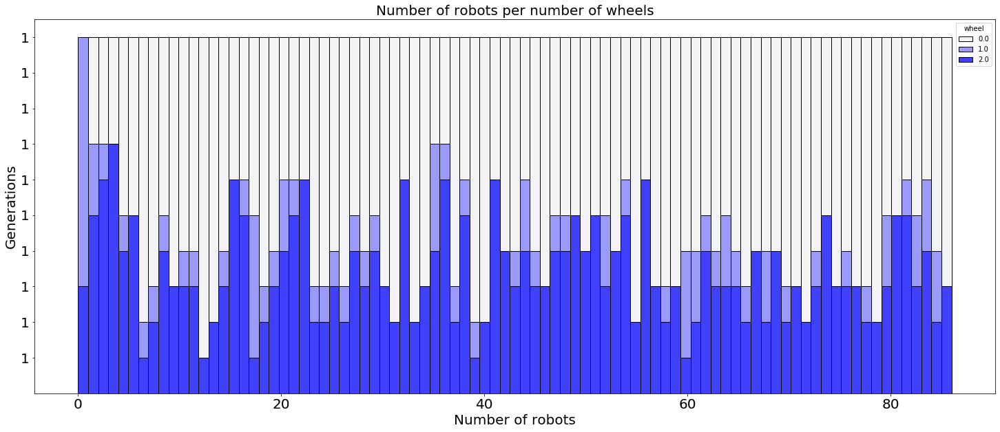

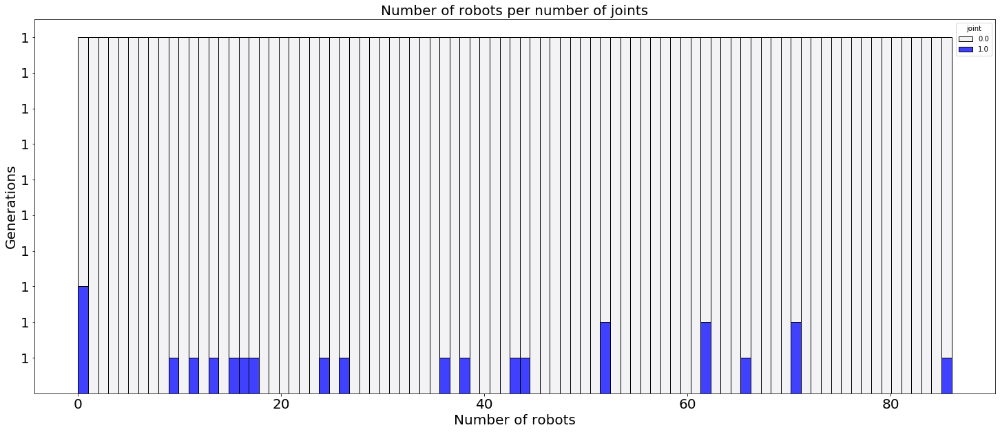

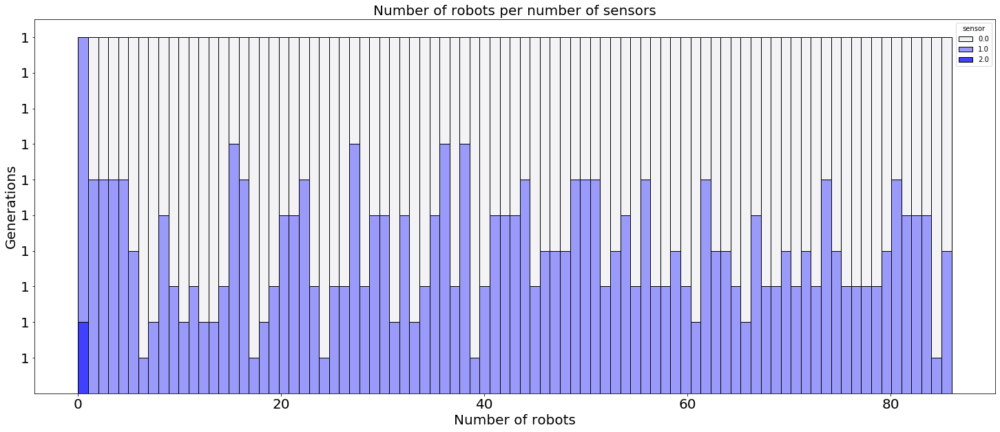

In [214]:
for i in range(5):
    plt.plot(neval_per_gen[i])
    plt.show()
    plt.plot(neval[i],best_fits[i])
    plt.show()
    sns.lineplot(data=dataframes[i],x='gen',y='nbr_ctrl')
    plt.show()
    plot_hist_nbr_rob("Number of robots per number of wheels",morph_data,'wheel')
    plot_hist_nbr_rob("Number of robots per number of joints",morph_data,'joint')
    plot_hist_nbr_rob("Number of robots per number of sensors",morph_data,'sensor')

In [201]:
exp_folder = "/home/leni/are-logs/mnipes_second_exp/escape/"
best_fits = []
avg_fits = []
neval_per_gen = []
for folder in os.listdir(exp_folder):
    print(folder)
    neval, best_ids, best_fit, avg_fit, pop_size = load_all_fitnesses(exp_folder + folder + "/fitnesses.csv",0)
    nbr_eval = load_number_of_eval_per_gen(exp_folder + folder,len(best_fit))
    best_fits.append(best_fit)
    avg_fits.append(avg_fit)
    neval_per_gen.append(nbr_eval)
    nocap_v_wcap.append(["with archive","escape",max(best_fit),max(avg_fit),np.mean(best_fit),np.mean(avg_fit)])

mnipes_18_10_11-14-26-6731-694868892
mnipes_18_10_11-14-45-5063-1659556997
mnipes_18_10_11-14-28-8516-2056406433
mnipes_18_10_11-14-39-9603-2958452000
mnipes_18_10_11-14-37-7441-2118960898


In [202]:
dataframes=[]
for folder in os.listdir(exp_folder):
    lines = []
    for file in os.listdir(exp_folder + folder):
        if(file.split("_")[0] != "controller"):
            continue
        gen = float(file.split("archive")[-1])
        ctrl_arch = load_controller_archive(exp_folder + folder + "/" + file)
        nbr_ctrl=0
        for i,line in ctrl_arch.iterrows():
            if(line["fitness"] > 0):
                nbr_ctrl+=1
        lines.append([gen,nbr_ctrl])
    dataframes.append(pd.DataFrame(data=lines,columns=["gen","nbr_ctrl"]))

In [203]:
morph_data=[]
for folder in os.listdir(exp_folder):
    lines = []
    descriptors = load_descriptor(exp_folder + folder + "/MD_Cart_WDH.csv",8)
    for desc in descriptors:
        lines.append([desc[0],str(desc[1]),desc[6]*5,desc[7]*5,desc[8]*5])
    morph_data.append(pd.DataFrame(data=lines,columns=["gen","robot","wheel","sensor","joint"]))

In [205]:
speedup = []
neval = []
for i in range(5):
    theo_max = [2000]*len(neval_per_gen[i])
    cumul_neval = copy.copy(neval_per_gen[i])    
    speedup.append(np.array(theo_max) - np.array(neval_per_gen[i]))
    for j in range(len(neval_per_gen[i])-1):
        cumul_neval[j+1]+=cumul_neval[j]
    neval.append(cumul_neval)
    speedup_nvw.append(["with archive","escape",max(speedup[-1]),np.mean(speedup[-1])])

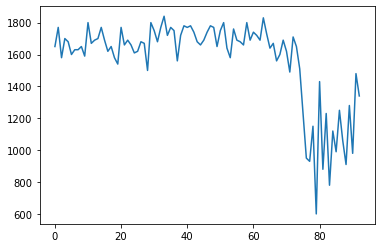

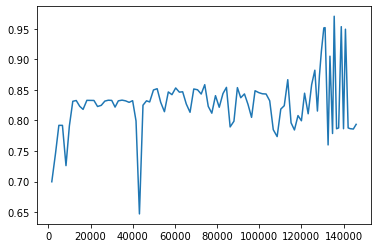

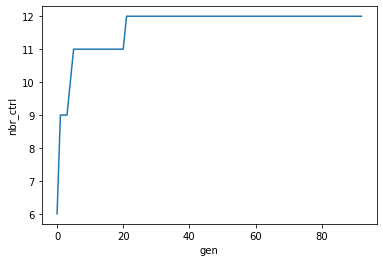

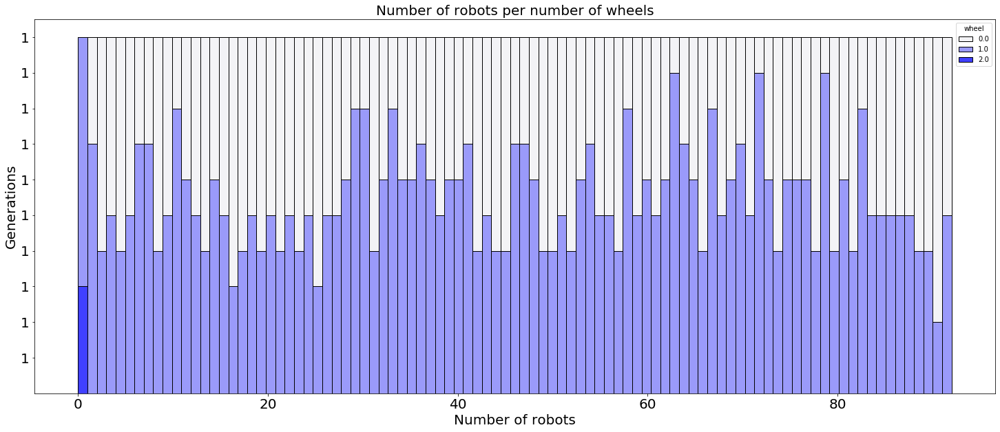

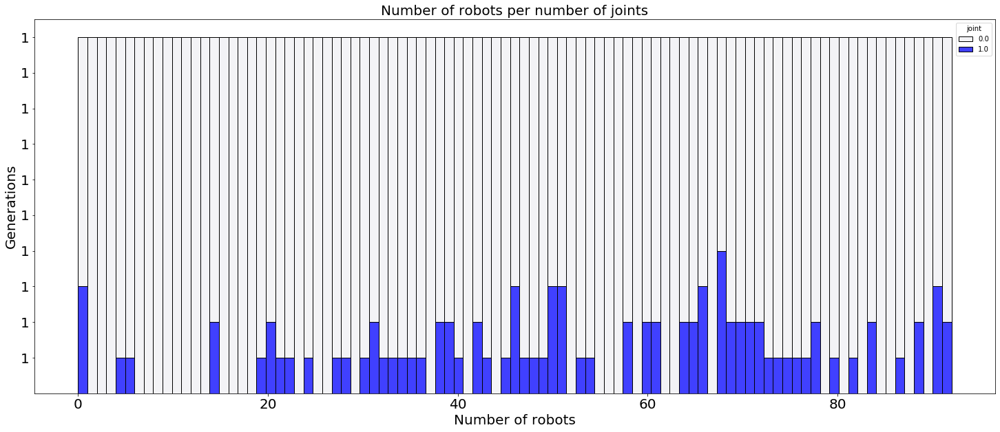

...

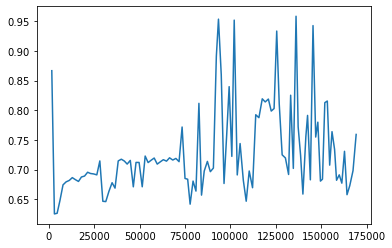

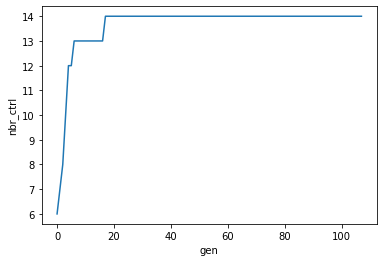

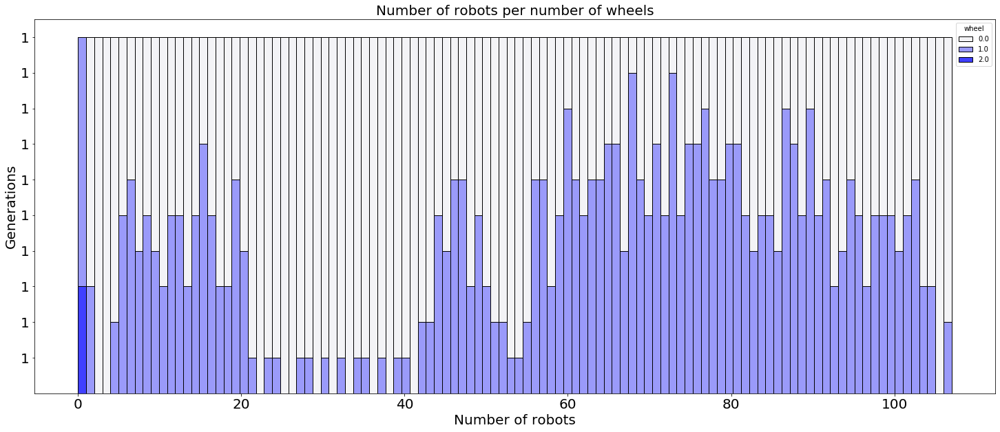

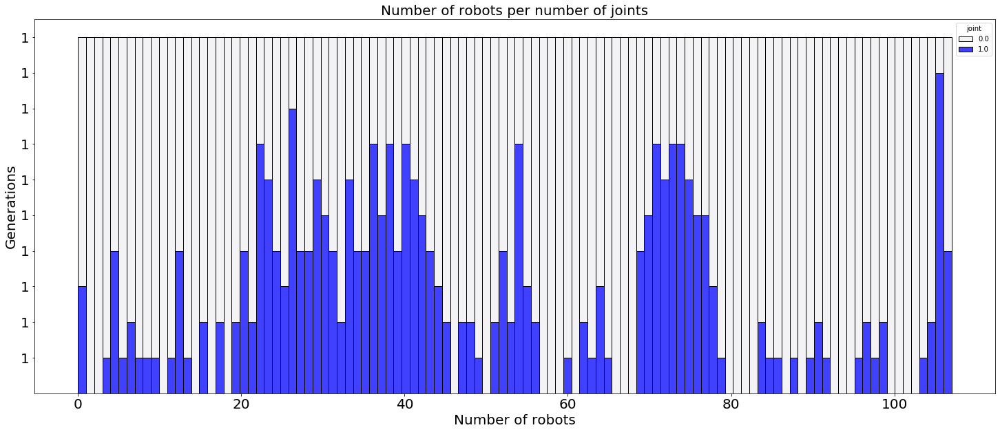

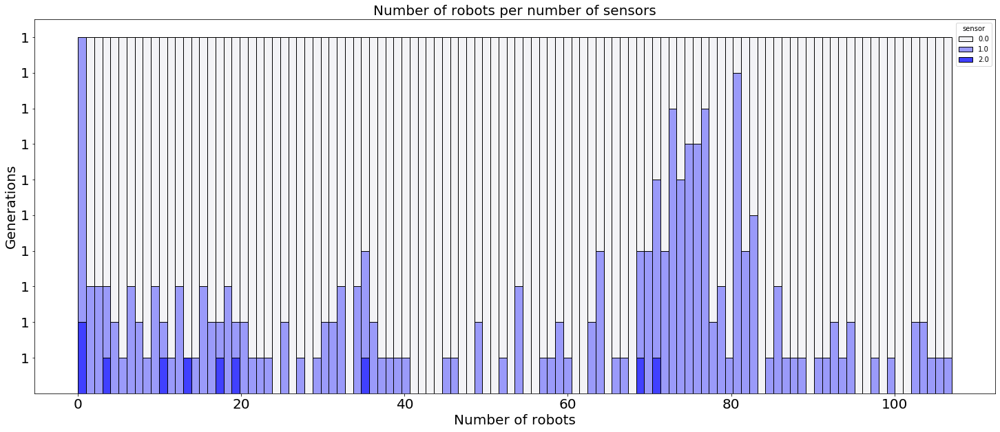

In [206]:
for i in range(5):
    plt.plot(neval_per_gen[i])
    plt.show()
    plt.plot(neval[i],best_fits[i])
    plt.show()
    sns.lineplot(data=dataframes[i],x='gen',y='nbr_ctrl')
    plt.show()
    plot_hist_nbr_rob("Number of robots per number of wheels",morph_data,'wheel')
    plot_hist_nbr_rob("Number of robots per number of joints",morph_data,'joint')
    plot_hist_nbr_rob("Number of robots per number of sensors",morph_data,'sensor')

In [161]:
exp_folder = "/home/leni/are-logs/mnipes_second_exp/easy/"
best_fits = []
avg_fits = []
neval_per_gen = []
for folder in os.listdir(exp_folder):
    neval, best_ids, best_fit, avg_fit, pop_size = load_all_fitnesses(exp_folder + folder + "/fitnesses.csv",0)
    nbr_eval = load_number_of_eval_per_gen(exp_folder + folder,len(best_fit))
    best_fits.append(best_fit)
    avg_fits.append(avg_fit)
    neval_per_gen.append(nbr_eval)
    nocap_v_wcap.append(["with archive","easy",max(best_fit),max(avg_fit),np.mean(best_fit),np.mean(avg_fit)])

In [162]:
dataframes=[]
for folder in os.listdir(exp_folder):
    lines = []
    for file in os.listdir(exp_folder + folder):
        if(file.split("_")[0] != "controller"):
            continue
        gen = float(file.split("archive")[-1])
        ctrl_arch = load_controller_archive(exp_folder + folder + "/" + file)
        nbr_ctrl=0
        for i,line in ctrl_arch.iterrows():
            if(line["fitness"] > 0):
                nbr_ctrl+=1
        lines.append([gen,nbr_ctrl])
    dataframes.append(pd.DataFrame(data=lines,columns=["gen","nbr_ctrl"]))

In [163]:
morph_data=[]
for folder in os.listdir(exp_folder):
    lines = []
    descriptors = load_descriptor(exp_folder + folder + "/MD_Cart_WDH.csv",8)
    for desc in descriptors:
        lines.append([desc[0],str(desc[1]),desc[6],desc[7],desc[8]])
    morph_data.append(pd.DataFrame(data=lines,columns=["gen","robot","wheel","sensor","joint"]))

In [164]:
speedup = []
neval = []
for i in range(4):
    theo_max = [2000]*len(neval_per_gen[i])
    cumul_neval = neval_per_gen[i]    
    speedup.append(np.array(theo_max) - np.array(neval_per_gen[i]))
    for j in range(len(neval_per_gen[i])-1):
        cumul_neval[j+1]+=cumul_neval[j]
    neval.append(cumul_neval)
    speedup_nvw.append(["with archive","easy",max(speedup[-1]),np.mean(speedup[-1])])

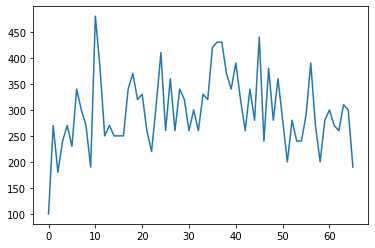

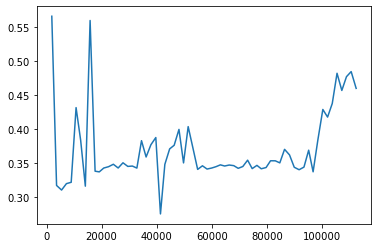

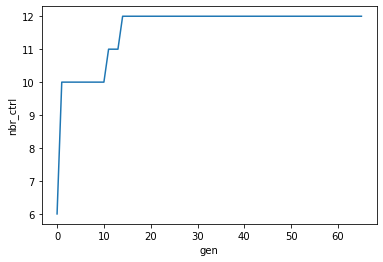

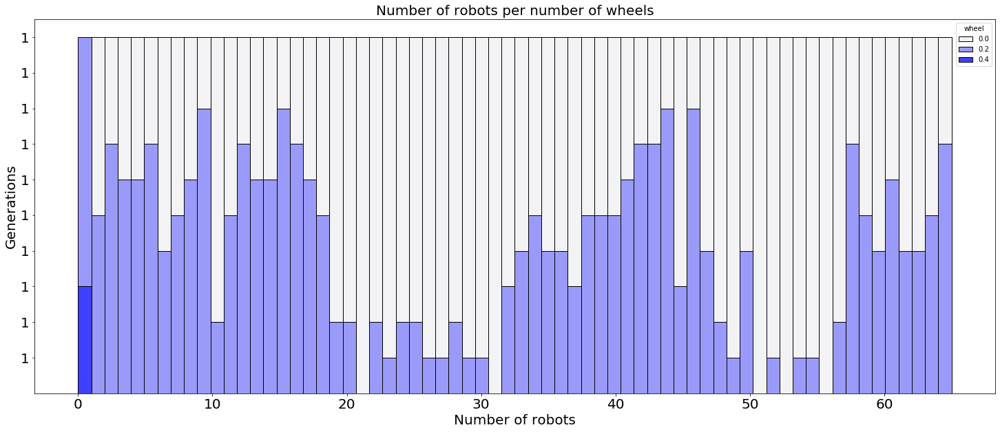

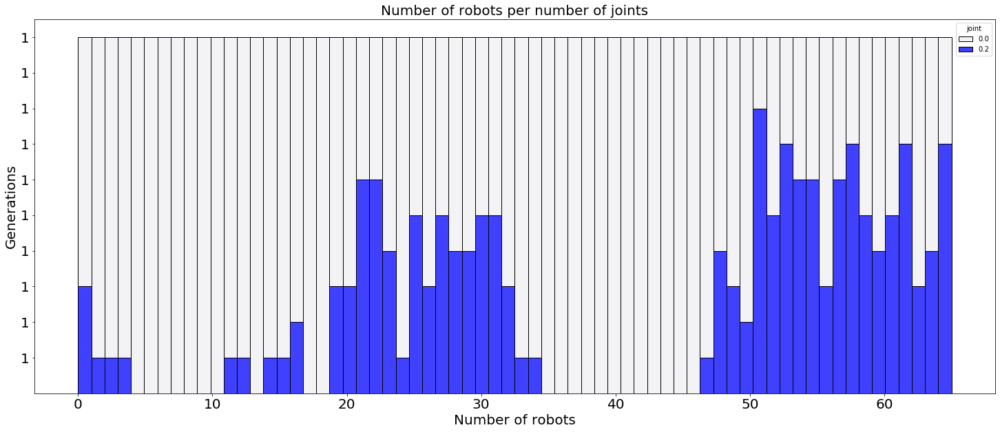

...

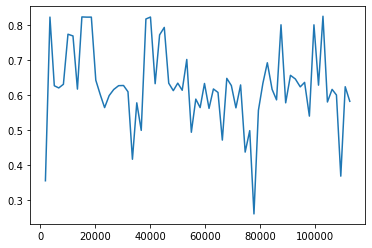

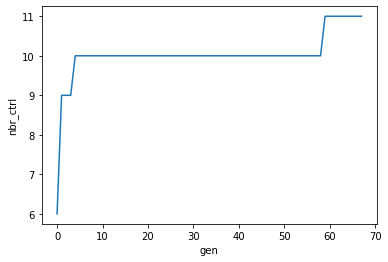

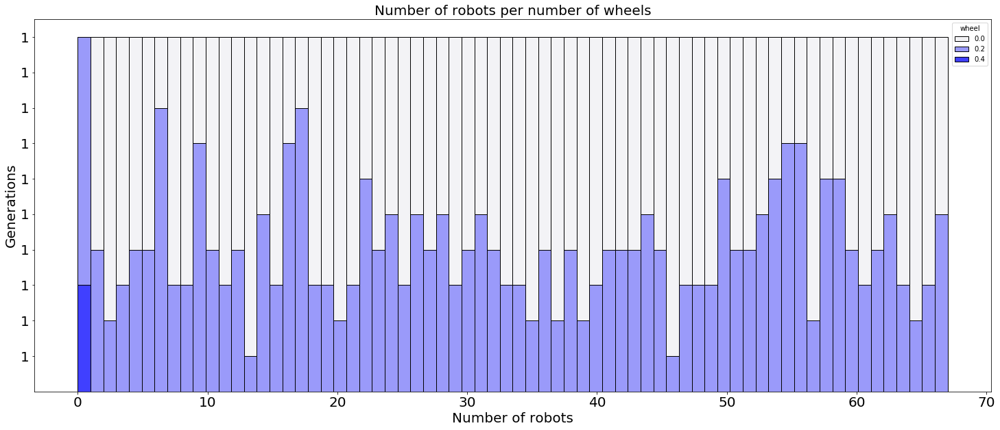

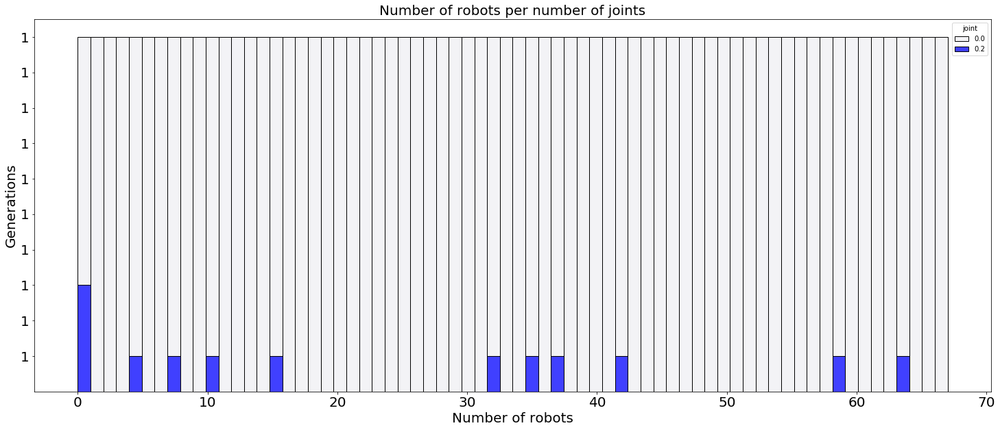

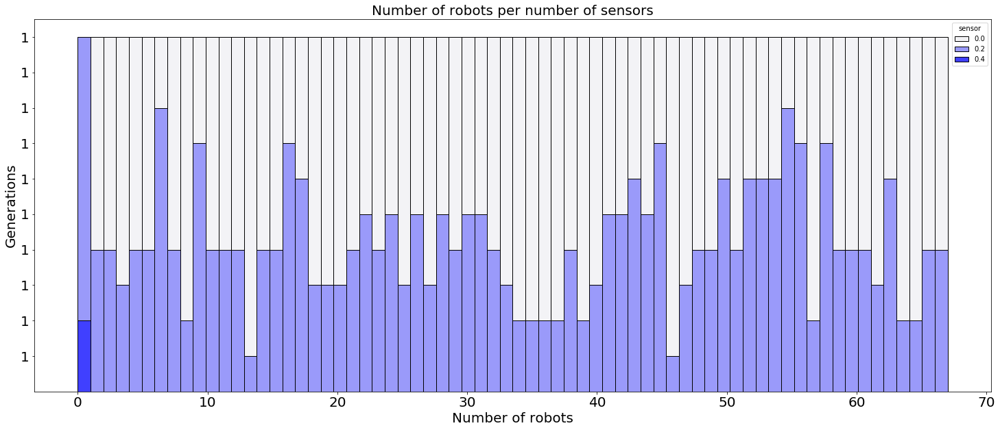

IndexError: list index out of range

In [165]:
for i in range(5):
    plt.plot(speedup[i])
    plt.show()
    plt.plot(neval[i],best_fits[i])
    plt.show()
    sns.lineplot(data=dataframes[i],x='gen',y='nbr_ctrl')
    plt.show()
    plot_hist_nbr_rob("Number of robots per number of wheels",morph_data,'wheel')
    plot_hist_nbr_rob("Number of robots per number of joints",morph_data,'joint')
    plot_hist_nbr_rob("Number of robots per number of sensors",morph_data,'sensor')

In [166]:
exp_folder = "/home/leni/are-logs/mnipes_second_exp/hard/"
best_fits = []
avg_fits = []
neval_per_gen = []
for folder in os.listdir(exp_folder):
    neval, best_ids, best_fit, avg_fit, pop_size = load_all_fitnesses(exp_folder + folder + "/fitnesses.csv",0)
    nbr_eval = load_number_of_eval_per_gen(exp_folder + folder,len(best_fit))
    best_fits.append(best_fit)
    avg_fits.append(avg_fit)
    neval_per_gen.append(nbr_eval)
    nocap_v_wcap.append(["with archive","hard",max(best_fit),max(avg_fit),np.mean(best_fit),np.mean(avg_fit)])

In [167]:
dataframes=[]
for folder in os.listdir(exp_folder):
    lines = []
    for file in os.listdir(exp_folder + folder):
        if(file.split("_")[0] != "controller"):
            continue
        gen = float(file.split("archive")[-1])
        ctrl_arch = load_controller_archive(exp_folder + folder + "/" + file)
        nbr_ctrl=0
        for i,line in ctrl_arch.iterrows():
            if(line["fitness"] > 0):
                nbr_ctrl+=1
        lines.append([gen,nbr_ctrl])
    dataframes.append(pd.DataFrame(data=lines,columns=["gen","nbr_ctrl"]))

In [168]:
morph_data=[]
for folder in os.listdir(exp_folder):
    lines = []
    descriptors = load_descriptor(exp_folder + folder + "/MD_Cart_WDH.csv",8)
    for desc in descriptors:
        lines.append([desc[0],str(desc[1]),desc[6],desc[7],desc[8]])
    morph_data.append(pd.DataFrame(data=lines,columns=["gen","robot","wheel","sensor","joint"]))

In [169]:
speedup = []
neval = []
for i in range(4):
    theo_max = [2000]*len(neval_per_gen[i])
    cumul_neval = neval_per_gen[i]    
    speedup.append(np.array(theo_max) - np.array(neval_per_gen[i]))
    for j in range(len(neval_per_gen[i])-1):
        cumul_neval[j+1]+=cumul_neval[j]
    neval.append(cumul_neval)
    speedup_nvw.append(["with archive","hard",max(speedup[-1]),np.mean(speedup[-1])])

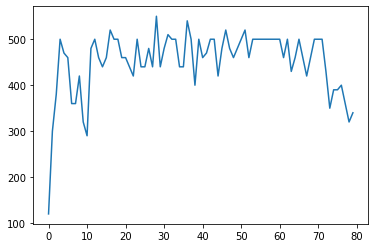

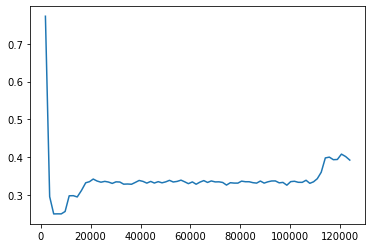

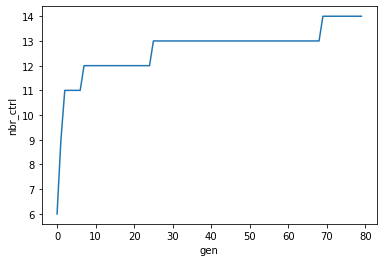

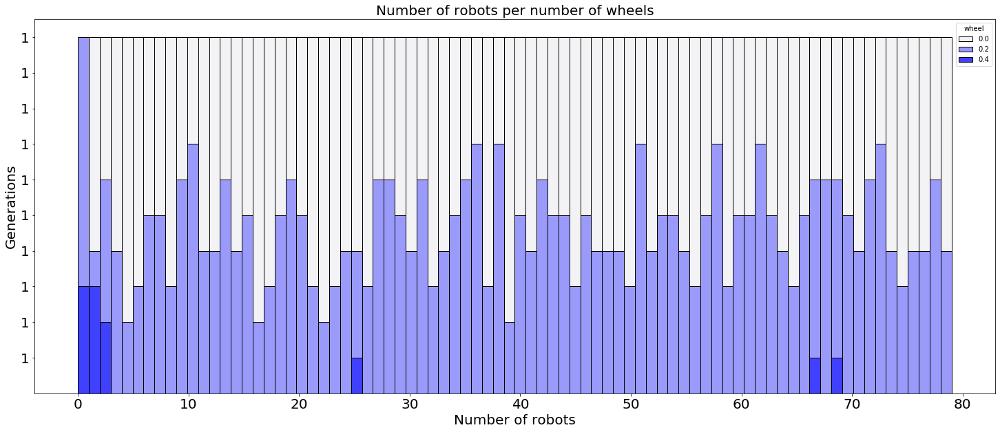

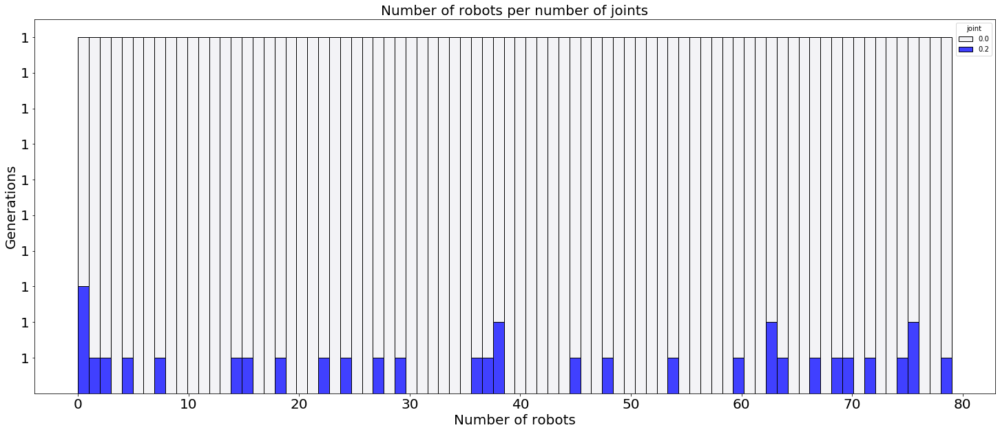

...

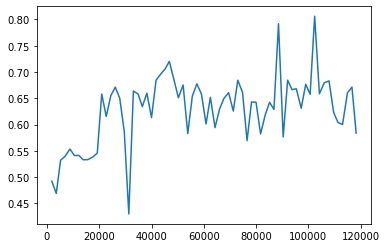

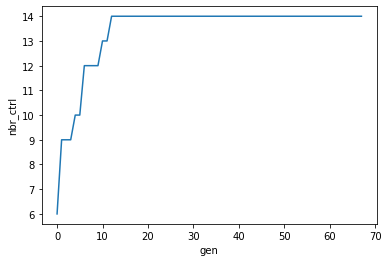

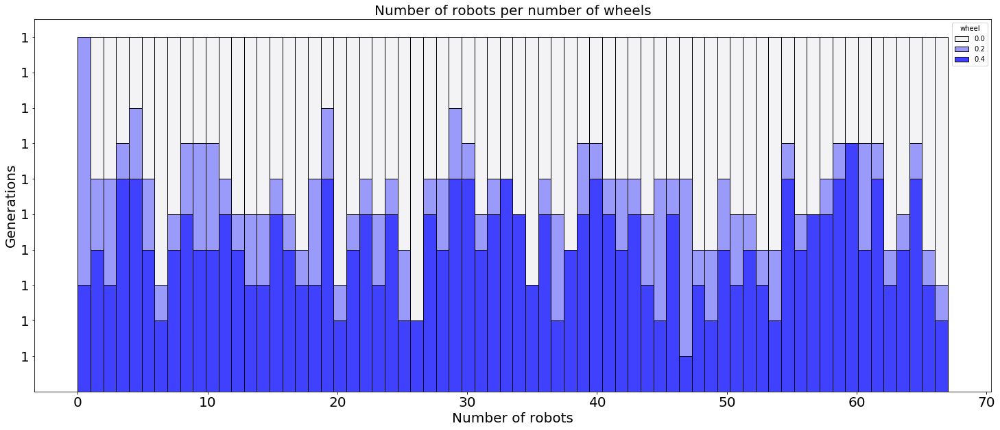

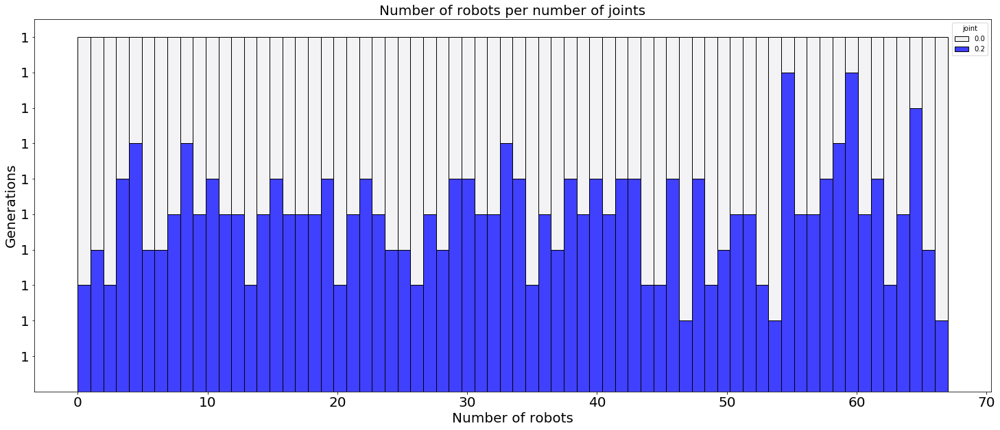

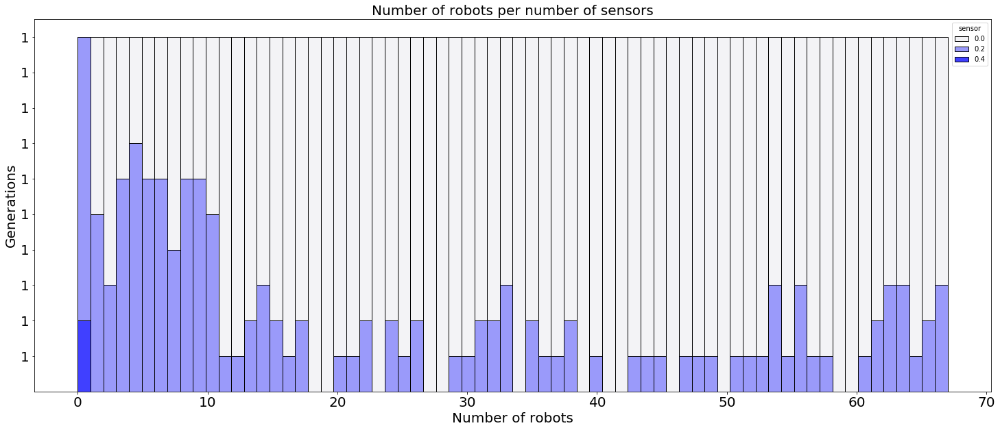

IndexError: list index out of range

In [170]:
for i in range(5):
    plt.plot(speedup[i])
    plt.show()
    plt.plot(neval[i],best_fits[i])
    plt.show()
    sns.lineplot(data=dataframes[i],x='gen',y='nbr_ctrl')
    plt.show()
    plot_hist_nbr_rob("Number of robots per number of wheels",morph_data,'wheel')
    plot_hist_nbr_rob("Number of robots per number of joints",morph_data,'joint')
    plot_hist_nbr_rob("Number of robots per number of sensors",morph_data,'sensor')

In [171]:
exp_folder = "/home/leni/are-logs/mnipes_third_exp_noca/arena/"
best_fits = []
avg_fits = []
neval_per_gen = []
for folder in os.listdir(exp_folder):
    neval, best_ids, best_fit, avg_fit, pop_size = load_all_fitnesses(exp_folder + folder + "/fitnesses.csv",0)
    nbr_eval = load_number_of_eval_per_gen(exp_folder + folder,len(best_fit))
    best_fits.append(best_fit)
    avg_fits.append(avg_fit)
    neval_per_gen.append(nbr_eval)
    nocap_v_wcap.append(["no archive","arena",max(best_fit),max(avg_fit),np.mean(best_fit),np.mean(avg_fit)])

In [172]:
morph_data=[]
for folder in os.listdir(exp_folder):
    lines = []
    descriptors = load_descriptor(exp_folder + folder + "/MD_Cart_WDH.csv",8)
    for desc in descriptors:
        lines.append([desc[0],str(desc[1]),desc[6],desc[7],desc[8]])
    morph_data.append(pd.DataFrame(data=lines,columns=["gen","robot","wheel","sensor","joint"]))

In [173]:
speedup = []
neval = []
for i in range(4):
    theo_max = [2000]*len(neval_per_gen[i])
    cumul_neval = neval_per_gen[i]    
    speedup.append(np.array(theo_max) - np.array(neval_per_gen[i]))
    for j in range(len(neval_per_gen[i])-1):
        cumul_neval[j+1]+=cumul_neval[j]
    neval.append(cumul_neval)
    speedup_nvw.append(["no archive","arena",max(speedup[-1]),np.mean(speedup[-1])])

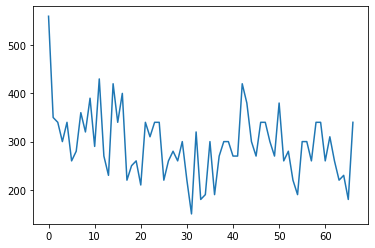

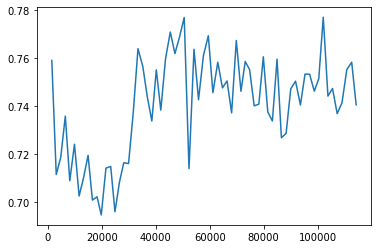

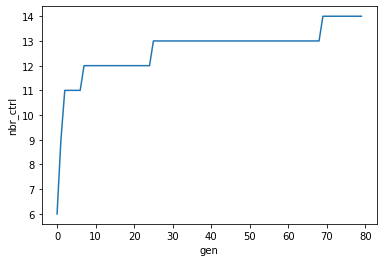

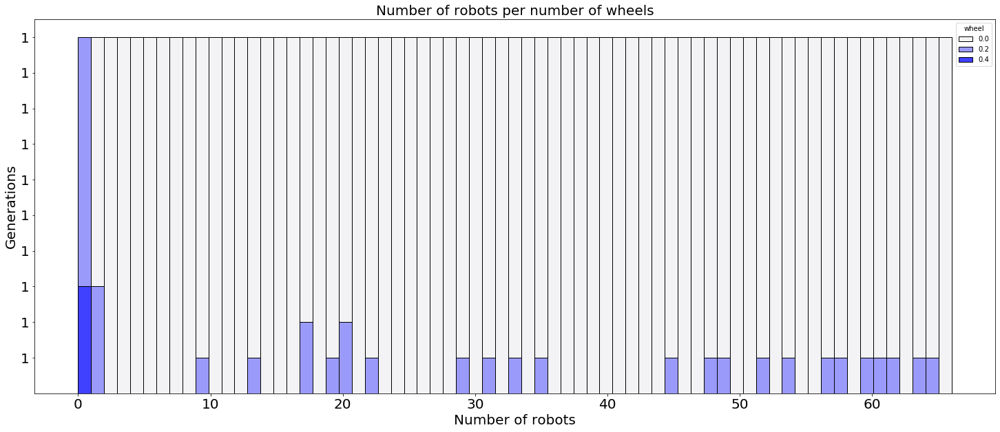

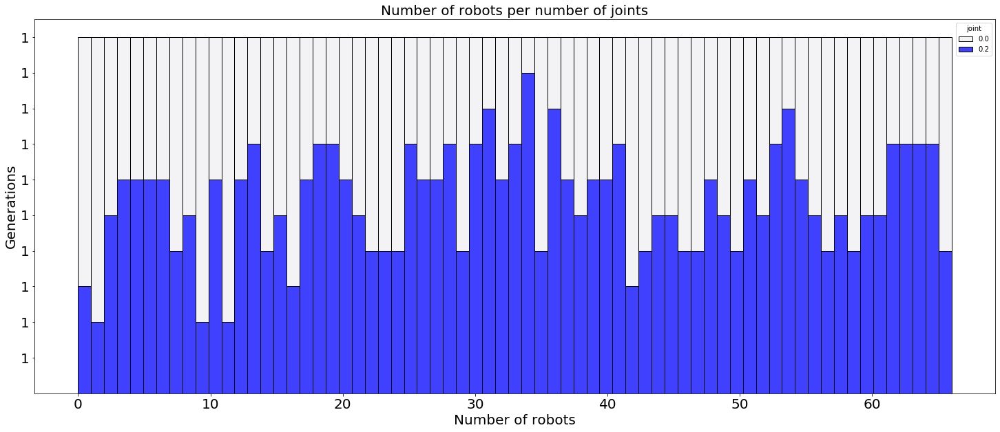

...

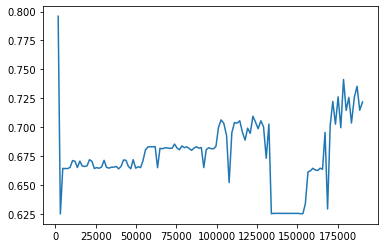

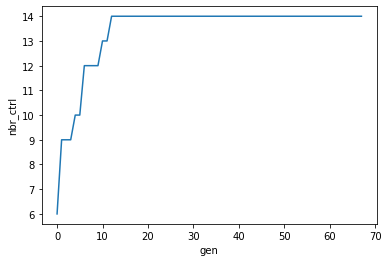

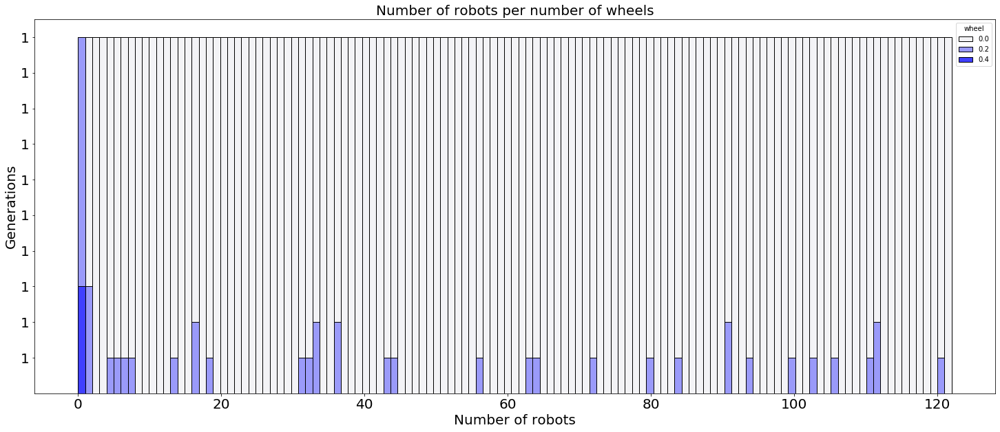

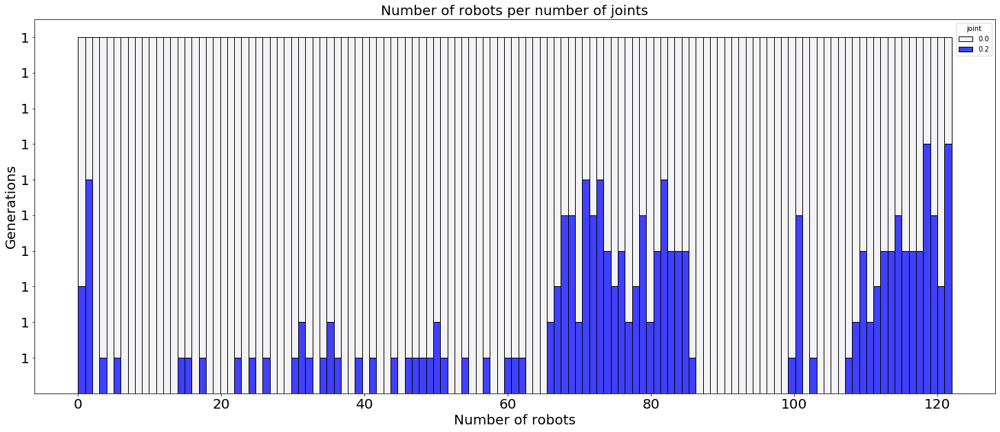

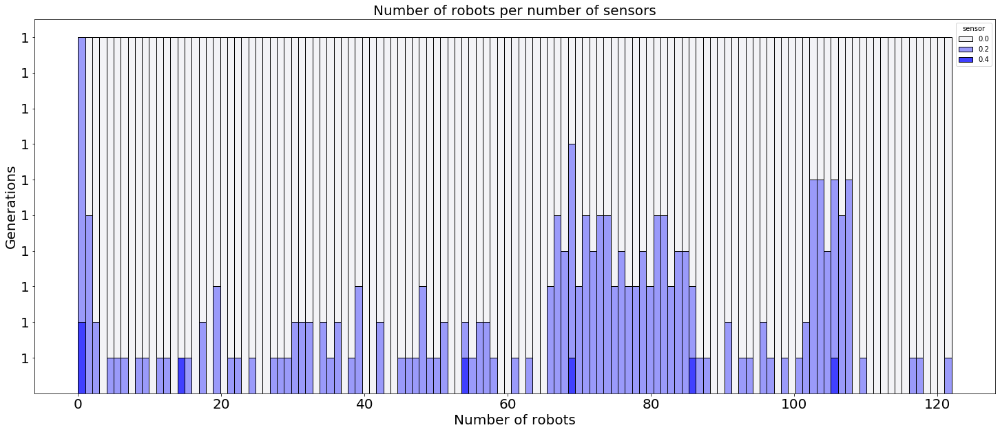

IndexError: list index out of range

In [174]:
for i in range(5):
    plt.plot(speedup[i])
    plt.show()
    plt.plot(neval[i],best_fits[i])
    plt.show()
    sns.lineplot(data=dataframes[i],x='gen',y='nbr_ctrl')
    plt.show()
    plot_hist_nbr_rob("Number of robots per number of wheels",morph_data,'wheel')
    plot_hist_nbr_rob("Number of robots per number of joints",morph_data,'joint')
    plot_hist_nbr_rob("Number of robots per number of sensors",morph_data,'sensor')

In [176]:
exp_folder = "/home/leni/are-logs/mnipes_third_exp_noca/escape/"
best_fits = []
avg_fits = []
neval_per_gen = []
for folder in os.listdir(exp_folder):
    neval, best_ids, best_fit, avg_fit, pop_size = load_all_fitnesses(exp_folder + folder + "/fitnesses.csv",0)
    nbr_eval = load_number_of_eval_per_gen(exp_folder + folder,len(best_fit))
    best_fits.append(best_fit)
    avg_fits.append(avg_fit)
    neval_per_gen.append(nbr_eval)
    nocap_v_wcap.append(["no archive","escape",max(best_fit),max(avg_fit),np.mean(best_fit),np.mean(avg_fit)])

In [177]:
morph_data=[]
for folder in os.listdir(exp_folder):
    lines = []
    descriptors = load_descriptor(exp_folder + folder + "/MD_Cart_WDH.csv",8)
    for desc in descriptors:
        lines.append([desc[0],str(desc[1]),desc[6]*5,desc[7]*5,desc[8]*5])
    morph_data.append(pd.DataFrame(data=lines,columns=["gen","robot","wheel","sensor","joint"]))

In [178]:
speedup = []
neval = []
for i in range(4):
    theo_max = [2000]*len(neval_per_gen[i])
    cumul_neval = neval_per_gen[i]    
    speedup.append(np.array(theo_max) - np.array(neval_per_gen[i]))
    for j in range(len(neval_per_gen[i])-1):
        cumul_neval[j+1]+=cumul_neval[j]
    neval.append(cumul_neval)
    speedup_nvw.append(["no archive","escape",max(speedup[-1]),np.mean(speedup[-1])])

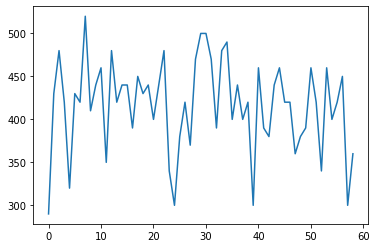

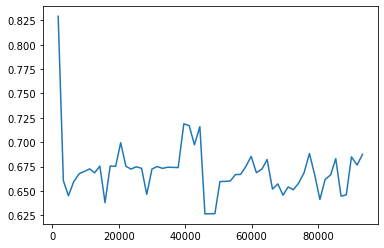

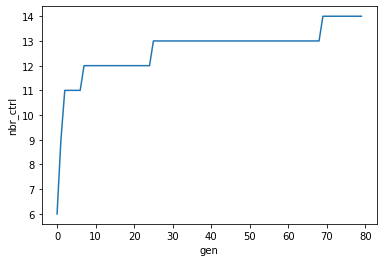

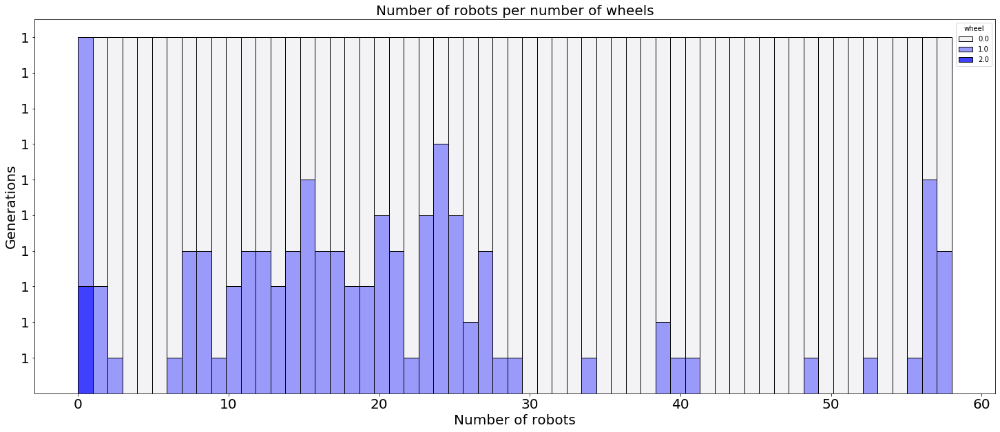

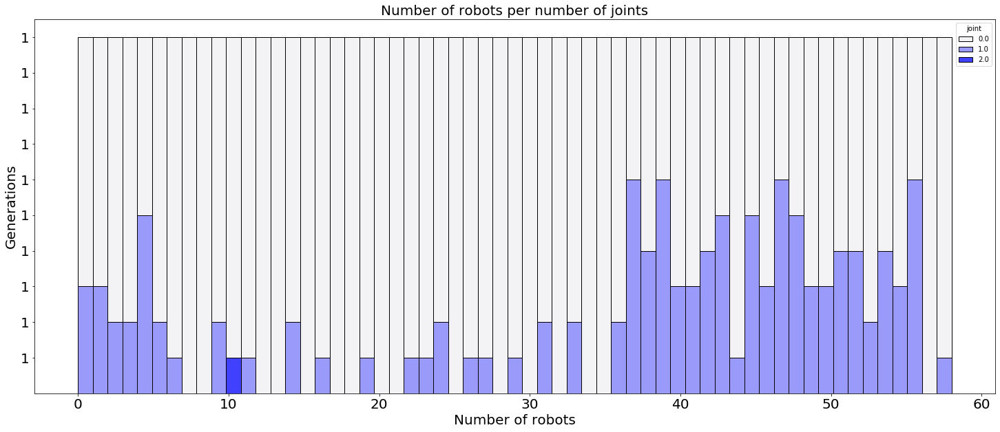

...

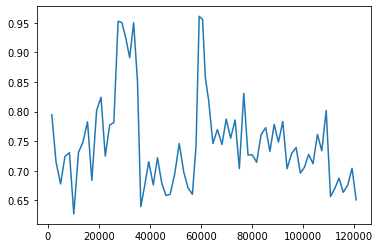

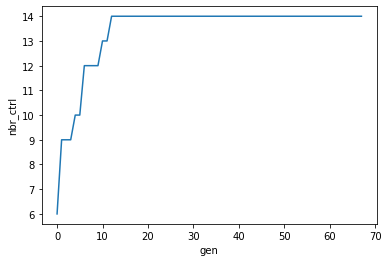

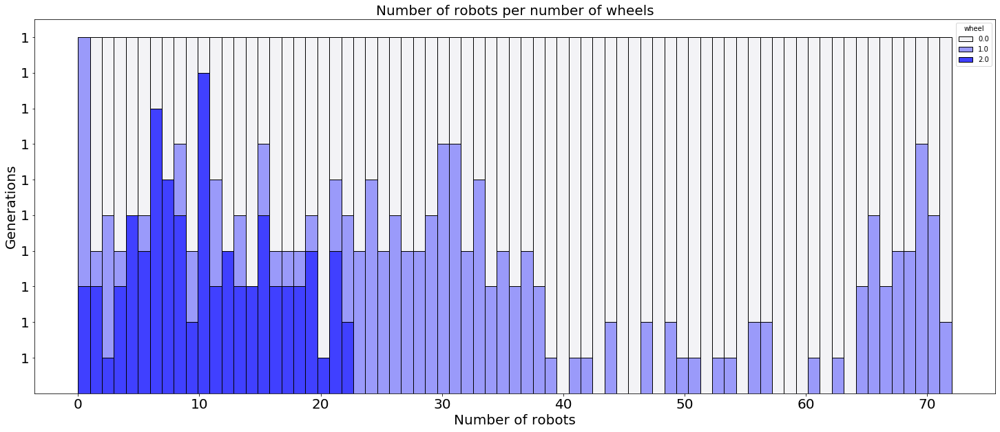

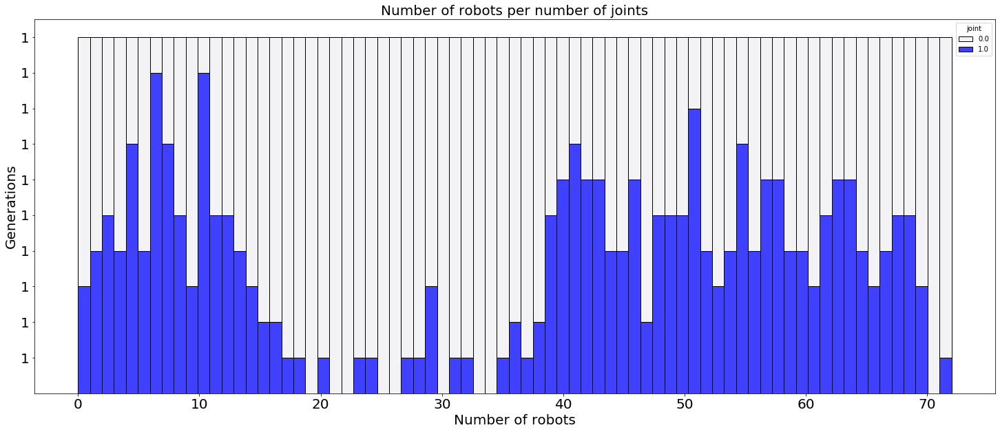

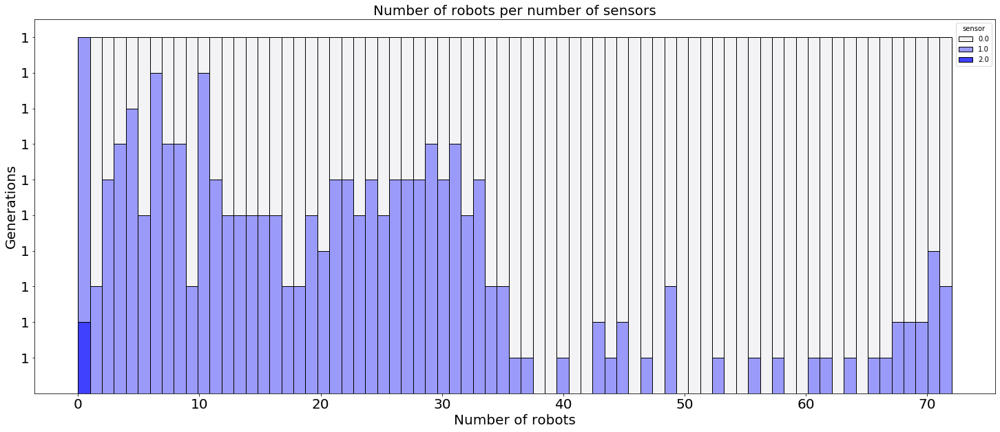

IndexError: list index out of range

In [179]:
for i in range(5):
    plt.plot(speedup[i])
    plt.show()
    plt.plot(neval[i],best_fits[i])
    plt.show()
    sns.lineplot(data=dataframes[i],x='gen',y='nbr_ctrl')
    plt.show()
    plot_hist_nbr_rob("Number of robots per number of wheels",morph_data,'wheel')
    plot_hist_nbr_rob("Number of robots per number of joints",morph_data,'joint')
    plot_hist_nbr_rob("Number of robots per number of sensors",morph_data,'sensor')

In [181]:
exp_folder = "/home/leni/are-logs/mnipes_third_exp_noca/easy/"
best_fits = []
avg_fits = []
neval_per_gen = []
for folder in os.listdir(exp_folder):
    neval, best_ids, best_fit, avg_fit, pop_size = load_all_fitnesses(exp_folder + folder + "/fitnesses.csv",0)
    nbr_eval = load_number_of_eval_per_gen(exp_folder + folder,len(best_fit))
    best_fits.append(best_fit)
    avg_fits.append(avg_fit)
    neval_per_gen.append(nbr_eval)
    nocap_v_wcap.append(["no archive","easy",max(best_fit),max(avg_fit),np.mean(best_fit),np.mean(avg_fit)])

In [182]:
morph_data=[]
for folder in os.listdir(exp_folder):
    lines = []
    descriptors = load_descriptor(exp_folder + folder + "/MD_Cart_WDH.csv",8)
    for desc in descriptors:
        lines.append([desc[0],str(desc[1]),desc[6],desc[7],desc[8]])
    morph_data.append(pd.DataFrame(data=lines,columns=["gen","robot","wheel","sensor","joint"]))

In [183]:
speedup = []
neval = []
for i in range(4):
    theo_max = [2000]*len(neval_per_gen[i])
    cumul_neval = neval_per_gen[i]    
    speedup.append(np.array(theo_max) - np.array(neval_per_gen[i]))
    for j in range(len(neval_per_gen[i])-1):
        cumul_neval[j+1]+=cumul_neval[j]
    neval.append(cumul_neval)
    speedup_nvw.append(["no archive","easy",max(speedup[-1]),np.mean(speedup[-1])])

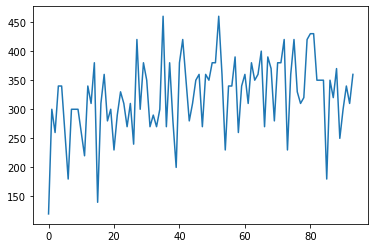

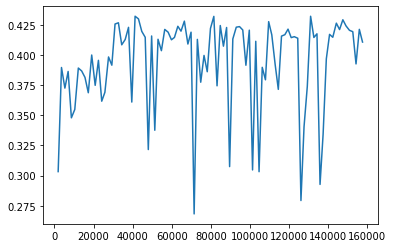

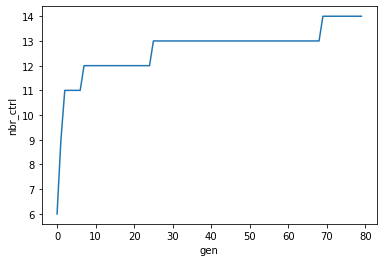

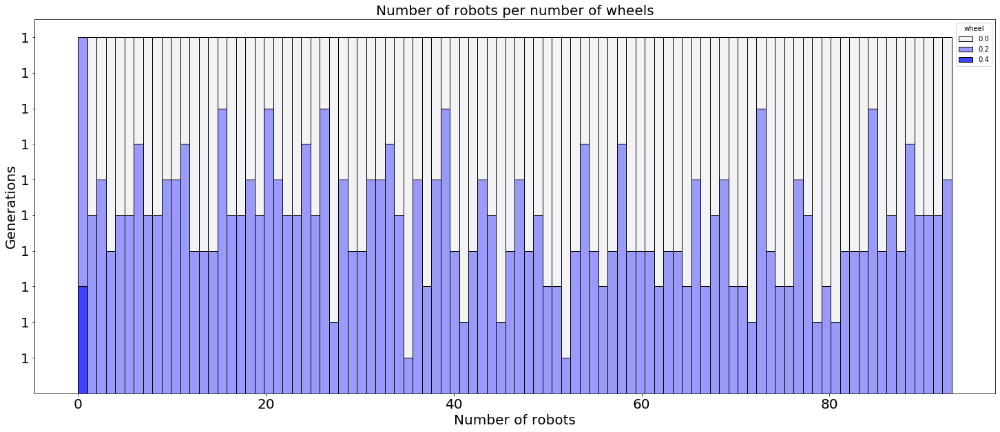

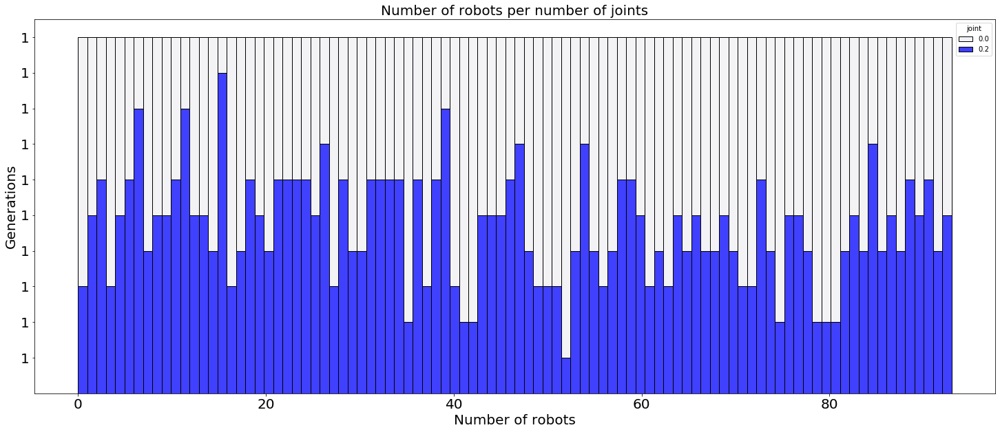

...

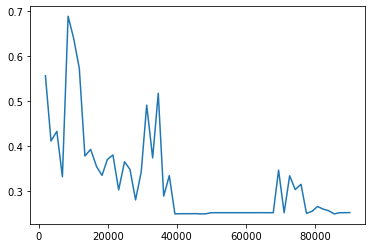

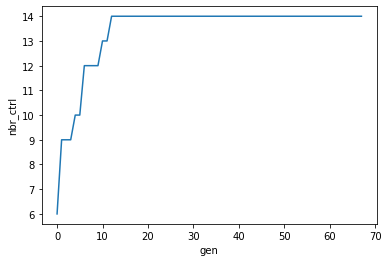

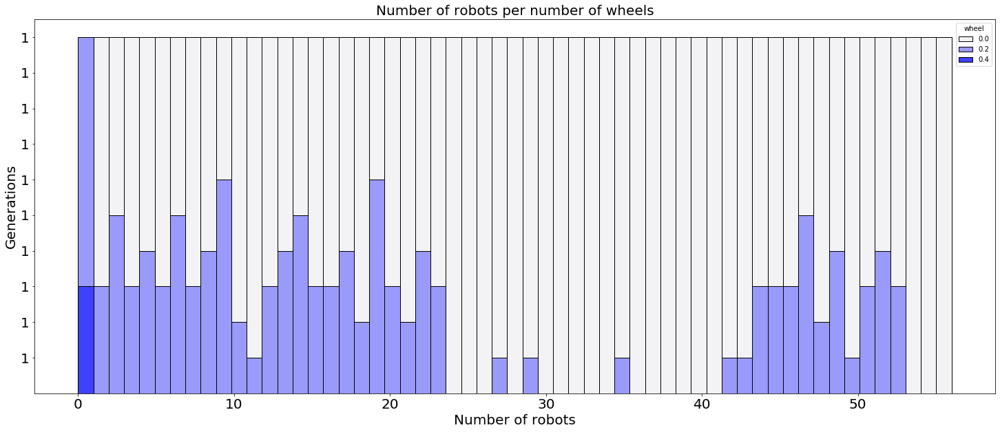

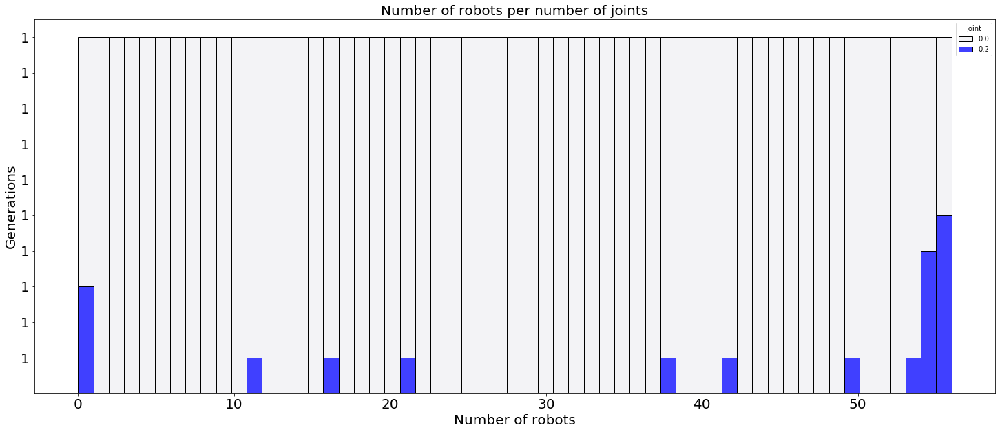

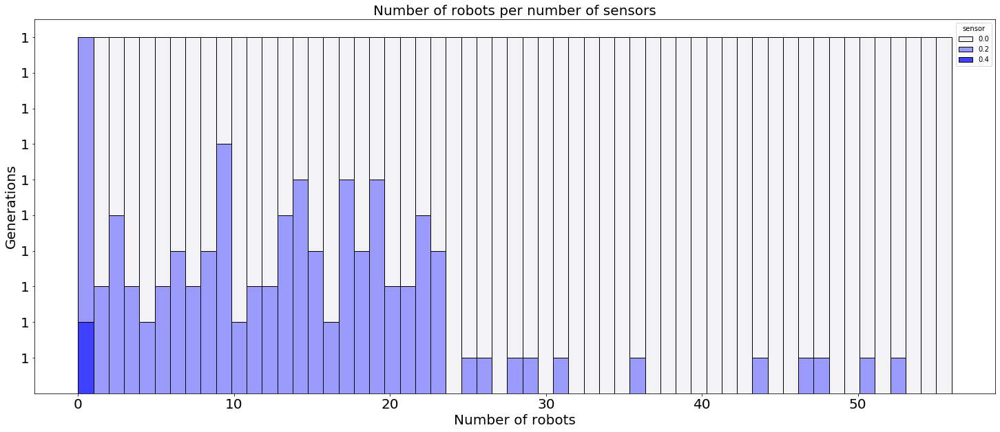

IndexError: list index out of range

In [184]:
for i in range(5):
    plt.plot(speedup[i])
    plt.show()
    plt.plot(neval[i],best_fits[i])
    plt.show()
    sns.lineplot(data=dataframes[i],x='gen',y='nbr_ctrl')
    plt.show()
    plot_hist_nbr_rob("Number of robots per number of wheels",morph_data,'wheel')
    plot_hist_nbr_rob("Number of robots per number of joints",morph_data,'joint')
    plot_hist_nbr_rob("Number of robots per number of sensors",morph_data,'sensor')

In [186]:
exp_folder = "/home/leni/are-logs/mnipes_third_exp_noca/hard/"
best_fits = []
avg_fits = []
neval_per_gen = []
for folder in os.listdir(exp_folder):
    neval, best_ids, best_fit, avg_fit, pop_size = load_all_fitnesses(exp_folder + folder + "/fitnesses.csv",0)
    nbr_eval = load_number_of_eval_per_gen(exp_folder + folder,len(best_fit))
    best_fits.append(best_fit)
    avg_fits.append(avg_fit)
    neval_per_gen.append(nbr_eval)
    nocap_v_wcap.append(["no archive","hard",max(best_fit),max(avg_fit),np.mean(best_fit),np.mean(avg_fit)])

In [187]:
morph_data=[]
for folder in os.listdir(exp_folder):
    lines = []
    descriptors = load_descriptor(exp_folder + folder + "/MD_Cart_WDH.csv",8)
    for desc in descriptors:
        lines.append([desc[0],str(desc[1]),desc[6],desc[7],desc[8]])
    morph_data.append(pd.DataFrame(data=lines,columns=["gen","robot","wheel","sensor","joint"]))

In [188]:
speedup = []
neval = []
for i in range(4):
    theo_max = [2000]*len(neval_per_gen[i])
    cumul_neval = neval_per_gen[i]    
    speedup.append(np.array(theo_max) - np.array(neval_per_gen[i]))
    for j in range(len(neval_per_gen[i])-1):
        cumul_neval[j+1]+=cumul_neval[j]
    neval.append(cumul_neval)
    speedup_nvw.append(["no archive","hard",max(speedup[-1]),np.mean(speedup[-1])])

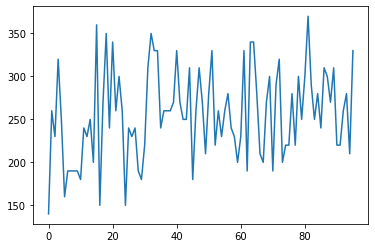

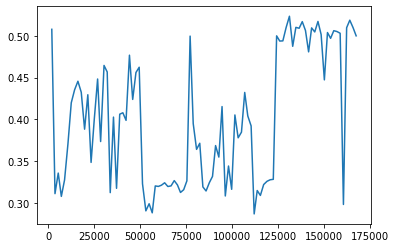

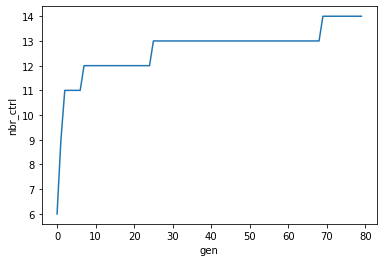

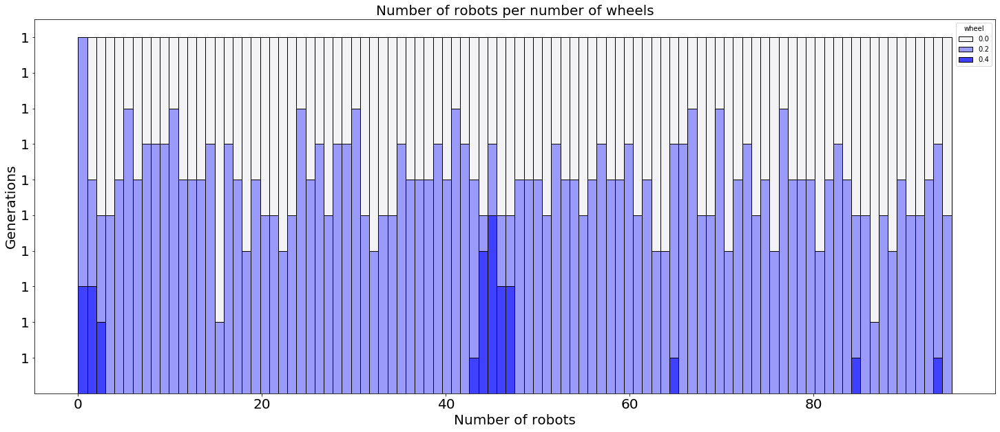

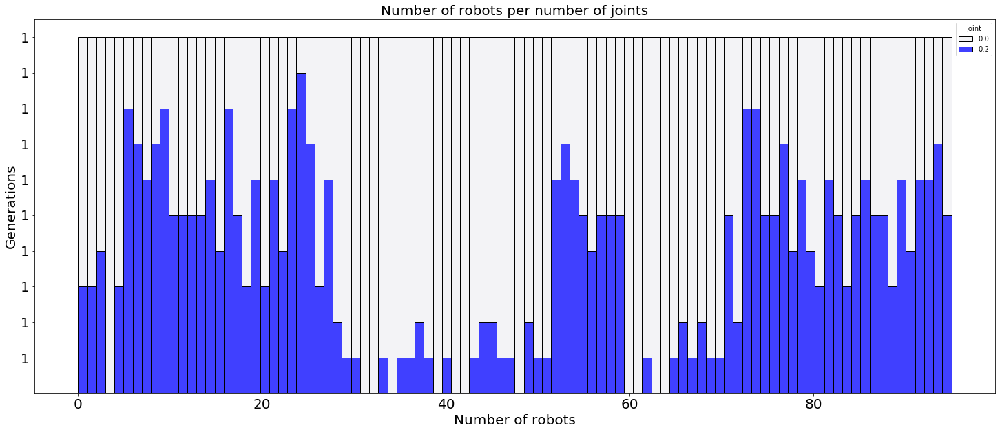

...

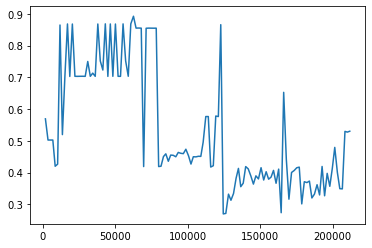

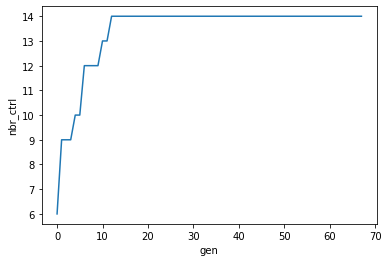

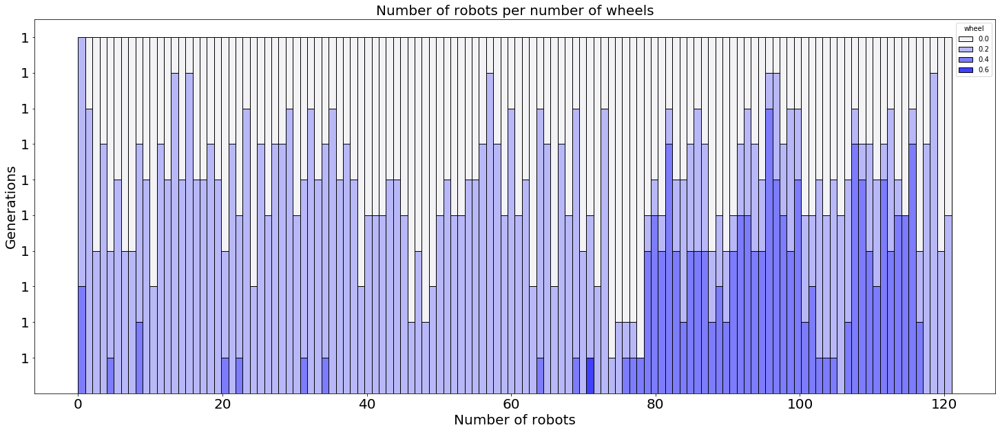

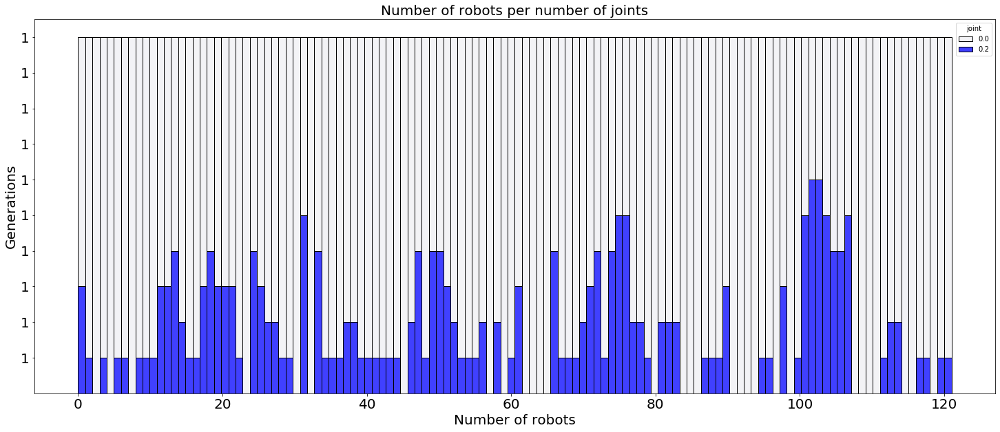

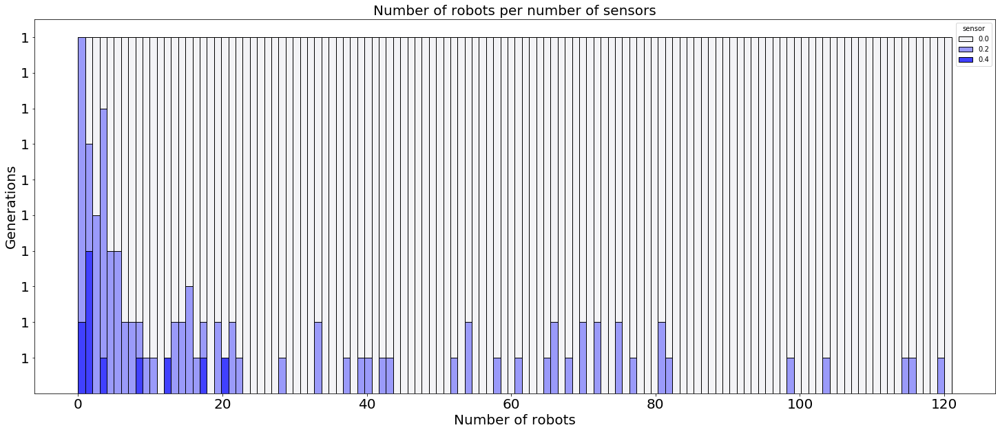

IndexError: list index out of range

In [189]:
for i in range(5):
    plt.plot(speedup[i])
    plt.show()
    plt.plot(neval[i],best_fits[i])
    plt.show()
    sns.lineplot(data=dataframes[i],x='gen',y='nbr_ctrl')
    plt.show()
    plot_hist_nbr_rob("Number of robots per number of wheels",morph_data,'wheel')
    plot_hist_nbr_rob("Number of robots per number of joints",morph_data,'joint')
    plot_hist_nbr_rob("Number of robots per number of sensors",morph_data,'sensor')

In [193]:
ca_data = pd.DataFrame(data=nocap_v_wcap,columns=["alg","env","max best fit","max avg fit","avg best fit","avg avg fit"])
speed_data = pd.DataFrame(data=speedup_nvw,columns=["alg","env","max speed up","avg speed up"])

<AxesSubplot:xlabel='env', ylabel='max best fit'>

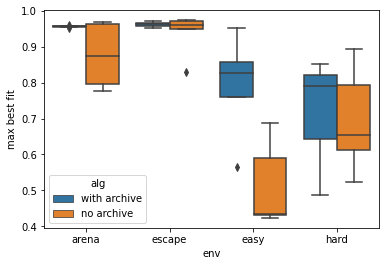

In [22]:
sns.boxplot(data=ca_data,x="env",y="max best fit",hue="alg")

<AxesSubplot:xlabel='env', ylabel='max avg fit'>

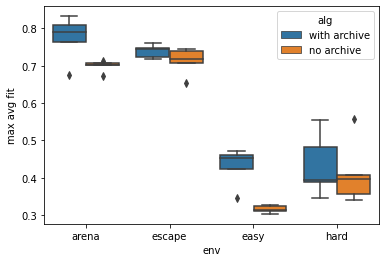

In [23]:
sns.boxplot(data=ca_data,x="env",y="max avg fit",hue="alg")

<AxesSubplot:xlabel='env', ylabel='avg best fit'>

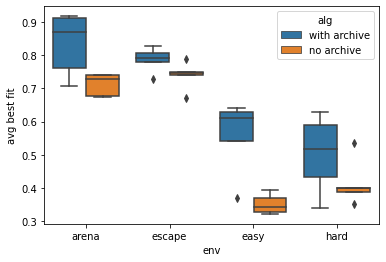

In [24]:
sns.boxplot(data=ca_data,x="env",y="avg best fit",hue="alg")

<AxesSubplot:xlabel='env', ylabel='avg avg fit'>

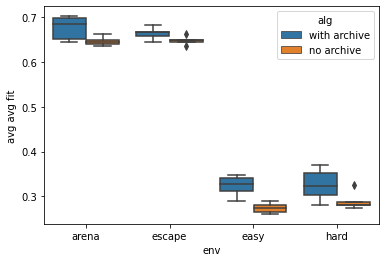

In [25]:
sns.boxplot(data=ca_data,x="env",y="avg avg fit",hue="alg")

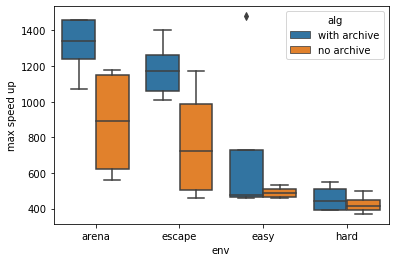

In [191]:
sns.boxplot(data=speed_data,x="env",y="max speed up",hue="alg")

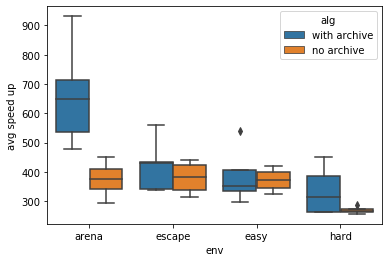

In [194]:
sns.boxplot(data=speed_data,x="env",y="avg speed up",hue="alg")

In [107]:
nocap_v_wcap = []
speedup_nvw = []

In [108]:
exp_folder = "/home/leni/are-logs/mnipes_forth/withca/arena/"
best_fits = []
avg_fits = []
neval_per_gen = []
for folder in os.listdir(exp_folder):
    neval, best_ids, best_fit, avg_fit, pop_size = load_all_fitnesses(exp_folder + folder + "/fitnesses.csv",0)
    print(len(best_fit))
    nbr_eval = load_number_of_eval_per_gen(exp_folder + folder,len(best_fit))
    best_fits.append(best_fit)
    avg_fits.append(avg_fit)
    neval_per_gen.append(nbr_eval)
    nocap_v_wcap.append(["with archive","arena",max(best_fit),max(avg_fit),np.mean(best_fit),np.mean(avg_fit)])

68
60
49
74
32


In [74]:
morph_data=[]
for folder in os.listdir(exp_folder):
    lines = []
    descriptors = load_descriptor(exp_folder + folder + "/MD_Cart_WDH.csv",8)
    for desc in descriptors:
        lines.append([desc[0],str(desc[1]),desc[6]*16,desc[7]*16,desc[8]*16])
    morph_data.append(pd.DataFrame(data=lines,columns=["gen","robot","wheel","sensor","joint"]))

In [75]:
dataframes=[]
for folder in os.listdir(exp_folder):
    lines = []
    for file in os.listdir(exp_folder + folder):
        if(file.split("_")[0] != "controller"):
            continue
        gen = float(file.split("archive")[-1])
        ctrl_arch = load_controller_archive(exp_folder + folder + "/" + file)
        nbr_ctrl=0
        for i,line in ctrl_arch.iterrows():
            if(line["fitness"] > 0):
                nbr_ctrl+=1
        lines.append([gen,nbr_ctrl])
    dataframes.append(pd.DataFrame(data=lines,columns=["gen","nbr_ctrl"]))

In [109]:
speedup = []
neval = []
for i in range(5):
    theo_max = [2000]*len(neval_per_gen[i])
    cumul_neval = neval_per_gen[i]    
    speedup.append(np.array(theo_max) - np.array(neval_per_gen[i]))
    for j in range(len(neval_per_gen[i])-1):
        cumul_neval[j+1]+=cumul_neval[j]
    neval.append(cumul_neval)
    speedup_nvw.append(["with archive","arena",max(speedup[-1]),np.mean(speedup[-1])])

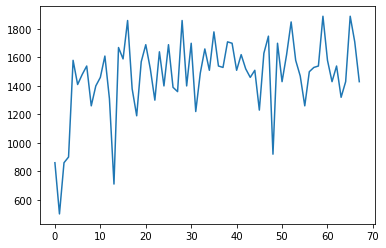

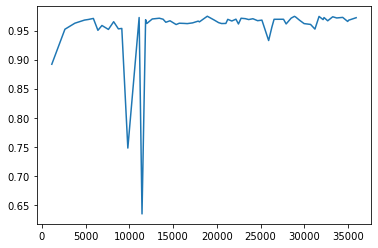

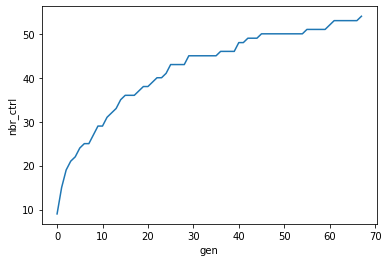

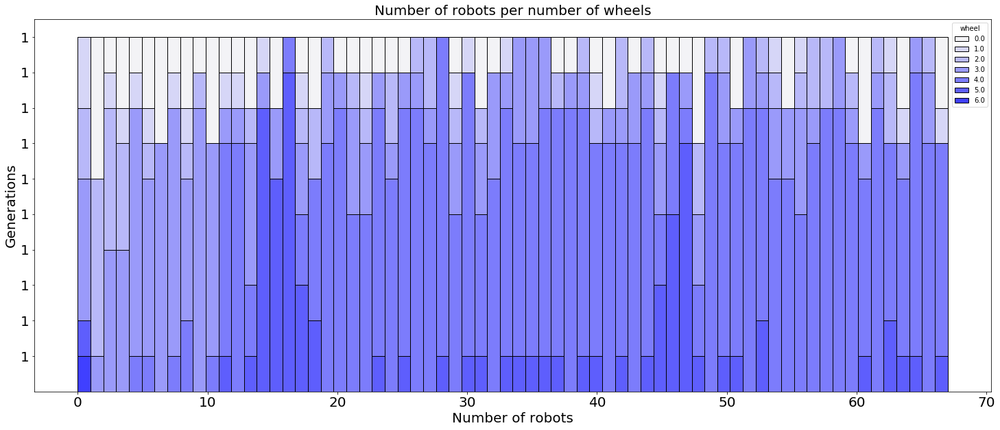

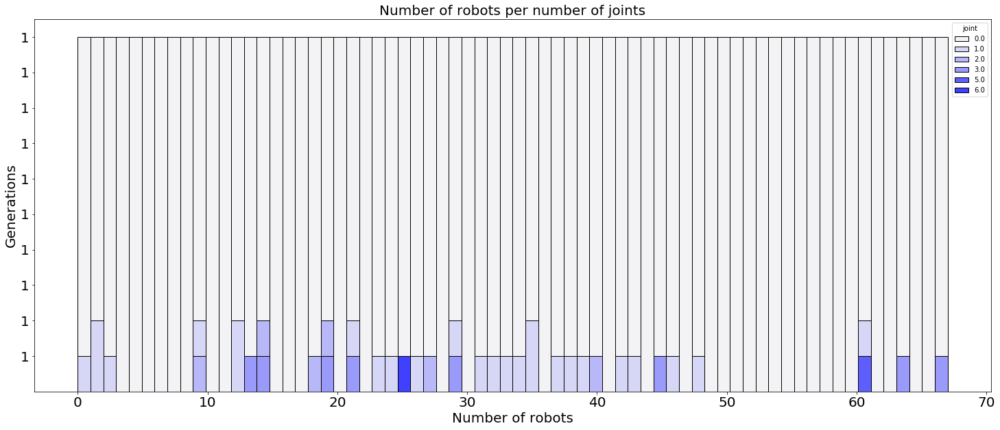

...

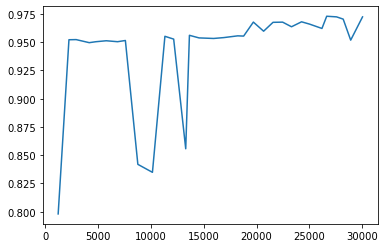

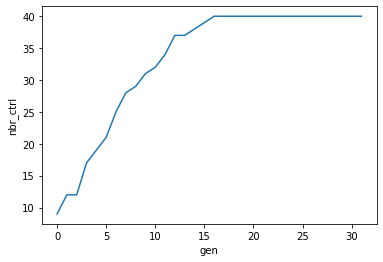

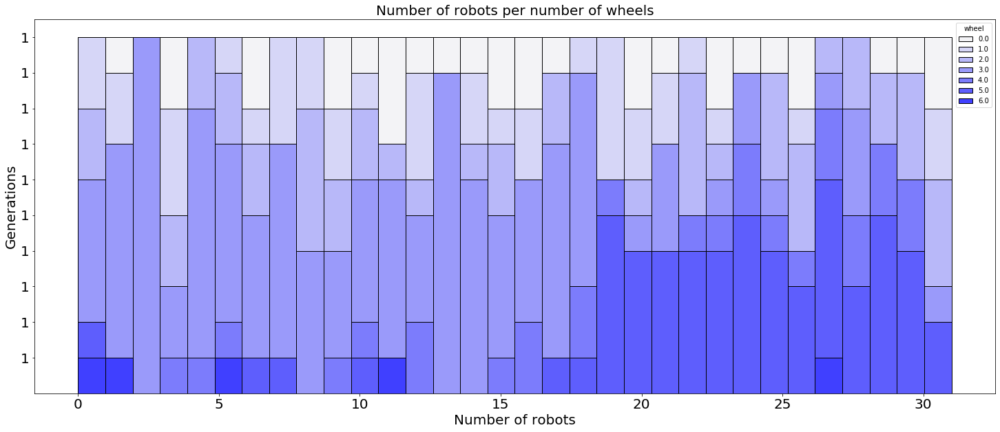

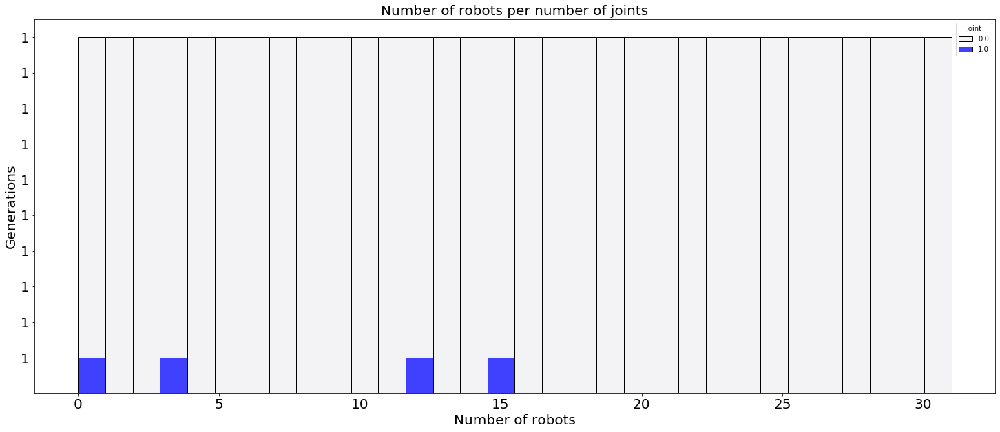

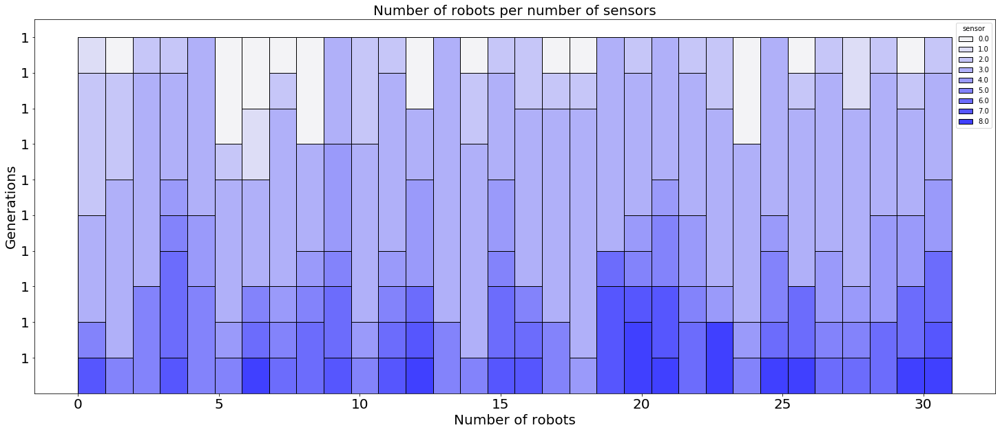

In [77]:
for i in range(5):
    plt.plot(speedup[i])
    plt.show()
    plt.plot(neval[i],best_fits[i])
    plt.show()
    sns.lineplot(data=dataframes[i],x='gen',y='nbr_ctrl')
    plt.show()
    plot_hist_nbr_rob("Number of robots per number of wheels",morph_data,'wheel')
    plot_hist_nbr_rob("Number of robots per number of joints",morph_data,'joint')
    plot_hist_nbr_rob("Number of robots per number of sensors",morph_data,'sensor')

In [110]:
exp_folder = "/home/leni/are-logs/mnipes_forth/withca/escape/"
best_fits = []
avg_fits = []
neval_per_gen = []
for folder in os.listdir(exp_folder):
    neval, best_ids, best_fit, avg_fit, pop_size = load_all_fitnesses(exp_folder + folder + "/fitnesses.csv",0)
    print(len(best_fit))
    nbr_eval = load_number_of_eval_per_gen(exp_folder + folder,len(best_fit))
    best_fits.append(best_fit)
    avg_fits.append(avg_fit)
    neval_per_gen.append(nbr_eval)
    nocap_v_wcap.append(["with archive","escape",max(best_fit),max(avg_fit),np.mean(best_fit),np.mean(avg_fit)])

19
63
51
52
14


In [79]:
morph_data=[]
for folder in os.listdir(exp_folder):
    lines = []
    descriptors = load_descriptor(exp_folder + folder + "/MD_Cart_WDH.csv",8)
    for desc in descriptors:
        lines.append([desc[0],str(desc[1]),desc[6]*16,desc[7]*16,desc[8]*16])
    morph_data.append(pd.DataFrame(data=lines,columns=["gen","robot","wheel","sensor","joint"]))

In [80]:
dataframes=[]
for folder in os.listdir(exp_folder):
    lines = []
    for file in os.listdir(exp_folder + folder):
        if(file.split("_")[0] != "controller"):
            continue
        gen = float(file.split("archive")[-1])
        ctrl_arch = load_controller_archive(exp_folder + folder + "/" + file)
        nbr_ctrl=0
        for i,line in ctrl_arch.iterrows():
            if(line["fitness"] > 0):
                nbr_ctrl+=1
        lines.append([gen,nbr_ctrl])
    dataframes.append(pd.DataFrame(data=lines,columns=["gen","nbr_ctrl"]))

In [111]:
speedup = []
neval = []
for i in range(5):
    theo_max = [2000]*len(neval_per_gen[i])
    cumul_neval = neval_per_gen[i]    
    speedup.append(np.array(theo_max) - np.array(neval_per_gen[i]))
    for j in range(len(neval_per_gen[i])-1):
        cumul_neval[j+1]+=cumul_neval[j]
    neval.append(cumul_neval)
    speedup_nvw.append(["with archive","escape",max(speedup[-1]),np.mean(speedup[-1])])

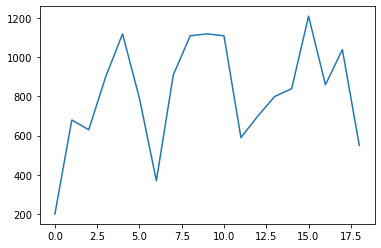

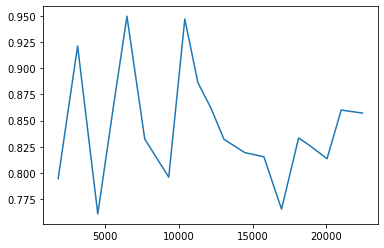

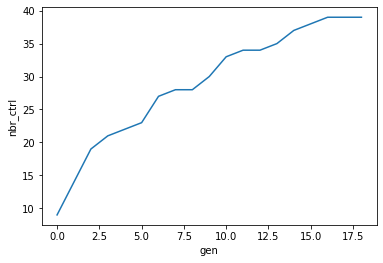

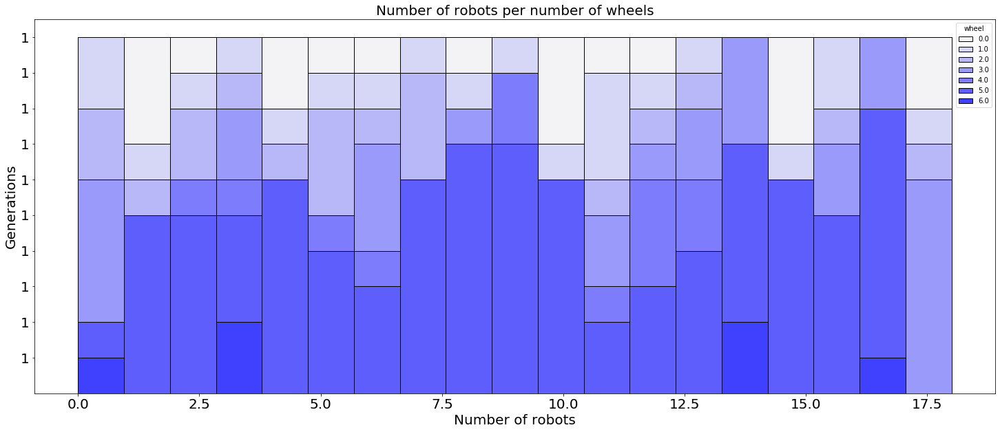

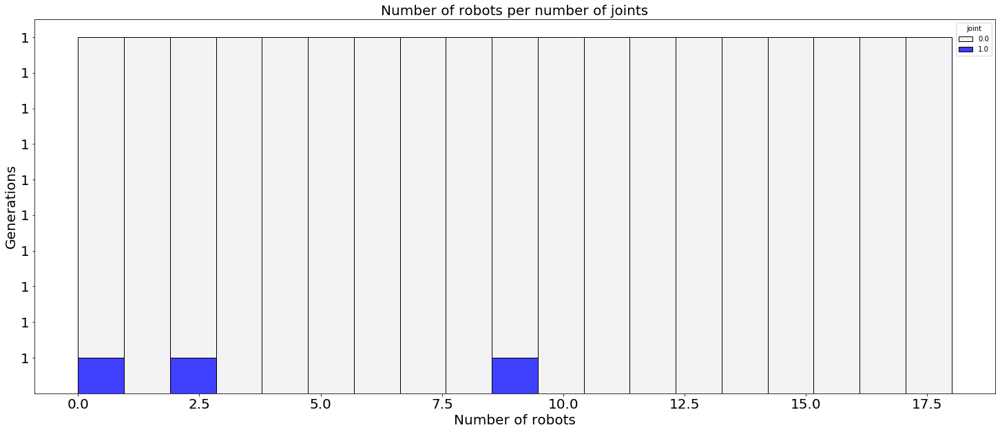

...

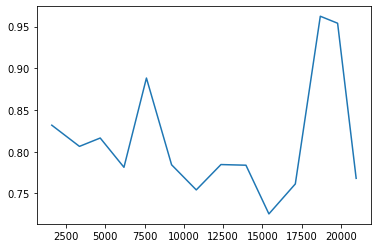

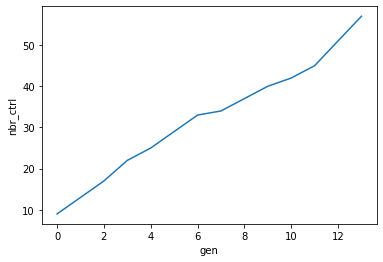

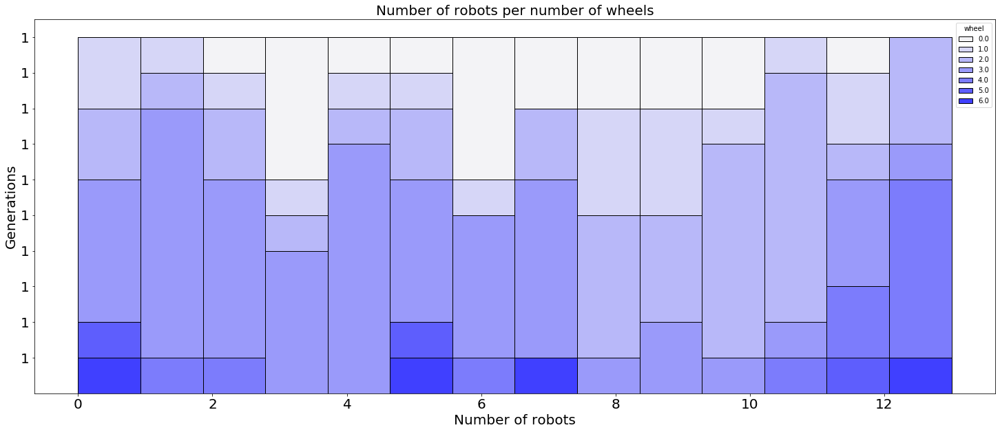

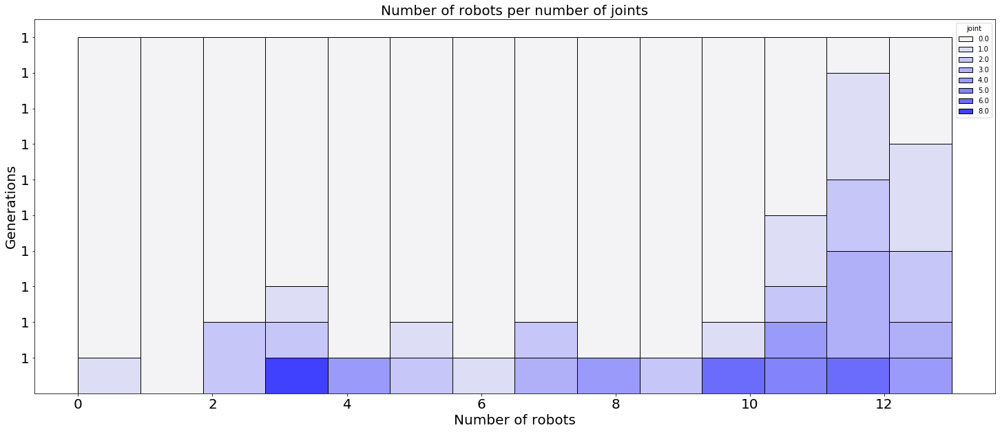

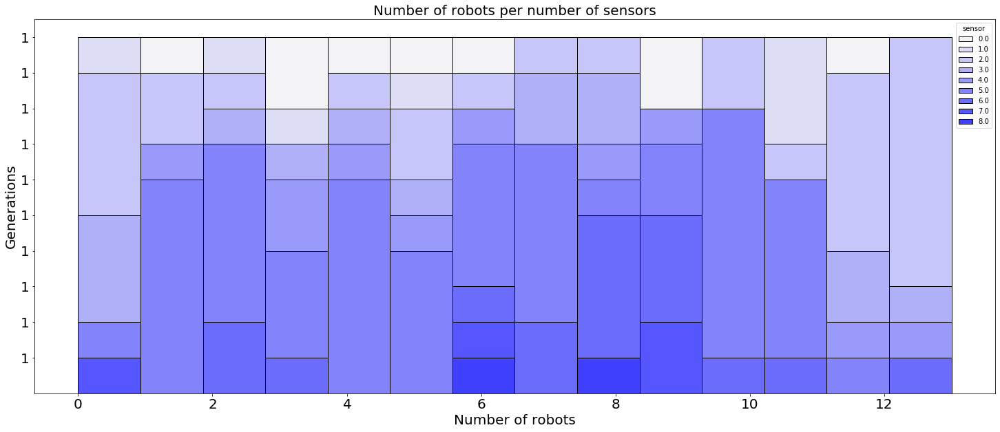

In [82]:
for i in range(5):
    plt.plot(speedup[i])
    plt.show()
    plt.plot(neval[i],best_fits[i])
    plt.show()
    sns.lineplot(data=dataframes[i],x='gen',y='nbr_ctrl')
    plt.show()
    plot_hist_nbr_rob("Number of robots per number of wheels",morph_data,'wheel')
    plot_hist_nbr_rob("Number of robots per number of joints",morph_data,'joint')
    plot_hist_nbr_rob("Number of robots per number of sensors",morph_data,'sensor')

In [112]:
exp_folder = "/home/leni/are-logs/mnipes_forth/withca/easy/"
best_fits = []
avg_fits = []
neval_per_gen = []
for folder in os.listdir(exp_folder):
    neval, best_ids, best_fit, avg_fit, pop_size = load_all_fitnesses(exp_folder + folder + "/fitnesses.csv",0)
    print(len(best_fit))
    nbr_eval = load_number_of_eval_per_gen(exp_folder + folder,len(best_fit))
    best_fits.append(best_fit)
    avg_fits.append(avg_fit)
    neval_per_gen.append(nbr_eval)
    nocap_v_wcap.append(["with archive","easy",max(best_fit),max(avg_fit),np.mean(best_fit),np.mean(avg_fit)])

21
44
25
45
19


In [84]:
morph_data=[]
for folder in os.listdir(exp_folder):
    lines = []
    descriptors = load_descriptor(exp_folder + folder + "/MD_Cart_WDH.csv",8)
    for desc in descriptors:
        lines.append([desc[0],str(desc[1]),desc[6]*16,desc[7]*16,desc[8]*16])
    morph_data.append(pd.DataFrame(data=lines,columns=["gen","robot","wheel","sensor","joint"]))

In [85]:
dataframes=[]
for folder in os.listdir(exp_folder):
    lines = []
    for file in os.listdir(exp_folder + folder):
        if(file.split("_")[0] != "controller"):
            continue
        gen = float(file.split("archive")[-1])
        ctrl_arch = load_controller_archive(exp_folder + folder + "/" + file)
        nbr_ctrl=0
        for i,line in ctrl_arch.iterrows():
            if(line["fitness"] > 0):
                nbr_ctrl+=1
        lines.append([gen,nbr_ctrl])
    dataframes.append(pd.DataFrame(data=lines,columns=["gen","nbr_ctrl"]))

In [113]:
speedup = []
neval = []
for i in range(5):
    theo_max = [2000]*len(neval_per_gen[i])
    cumul_neval = neval_per_gen[i]    
    speedup.append(np.array(theo_max) - np.array(neval_per_gen[i]))
    for j in range(len(neval_per_gen[i])-1):
        cumul_neval[j+1]+=cumul_neval[j]
    neval.append(cumul_neval)
    speedup_nvw.append(["with archive","easy",max(speedup[-1]),np.mean(speedup[-1])])

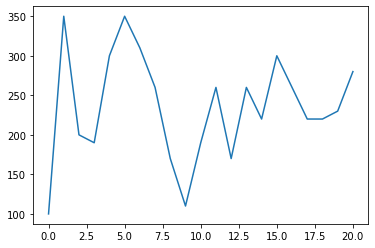

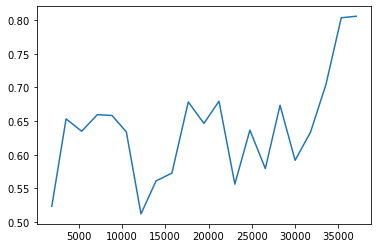

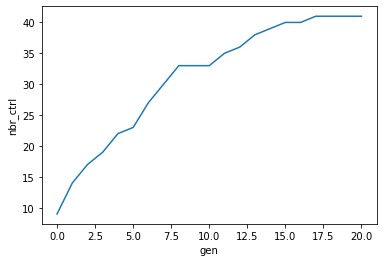

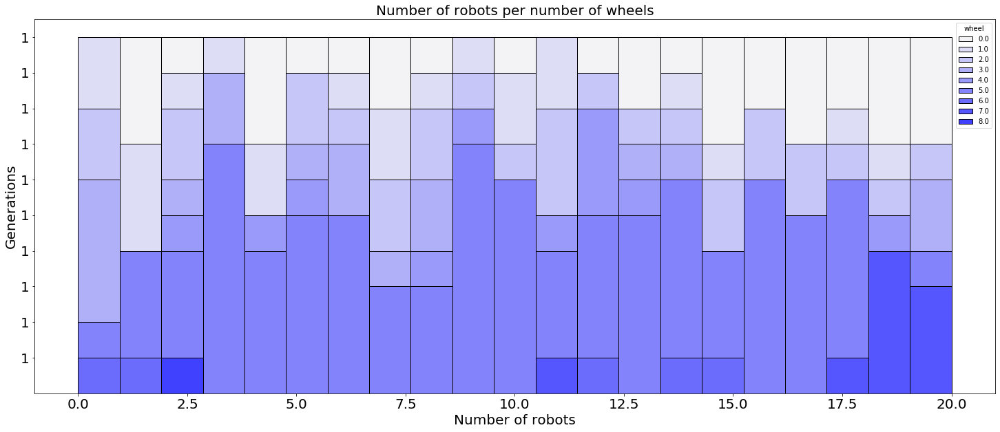

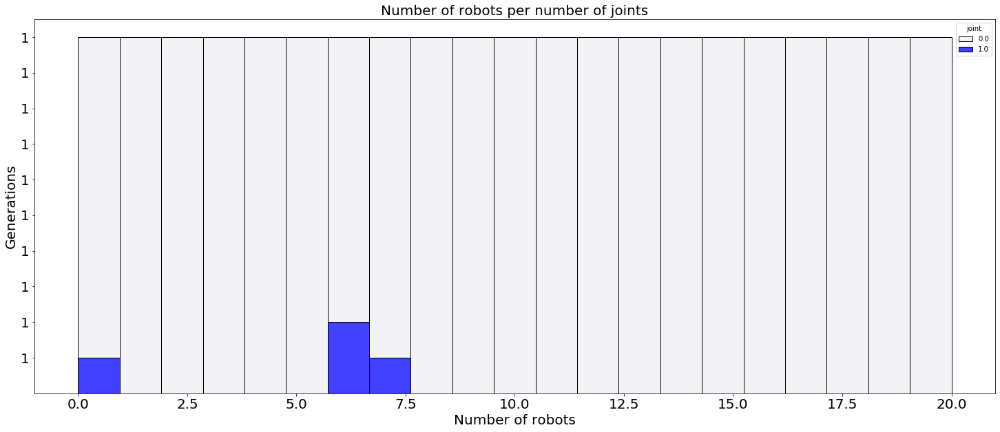

...

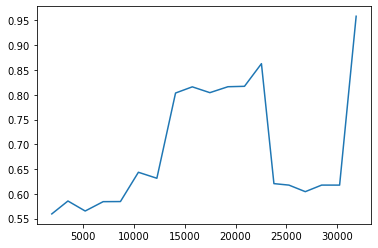

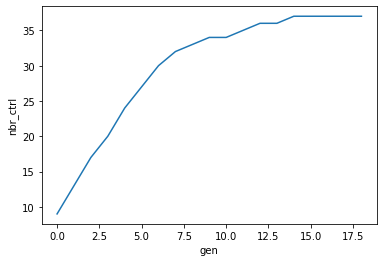

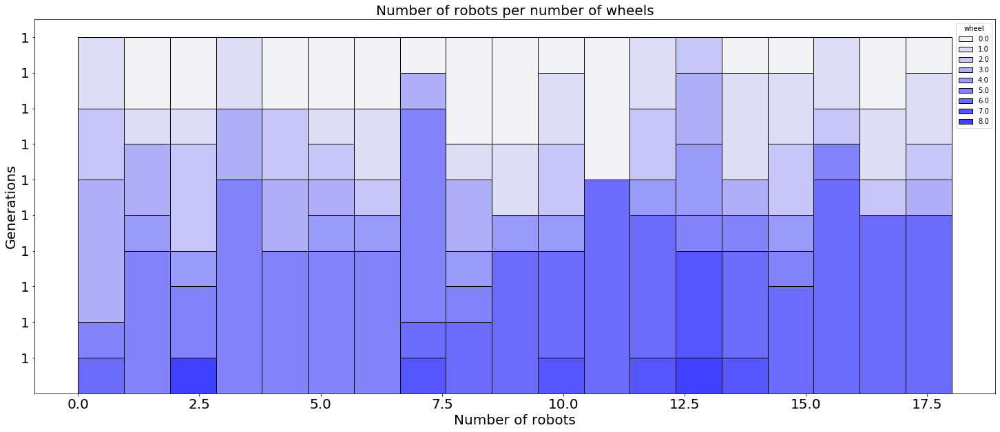

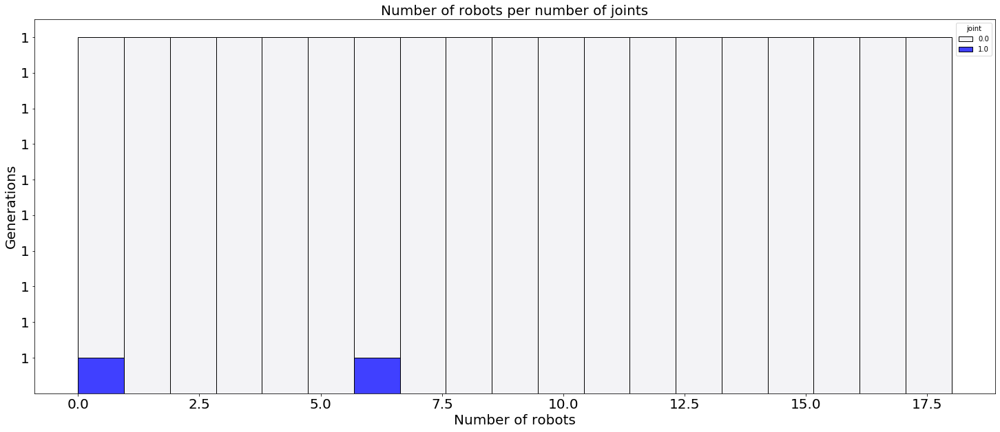

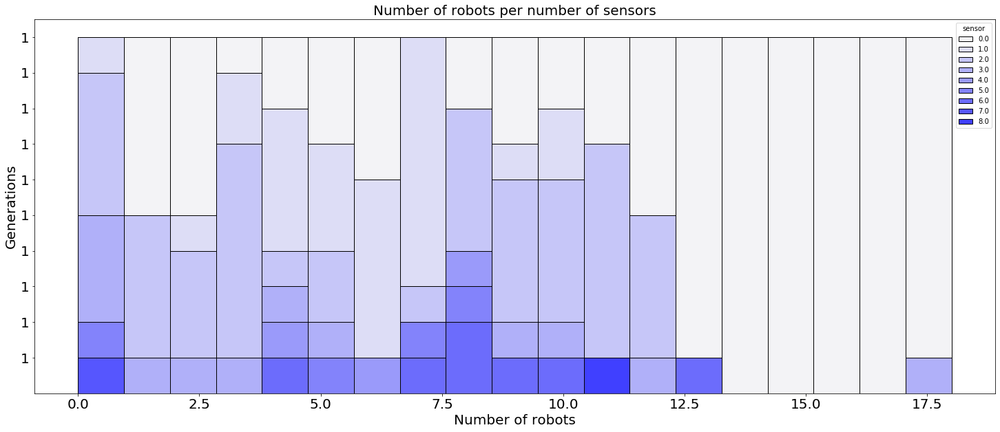

In [87]:
for i in range(5):
    plt.plot(speedup[i])
    plt.show()
    plt.plot(neval[i],best_fits[i])
    plt.show()
    sns.lineplot(data=dataframes[i],x='gen',y='nbr_ctrl')
    plt.show()
    plot_hist_nbr_rob("Number of robots per number of wheels",morph_data,'wheel')
    plot_hist_nbr_rob("Number of robots per number of joints",morph_data,'joint')
    plot_hist_nbr_rob("Number of robots per number of sensors",morph_data,'sensor')

In [47]:
exp_folder = "/home/leni/are-logs/mnipes_forth/withca/hard/"
best_fits = []
avg_fits = []
neval_per_gen = []
for folder in os.listdir(exp_folder):
    neval, best_ids, best_fit, avg_fit, pop_size = load_all_fitnesses(exp_folder + folder + "/fitnesses.csv",0)
    print(len(best_fit))
    nbr_eval = load_number_of_eval_per_gen(exp_folder + folder,len(best_fit))
    best_fits.append(best_fit)
    avg_fits.append(avg_fit)
    neval_per_gen.append(nbr_eval)
    #nocap_v_wcap.append(["with archive","hard",max(best_fit),max(avg_fit),np.mean(best_fit),np.mean(avg_fit)])

19
34
32
31
49
40
29
39
17
40
28


In [48]:
morph_data=[]
for folder in os.listdir(exp_folder):
    lines = []
    descriptors = load_descriptor(exp_folder + folder + "/MD_Cart_WDH.csv",8)
    for desc in descriptors:
        lines.append([desc[0],str(desc[1]),desc[6]*16,desc[7]*16,desc[8]*16])
    morph_data.append(pd.DataFrame(data=lines,columns=["gen","robot","wheel","sensor","joint"]))

In [49]:
dataframes=[]
for folder in os.listdir(exp_folder):
    lines = []
    for file in os.listdir(exp_folder + folder):
        if(file.split("_")[0] != "controller"):
            continue
        gen = float(file.split("archive")[-1])
        ctrl_arch = load_controller_archive(exp_folder + folder + "/" + file)
        nbr_ctrl=0
        for i,line in ctrl_arch.iterrows():
            if(line["fitness"] > 0):
                nbr_ctrl+=1
        lines.append([gen,nbr_ctrl])
    dataframes.append(pd.DataFrame(data=lines,columns=["gen","nbr_ctrl"]))

In [50]:
speedup = []
neval = []
for i in range(5):
    theo_max = [2000]*len(neval_per_gen[i])
    cumul_neval = neval_per_gen[i]    
    speedup.append(np.array(theo_max) - np.array(neval_per_gen[i]))
    for j in range(len(neval_per_gen[i])-1):
        cumul_neval[j+1]+=cumul_neval[j]
    neval.append(cumul_neval)
    #speedup_nvw.append(["no archive","hard",max(speedup[-1]),np.mean(speedup[-1])])

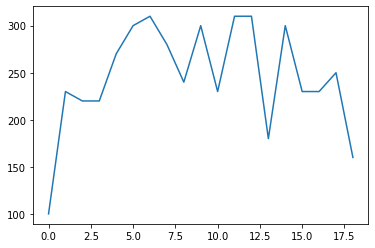

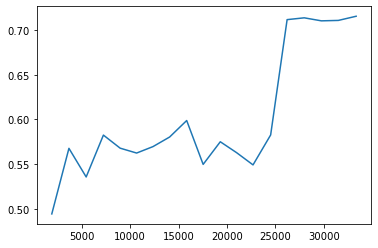

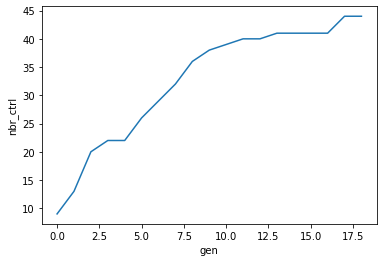

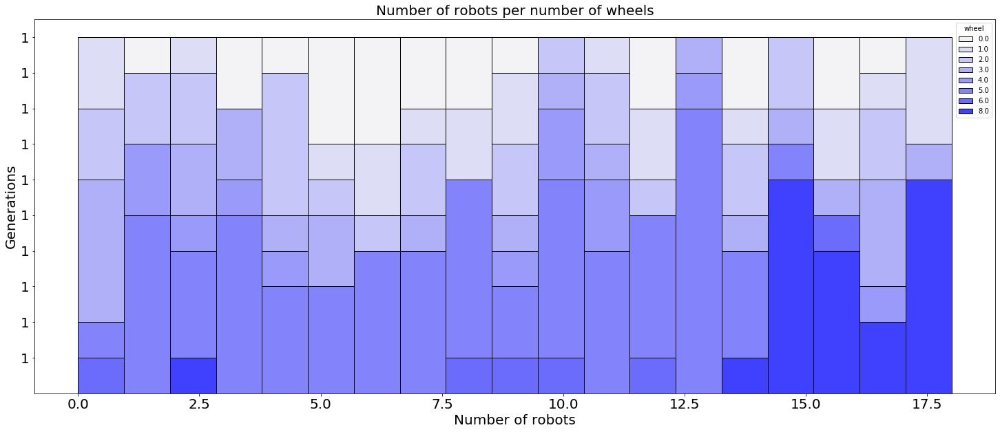

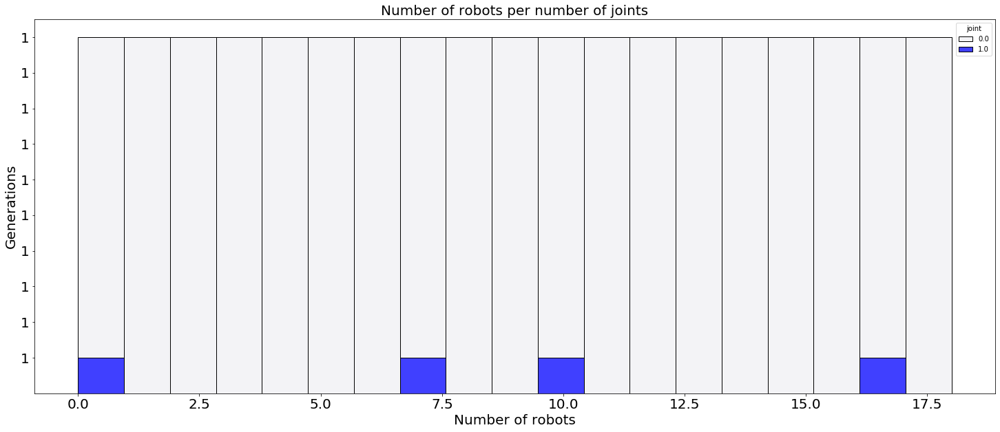

...

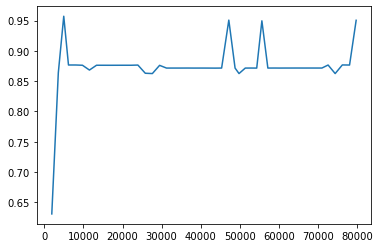

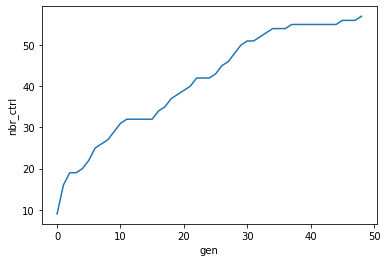

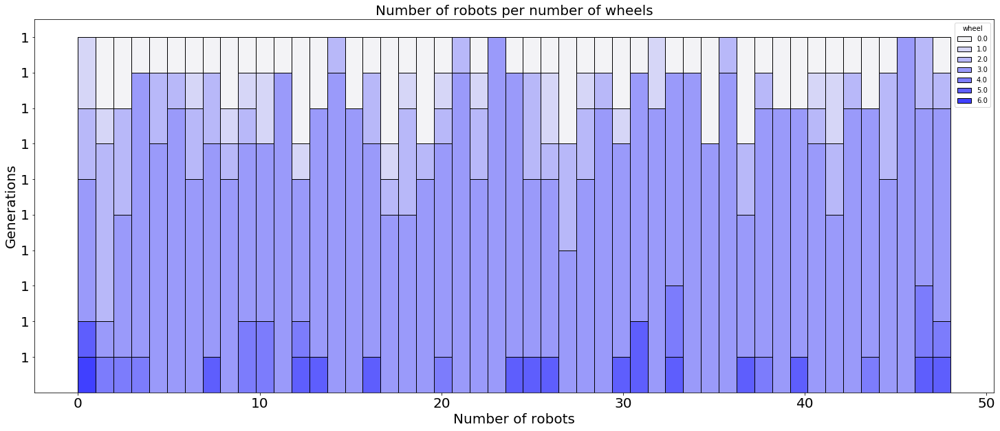

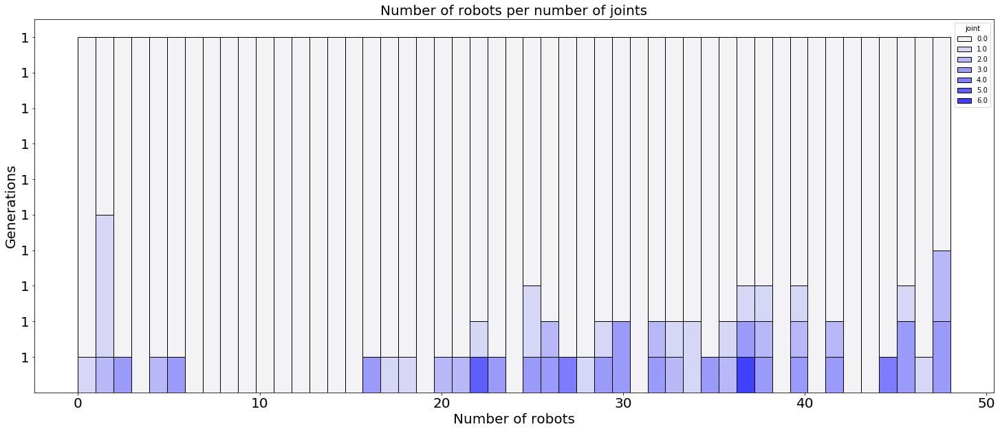

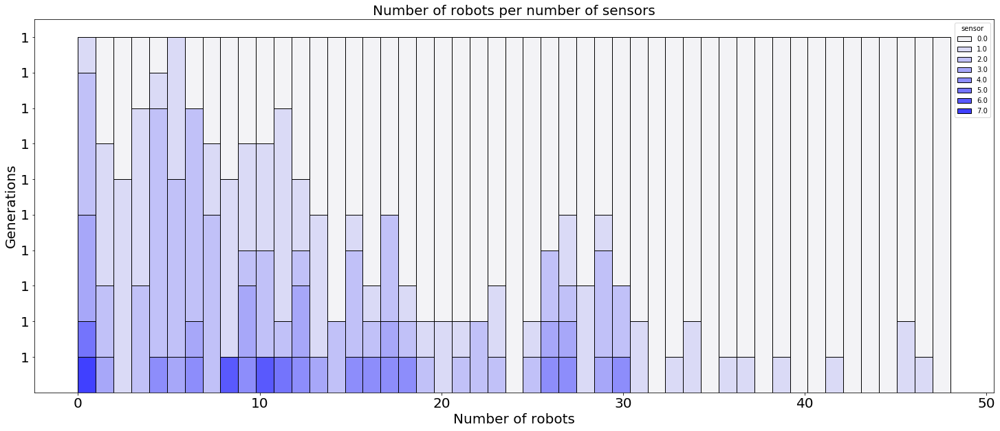

In [51]:
for i in range(5):
    plt.plot(speedup[i])
    plt.show()
    plt.plot(neval[i],best_fits[i])
    plt.show()
    sns.lineplot(data=dataframes[i],x='gen',y='nbr_ctrl')
    plt.show()
    plot_hist_nbr_rob("Number of robots per number of wheels",morph_data,'wheel')
    plot_hist_nbr_rob("Number of robots per number of joints",morph_data,'joint')
    plot_hist_nbr_rob("Number of robots per number of sensors",morph_data,'sensor')

In [114]:
exp_folder = "/home/leni/are-logs/mnipes_forth/noca/arena/"
best_fits = []
avg_fits = []
neval_per_gen = []
for folder in os.listdir(exp_folder):
    neval, best_ids, best_fit, avg_fit, pop_size = load_all_fitnesses(exp_folder + folder + "/fitnesses.csv",0)
    print(len(best_fit))
    nbr_eval = load_number_of_eval_per_gen(exp_folder + folder,len(best_fit))
    best_fits.append(best_fit)
    avg_fits.append(avg_fit)
    neval_per_gen.append(nbr_eval)
    nocap_v_wcap.append(["no archive","arena",max(best_fit),max(avg_fit),np.mean(best_fit),np.mean(avg_fit)])

61
44
74
52
56


In [89]:
morph_data=[]
for folder in os.listdir(exp_folder):
    lines = []
    descriptors = load_descriptor(exp_folder + folder + "/MD_Cart_WDH.csv",8)
    for desc in descriptors:
        lines.append([desc[0],str(desc[1]),desc[6]*16,desc[7]*16,desc[8]*16])
    morph_data.append(pd.DataFrame(data=lines,columns=["gen","robot","wheel","sensor","joint"]))

In [115]:
speedup = []
neval = []
for i in range(5):
    theo_max = [2000]*len(neval_per_gen[i])
    cumul_neval = neval_per_gen[i]    
    speedup.append(np.array(theo_max) - np.array(neval_per_gen[i]))
    for j in range(len(neval_per_gen[i])-1):
        cumul_neval[j+1]+=cumul_neval[j]
    neval.append(cumul_neval)
    speedup_nvw.append(["no archive","arena",max(speedup[-1]),np.mean(speedup[-1])])

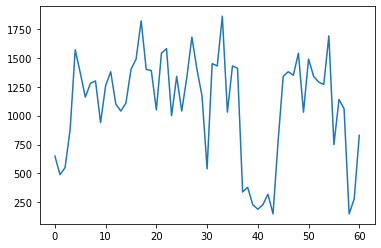

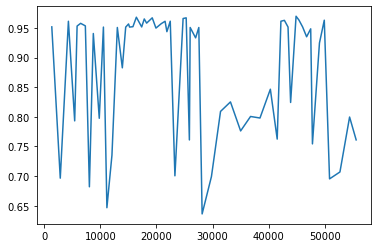

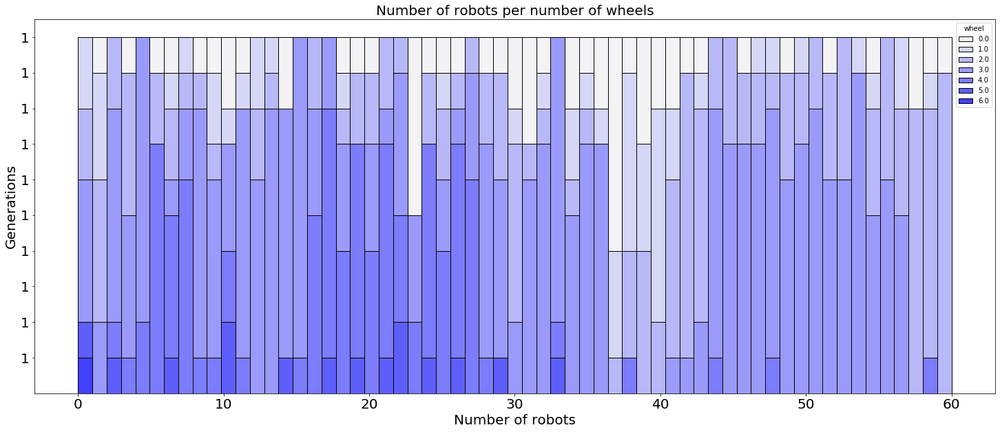

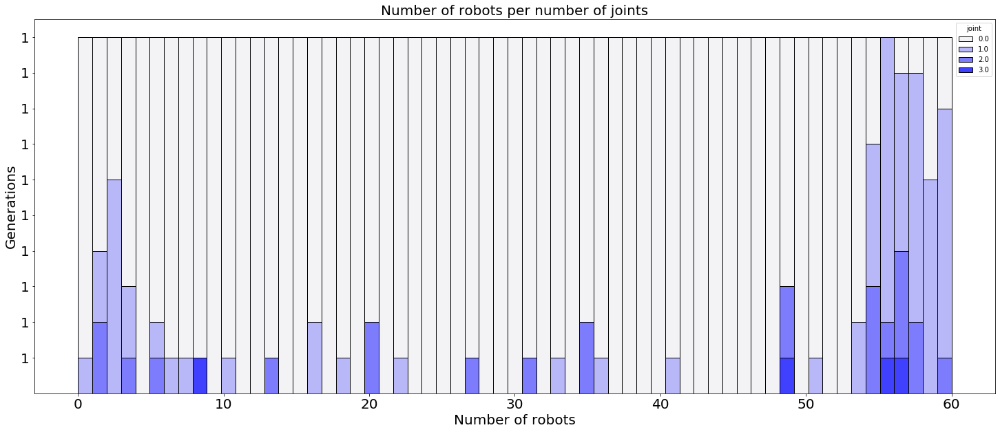

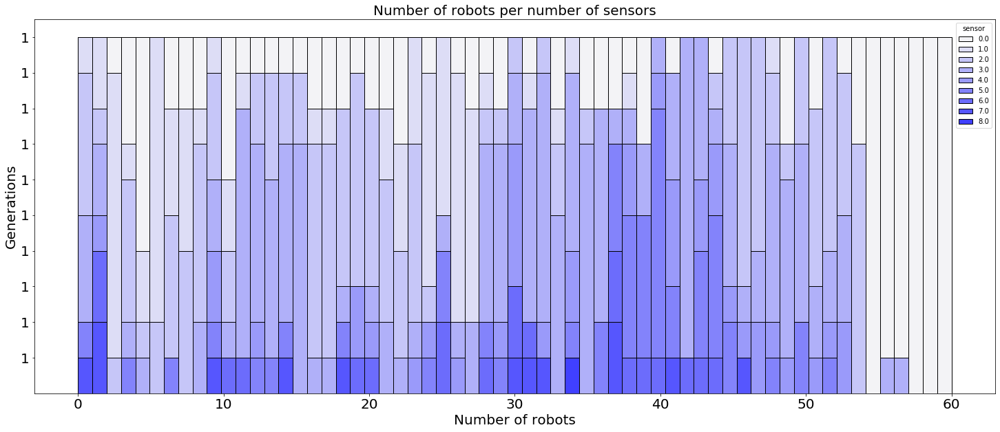

...

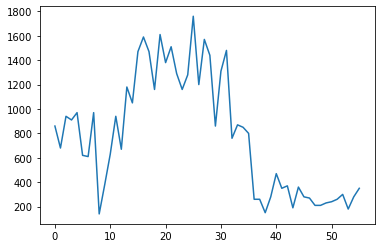

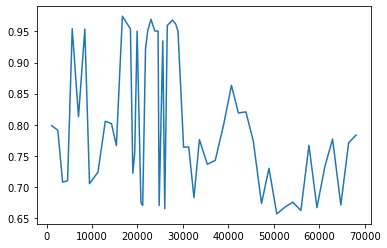

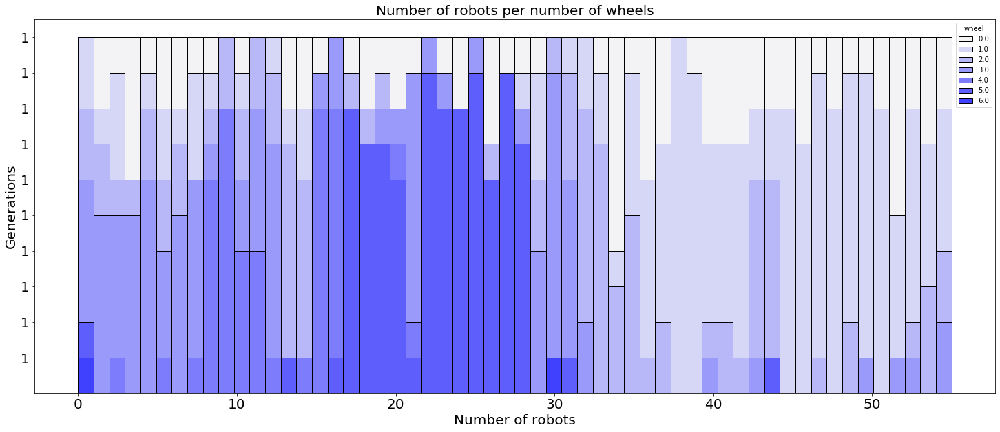

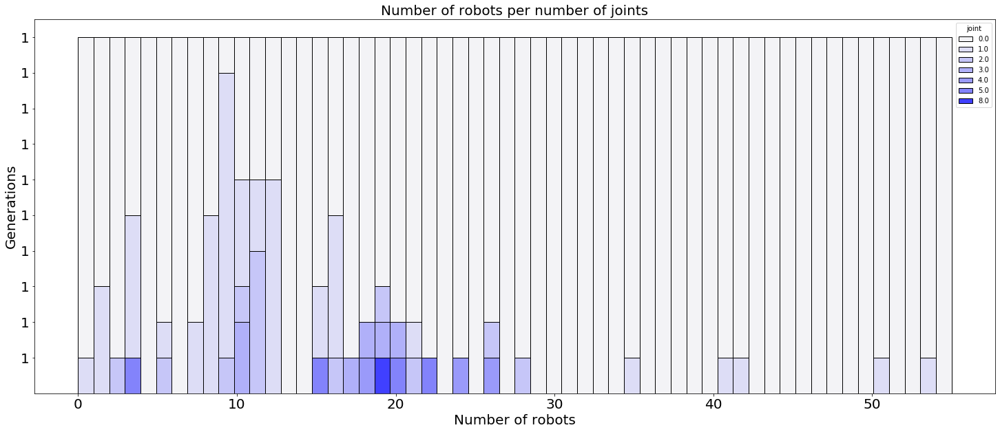

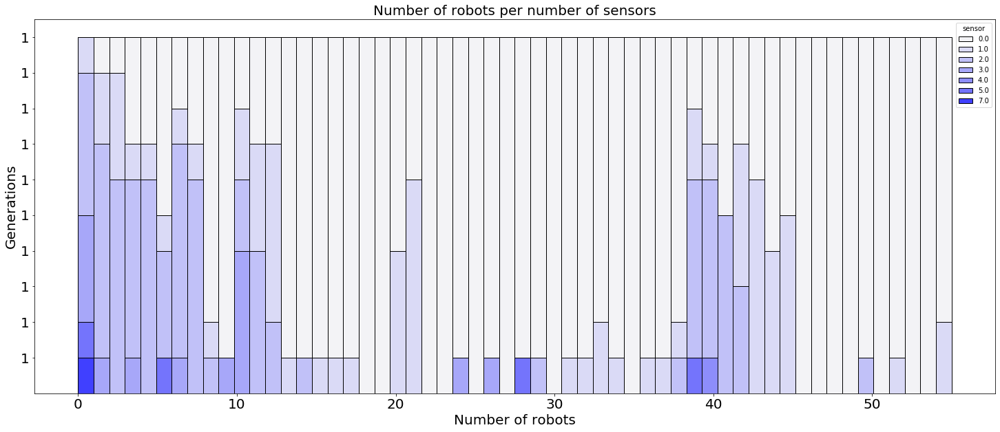

In [91]:
for i in range(5):
    plt.plot(speedup[i])
    plt.show()
    plt.plot(neval[i],best_fits[i])
    plt.show()
    plot_hist_nbr_rob("Number of robots per number of wheels",morph_data,'wheel')
    plot_hist_nbr_rob("Number of robots per number of joints",morph_data,'joint')
    plot_hist_nbr_rob("Number of robots per number of sensors",morph_data,'sensor')

In [116]:
exp_folder = "/home/leni/are-logs/mnipes_forth/noca/escape/"
best_fits = []
avg_fits = []
neval_per_gen = []
for folder in os.listdir(exp_folder):
    neval, best_ids, best_fit, avg_fit, pop_size = load_all_fitnesses(exp_folder + folder + "/fitnesses.csv",0)
    print(len(best_fit))
    nbr_eval = load_number_of_eval_per_gen(exp_folder + folder,len(best_fit))
    best_fits.append(best_fit)
    avg_fits.append(avg_fit)
    neval_per_gen.append(nbr_eval)
    nocap_v_wcap.append(["no archive","escape",max(best_fit),max(avg_fit),np.mean(best_fit),np.mean(avg_fit)])

59
21
53
25
55


In [93]:
morph_data=[]
for folder in os.listdir(exp_folder):
    lines = []
    descriptors = load_descriptor(exp_folder + folder + "/MD_Cart_WDH.csv",8)
    for desc in descriptors:
        lines.append([desc[0],str(desc[1]),desc[6]*16,desc[7]*16,desc[8]*16])
    morph_data.append(pd.DataFrame(data=lines,columns=["gen","robot","wheel","sensor","joint"]))

In [117]:
speedup = []
neval = []
for i in range(5):
    theo_max = [2000]*len(neval_per_gen[i])
    cumul_neval = neval_per_gen[i]    
    speedup.append(np.array(theo_max) - np.array(neval_per_gen[i]))
    for j in range(len(neval_per_gen[i])-1):
        cumul_neval[j+1]+=cumul_neval[j]
    neval.append(cumul_neval)
    speedup_nvw.append(["no archive","escape",max(speedup[-1]),np.mean(speedup[-1])])

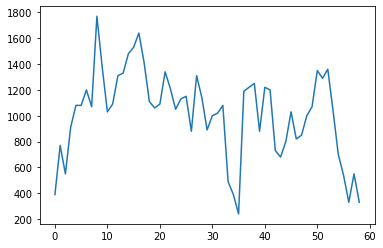

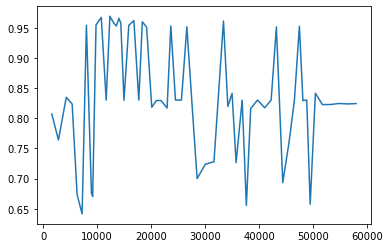

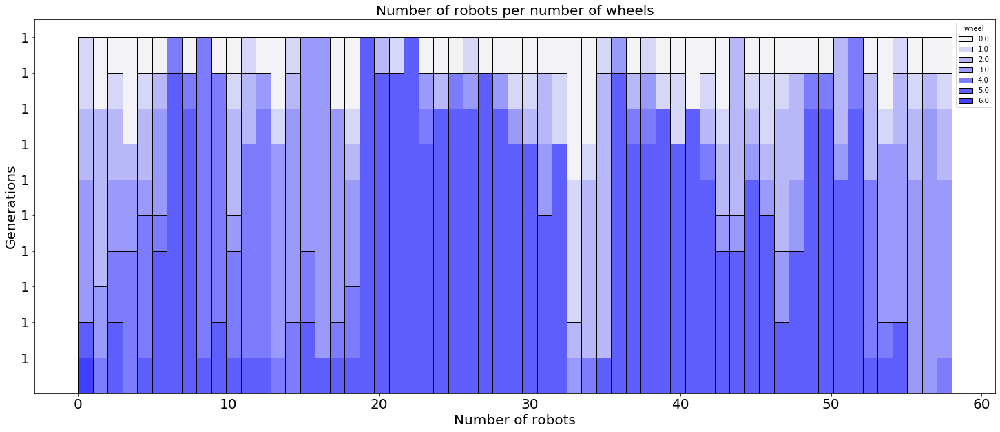

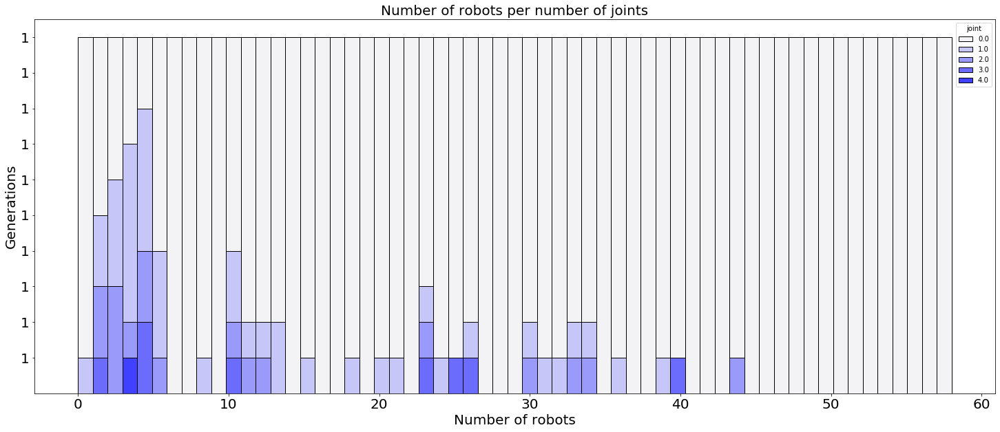

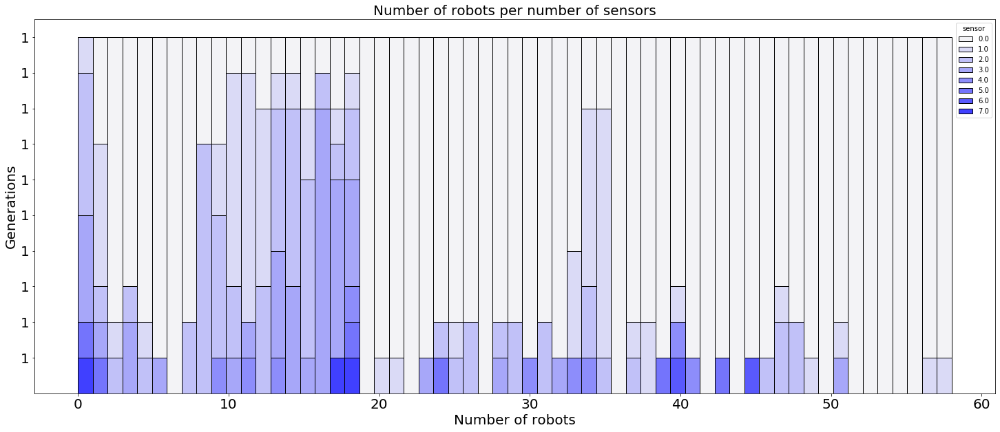

...

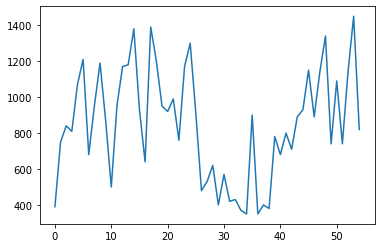

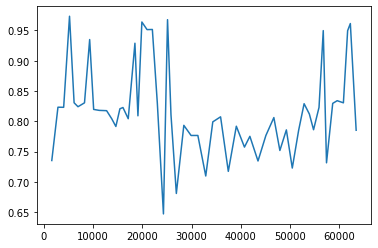

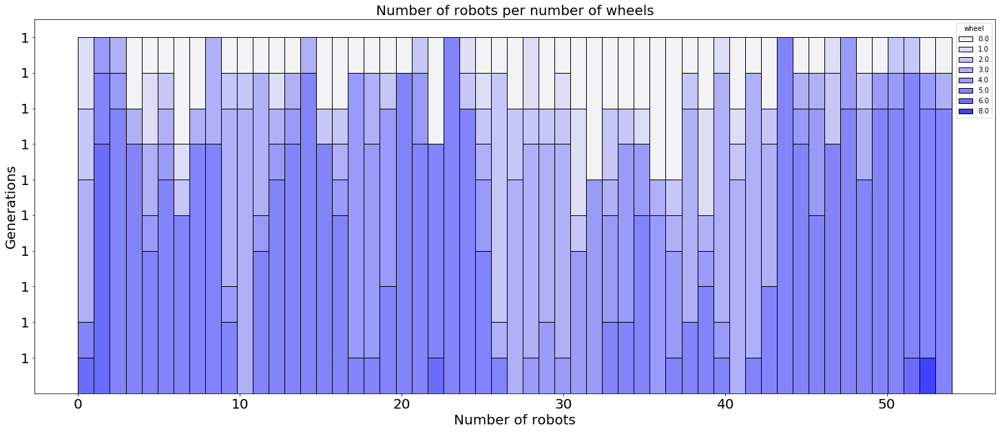

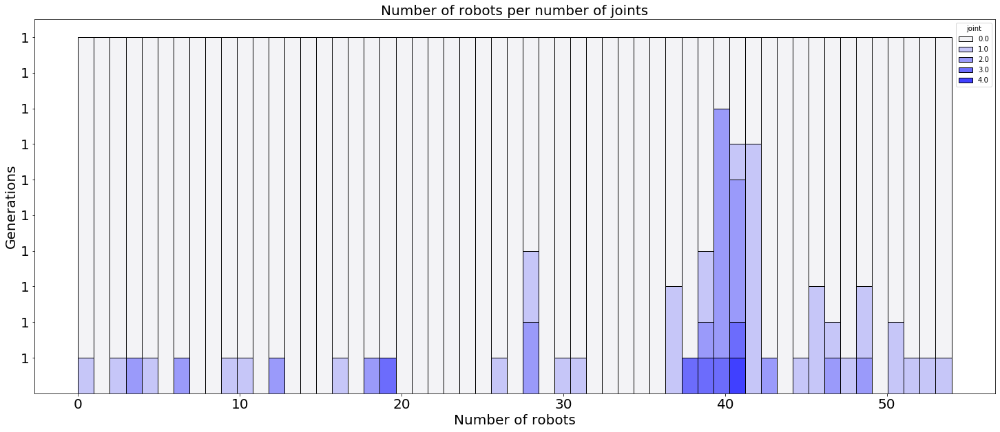

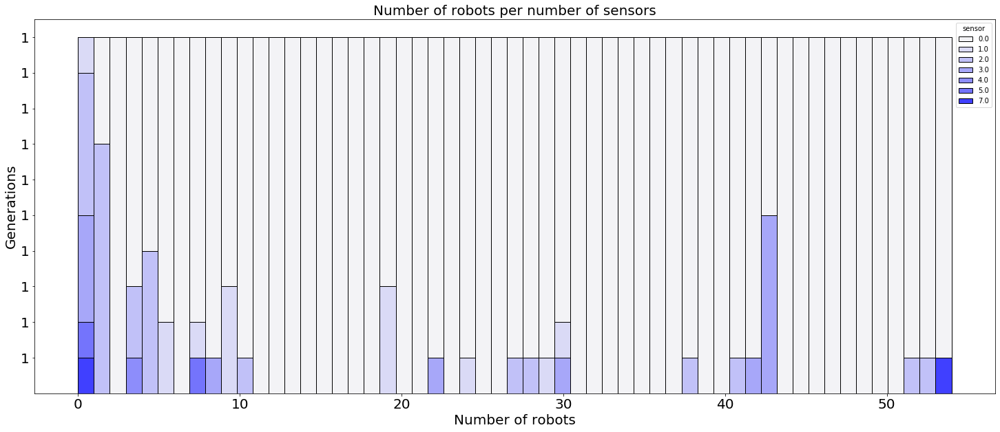

In [95]:
for i in range(5):
    plt.plot(speedup[i])
    plt.show()
    plt.plot(neval[i],best_fits[i])
    plt.show()
    plot_hist_nbr_rob("Number of robots per number of wheels",morph_data,'wheel')
    plot_hist_nbr_rob("Number of robots per number of joints",morph_data,'joint')
    plot_hist_nbr_rob("Number of robots per number of sensors",morph_data,'sensor')

In [118]:
exp_folder = "/home/leni/are-logs/mnipes_forth/noca/easy/"
best_fits = []
avg_fits = []
neval_per_gen = []
for folder in os.listdir(exp_folder):
    neval, best_ids, best_fit, avg_fit, pop_size = load_all_fitnesses(exp_folder + folder + "/fitnesses.csv",0)
    print(len(best_fit))
    nbr_eval = load_number_of_eval_per_gen(exp_folder + folder,len(best_fit))
    best_fits.append(best_fit)
    avg_fits.append(avg_fit)
    neval_per_gen.append(nbr_eval)
    nocap_v_wcap.append(["no archive","easy",max(best_fit),max(avg_fit),np.mean(best_fit),np.mean(avg_fit)])

29
31
22
23
36
20
47
34
47
36


In [97]:
morph_data=[]
for folder in os.listdir(exp_folder):
    lines = []
    descriptors = load_descriptor(exp_folder + folder + "/MD_Cart_WDH.csv",8)
    for desc in descriptors:
        lines.append([desc[0],str(desc[1]),desc[6]*16,desc[7]*16,desc[8]*16])
    morph_data.append(pd.DataFrame(data=lines,columns=["gen","robot","wheel","sensor","joint"]))

In [119]:
speedup = []
neval = []
for i in range(5):
    theo_max = [2000]*len(neval_per_gen[i])
    cumul_neval = neval_per_gen[i]    
    speedup.append(np.array(theo_max) - np.array(neval_per_gen[i]))
    for j in range(len(neval_per_gen[i])-1):
        cumul_neval[j+1]+=cumul_neval[j]
    neval.append(cumul_neval)
    speedup_nvw.append(["no archive","easy",max(speedup[-1]),np.mean(speedup[-1])])

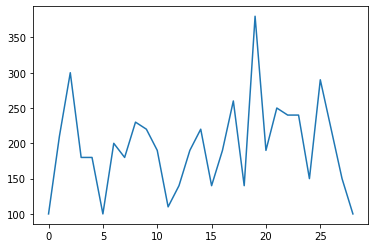

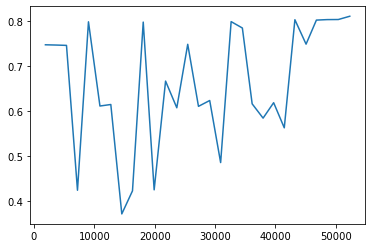

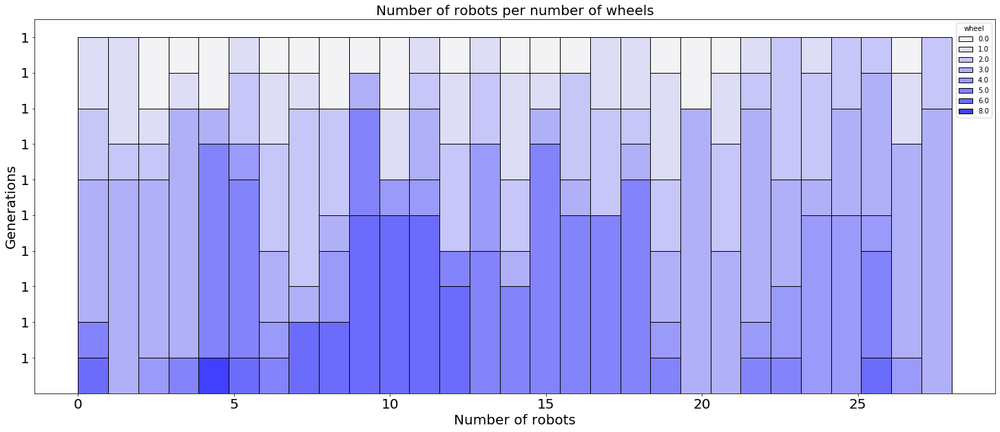

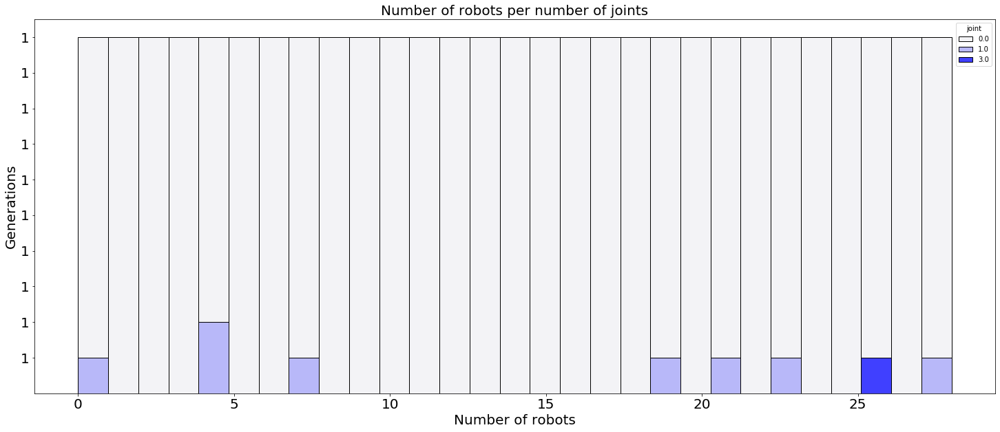

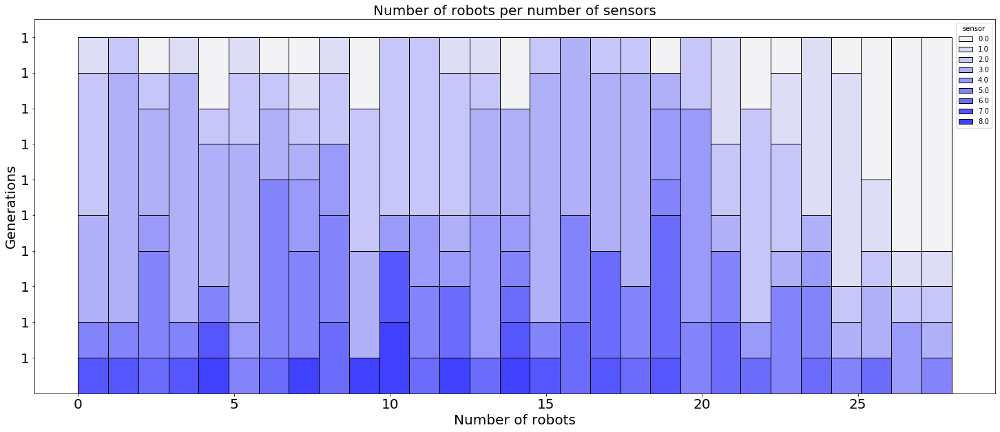

...

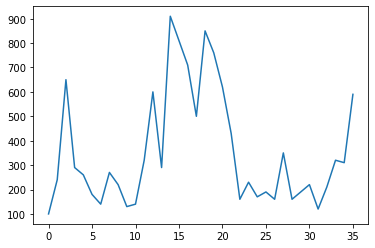

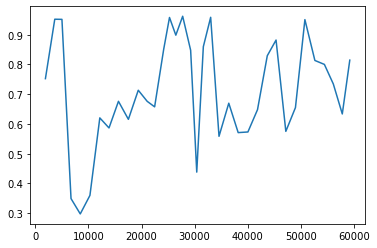

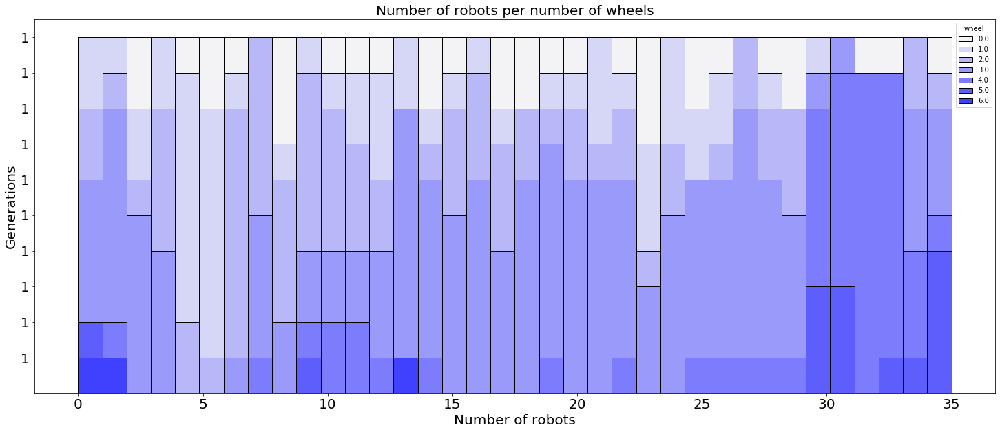

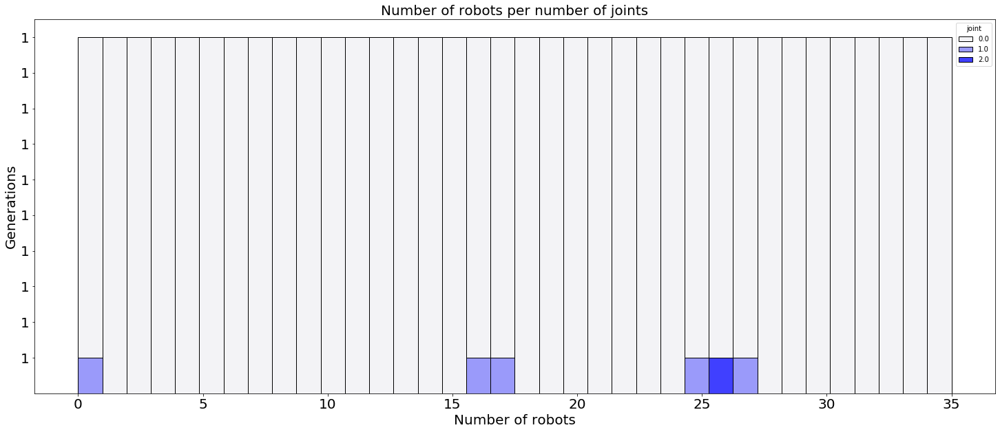

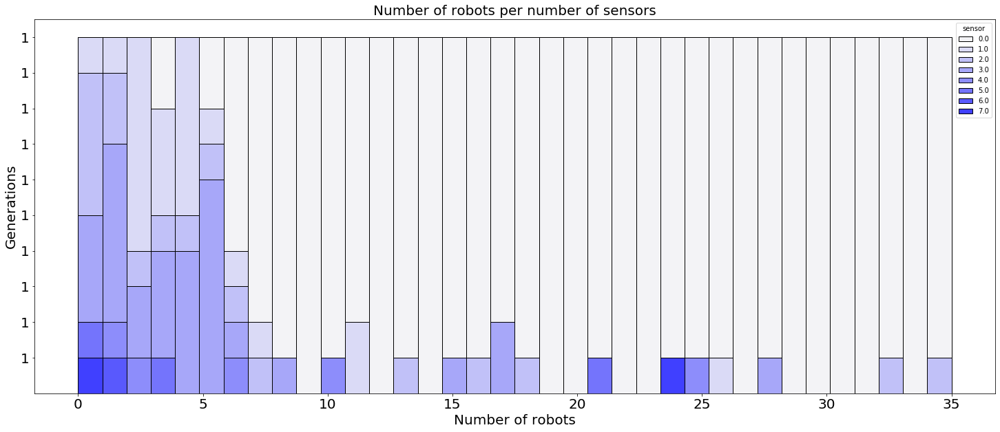

In [99]:
for i in range(5):
    plt.plot(speedup[i])
    plt.show()
    plt.plot(neval[i],best_fits[i])
    plt.show()
    plot_hist_nbr_rob("Number of robots per number of wheels",morph_data,'wheel')
    plot_hist_nbr_rob("Number of robots per number of joints",morph_data,'joint')
    plot_hist_nbr_rob("Number of robots per number of sensors",morph_data,'sensor')

In [120]:
ca_data = pd.DataFrame(data=nocap_v_wcap,columns=["alg","env","max best fit","max avg fit","avg best fit","avg avg fit"])
speed_data = pd.DataFrame(data=speedup_nvw,columns=["alg","env","max speed up","avg speed up"])

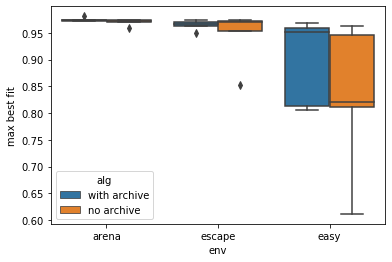

In [121]:
sns.boxplot(data=ca_data,x="env",y="max best fit",hue="alg")

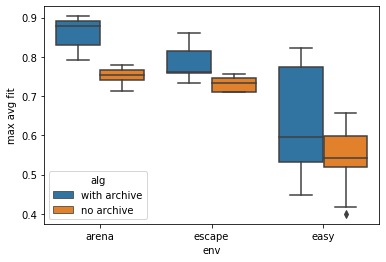

In [122]:
sns.boxplot(data=ca_data,x="env",y="max avg fit",hue="alg")

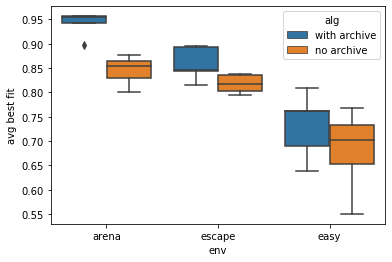

In [123]:
sns.boxplot(data=ca_data,x="env",y="avg best fit",hue="alg")

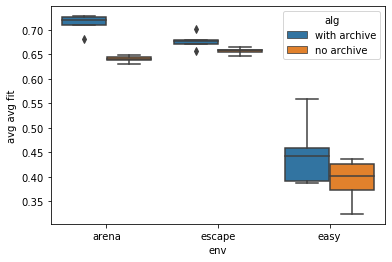

In [124]:
sns.boxplot(data=ca_data,x="env",y="avg avg fit",hue="alg")

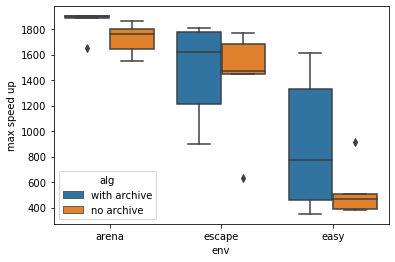

In [125]:
sns.boxplot(data=speed_data,x="env",y="max speed up",hue="alg")

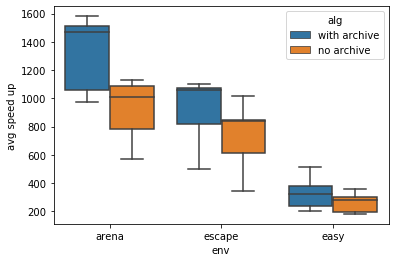

In [126]:
sns.boxplot(data=speed_data,x="env",y="avg speed up",hue="alg")

In [63]:
nocap_v_wcap = []
speedup_nvw = []

In [64]:
exp_folder = "/home/leni/are-logs/mnipes_fifth_hard_fit_fcts/bf/"
lines = []
for folder in os.listdir(exp_folder):
    neval, best_ids, best_fit, avg_fit, pop_size = load_all_fitnesses(exp_folder + folder + "/fitnesses.csv",0)
    print(len(best_fit))
    nocap_v_wcap.append(["best fitness",max(best_fit),max(avg_fit),np.mean(best_fit),np.mean(avg_fit)])
    nbr_eval = load_number_of_eval_per_gen(exp_folder + folder,len(best_fit))
    theo_max = [2000]*len(nbr_eval)
    speedup = np.array(theo_max) - np.array(nbr_eval)
    speedup_nvw.append(["best fitness",max(speedup),np.mean(speedup)])
    nbr_ctrl_v = []
    gen_v = []
    for file in os.listdir(exp_folder + folder):
        if(file.split("_")[0] != "controller"):
            continue
        gen_v.append(float(file.split("archive")[-1]))
        ctrl_arch = load_controller_archive(exp_folder + folder + "/" + file)
        nbr_ctrl=0
        for i,line in ctrl_arch.iterrows():
            if(line["fitness"] > 0):
                nbr_ctrl+=1
        nbr_ctrl_v.append(nbr_ctrl)
    nbr_ctrl_v = [nbr_ctrl_v[i] for i in np.argsort(gen_v)]
    for gen, bf, af, su,nc in zip(range(len(best_fit)),best_fit,avg_fit,speedup,nbr_ctrl_v):
        lines.append([gen,bf,af,su,nc])
data = pd.DataFrame(data=lines,columns=["generation","best fitness","average fitness","speed up","number of controllers"])

26
25
33
24
24
23
21
22


In [81]:
lines = []
for folder in os.listdir(exp_folder):
    lines += load_ind_fitnesses(exp_folder + folder + "/fitnesses.csv",0)
fit_data = pd.DataFrame(data=lines,columns=["generation","individual","fitness"])
print(fit_data)

      generation  individual   fitness
0              0           0  0.637921
1              0           1  0.504772
2              0           2  0.669346
3              0           3  0.858333
4              0           4  0.493646
...          ...         ...       ...
1975          21           5  0.828701
1976          21           6  0.860342
1977          21           7  0.620434
1978          21           8  0.250074
1979          21           9  0.438605

[1980 rows x 3 columns]


/home/leni/.local/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 73.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/leni/.local/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 61.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/leni/.local/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 69.2% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/leni/.local/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 49.3% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/leni/.local/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 22.2

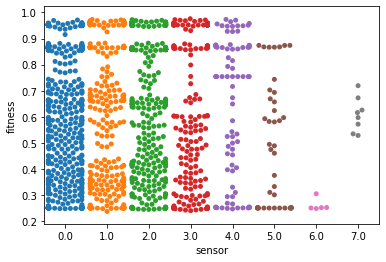

In [101]:
lines = []
sparsness = []
for folder in os.listdir(exp_folder):
    descriptors = load_descriptor(exp_folder + folder + "/MD_Cart_WDH.csv",8)
    sparsness += sparsness_per_gen(descriptors)
    for desc in descriptors:
        lines.append([desc[0],str(desc[1]),desc[6]*16,desc[7]*16,desc[8]*16])
        
sparsness_data = pd.DataFrame(data=sparsness,columns=["generation","sparsness"])
print(sparsness_data)
morph_data = pd.DataFrame(data=lines,columns=["gen","robot","wheel","sensor","joint"])
morph_data = pd.concat([morph_data,fit_data],axis=1,join="inner")


In [ ]:
sns.swarmplot(data=morph_data,x="sensor",y="fitness")

/home/leni/.local/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 83.9% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/leni/.local/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 58.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/leni/.local/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 54.3% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/leni/.local/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 70.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/leni/.local/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 81.8

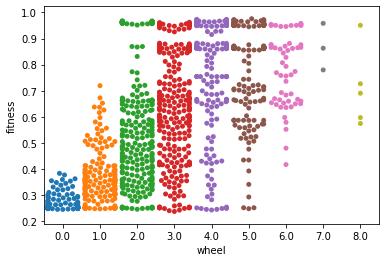

In [97]:
sns.swarmplot(data=morph_data,x="wheel",y="fitness")

/home/leni/.local/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 86.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/leni/.local/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 31.4% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/leni/.local/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 11.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/leni/.local/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 52.6% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


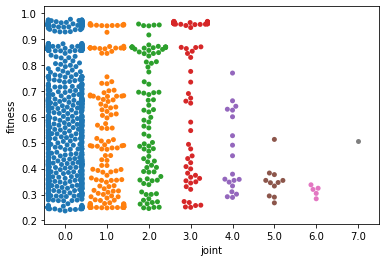

In [102]:
sns.swarmplot(data=morph_data,x="joint",y="fitness")

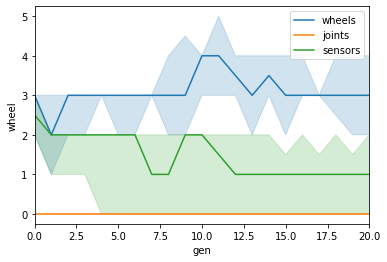

In [91]:
ax = sns.lineplot(data=morph_data,x="gen",y="wheel",estimator=np.median,ci=100)
sns.lineplot(data=morph_data,x="gen",y="joint",estimator=np.median,ci=100)
sns.lineplot(data=morph_data,x="gen",y="sensor",estimator=np.median,ci=100)
ax.set_xlim([0,20])
ax.legend(["wheels","joints","sensors"])

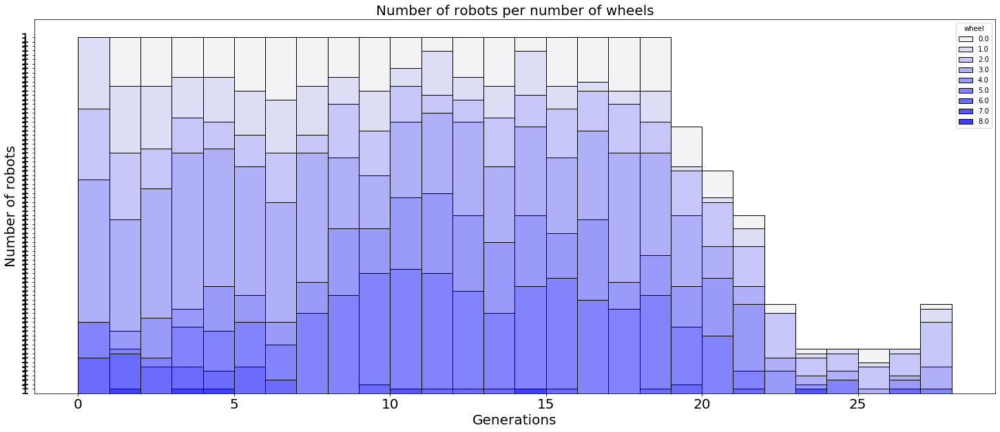

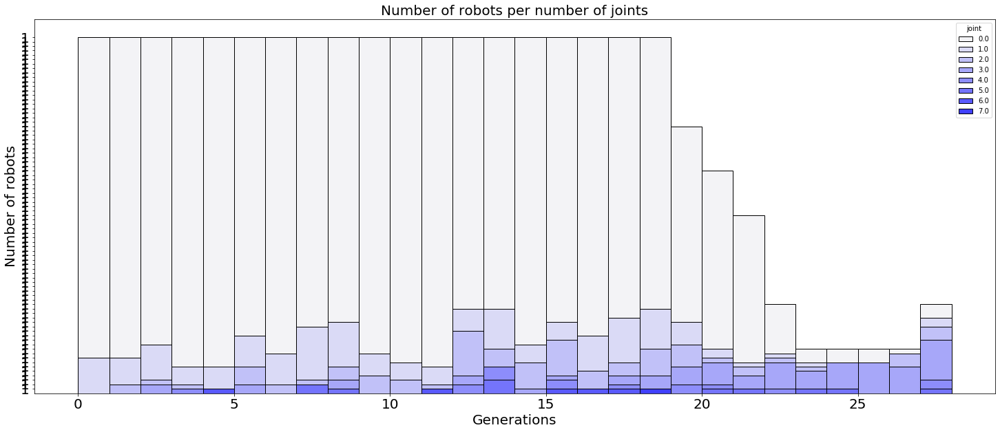

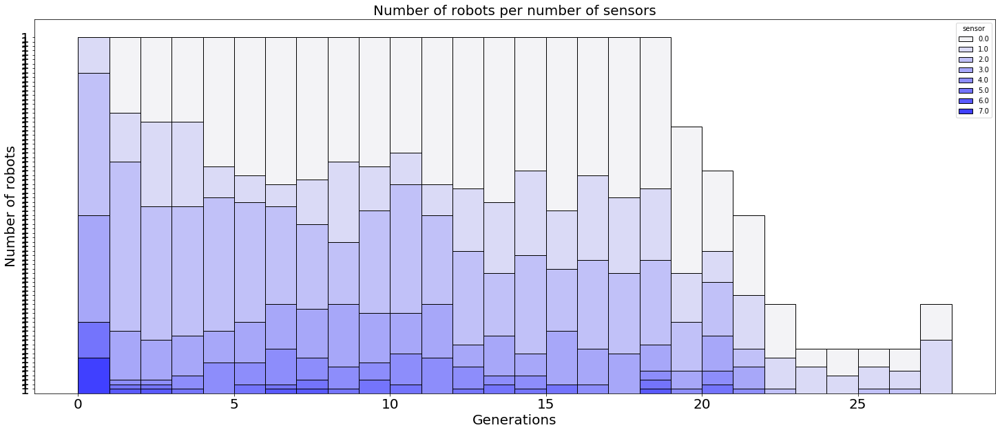

In [134]:
plot_hist_nbr_rob("Number of robots per number of wheels",morph_data,'wheel',28,80)
plot_hist_nbr_rob("Number of robots per number of joints",morph_data,'joint',28,80)
plot_hist_nbr_rob("Number of robots per number of sensors",morph_data,'sensor',28,80)

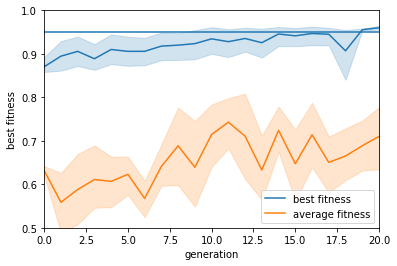

In [77]:
ax = sns.lineplot(data=data,x="generation",y="best fitness")
ax = sns.lineplot(data=data,x="generation",y="average fitness")
ax.set_xlim([0,20])
ax.set_ylim([0.5,1])
ax.axhline([0.95])
plt.legend(["best fitness","average fitness"])

(-400, 700)

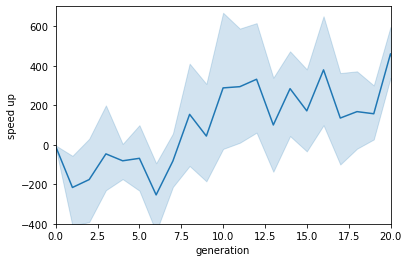

In [70]:
ax = sns.lineplot(data=data,x="generation",y="speed up")
ax.set_xlim([0,20])
ax.set_ylim([-400,700])

(9, 50)

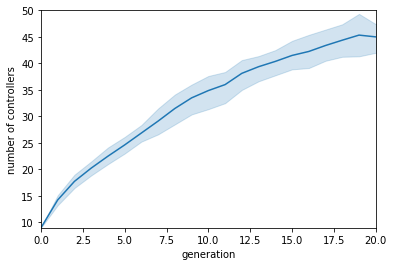

In [67]:
ax = sns.lineplot(data=data,x="generation",y="number of controllers")
ax.set_xlim([0,20])
ax.set_ylim([9,50])

In [169]:
exp_folder = "/home/leni/are-logs/mnipes_fifth_hard_fit_fcts/af/"
lines = []
for folder in os.listdir(exp_folder):
    neval, best_ids, best_fit, avg_fit, pop_size = load_all_fitnesses(exp_folder + folder + "/fitnesses.csv",0)
    print(len(best_fit))
    best_fit = load_controllers_fitnesses(exp_folder+folder,len(best_fit))
    best_fit = [max(f) for f in best_fit]
    nocap_v_wcap.append(["average fitness",max(best_fit),max(avg_fit),np.mean(best_fit),np.mean(avg_fit)])
    nbr_eval = load_number_of_eval_per_gen(exp_folder + folder,len(best_fit))
    theo_max = [2000]*len(nbr_eval)
    speedup = np.array(theo_max) - np.array(nbr_eval)
    speedup_nvw.append(["average fitness",max(speedup),np.mean(speedup)])
    nbr_ctrl_v = []
    gen_v = []
    for file in os.listdir(exp_folder + folder):
        if(file.split("_")[0] != "controller"):
            continue
        gen_v.append(float(file.split("archive")[-1]))
        ctrl_arch = load_controller_archive(exp_folder + folder + "/" + file)
        nbr_ctrl=0
        for i,line in ctrl_arch.iterrows():
            if(line["fitness"] > 0):
                nbr_ctrl+=1
        nbr_ctrl_v.append(nbr_ctrl)
    nbr_ctrl_v = [nbr_ctrl_v[i] for i in np.argsort(gen_v)]
    for gen, bf, af, su,nc in zip(range(len(best_fit)),best_fit,avg_fit,speedup,nbr_ctrl_v):
        lines.append([gen,bf,af,su,nc])
data = pd.DataFrame(data=lines,columns=["generation","best fitness","average fitness","speed up","number of controllers"])

19
13
21
11
19
28
15
19


In [ ]:
ax = sns.lineplot(data=data,x="generation",y="best fitness")
ax = sns.lineplot(data=data,x="generation",y="average fitness")
ax.set_xlim([0,20])
ax.set_ylim([0.4,1])
ax.axhline([0.95])
plt.legend(["best fitness","average fitness"])

(-450, 0)

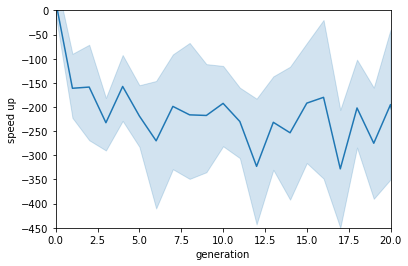

In [89]:
ax = sns.lineplot(data=data,x="generation",y="speed up")
ax.set_xlim([0,20])
ax.set_ylim([-450,0])

(9, 50)

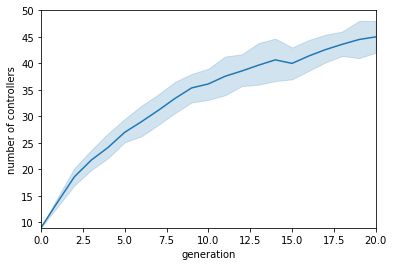

In [86]:
ax = sns.lineplot(data=data,x="generation",y="number of controllers")
ax.set_xlim([0,20])
ax.set_ylim([9,50])

In [170]:
exp_folder = "/home/leni/are-logs/mnipes_fifth_hard_fit_fcts/lp/"
for folder in os.listdir(exp_folder):
    neval, best_ids, best_fit, avg_fit, pop_size = load_all_fitnesses(exp_folder + folder + "/fitnesses.csv",0)
    best_fit = load_controllers_fitnesses(exp_folder+folder,len(best_fit))
    print(len(best_fit))
    best_fit = [max(f) for f in best_fit]
    nocap_v_wcap.append(["learning progress",max(best_fit),max(avg_fit),np.mean(best_fit),np.mean(avg_fit)])
    nbr_eval = load_number_of_eval_per_gen(exp_folder + folder,len(best_fit))
    theo_max = [2000]*len(nbr_eval)
    speedup = np.array(theo_max) - np.array(nbr_eval)
    speedup_nvw.append(["learning progress",max(speedup),np.mean(speedup)])
    

7
28
23
6
23
22
22
7


In [171]:
ca_data = pd.DataFrame(data=nocap_v_wcap,columns=["fitness","max best fit","max avg fit","avg best fit","avg avg fit"])
speed_data = pd.DataFrame(data=speedup_nvw,columns=["fitness","max speed up","avg speed up"])

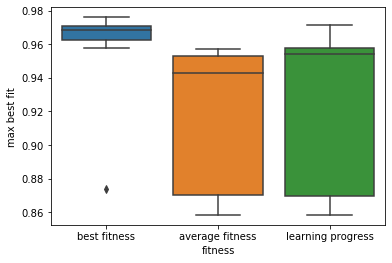

In [172]:
sns.boxplot(data=ca_data,x="fitness",y="max best fit")

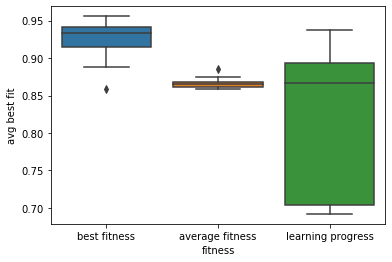

In [173]:
sns.boxplot(data=ca_data,x="fitness",y="avg best fit")

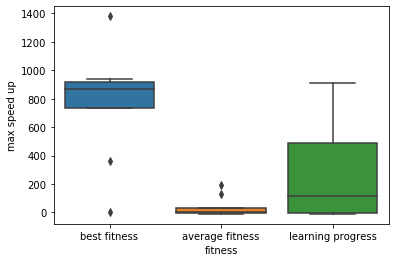

In [174]:
sns.boxplot(data=speed_data,x="fitness",y="max speed up")

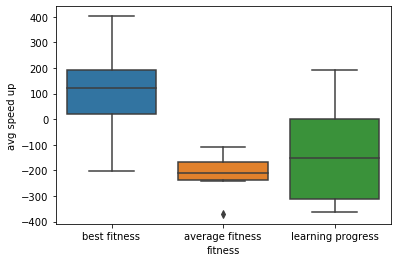

In [175]:
sns.boxplot(data=speed_data,x="fitness",y="avg speed up")

In [120]:
exp_folder = "/home/leni/are-logs/mnipes_fifth_hard_fit_fcts/bf/"
best_fits = []
avg_fits = []
neval_per_gen = []
for folder in os.listdir(exp_folder):
    neval, best_ids, best_fit, avg_fit, pop_size = load_all_fitnesses(exp_folder + folder + "/fitnesses.csv",0)
    print(len(best_fit))
    nbr_eval = load_number_of_eval_per_gen(exp_folder + folder,len(best_fit))
    best_fits.append(best_fit)
    avg_fits.append(avg_fit)
    neval_per_gen.append(nbr_eval)

23
22
29
22
21
19
19
20


In [121]:
morph_data=[]
for folder in os.listdir(exp_folder):
    lines = []
    descriptors = load_descriptor(exp_folder + folder + "/MD_Cart_WDH.csv",8)
    for desc in descriptors:
        lines.append([desc[0],str(desc[1]),desc[6]*16,desc[7]*16,desc[8]*16])
    morph_data.append(pd.DataFrame(data=lines,columns=["gen","robot","wheel","sensor","joint"]))

In [48]:
dataframes=[]
for folder in os.listdir(exp_folder):
    lines = []
    for file in os.listdir(exp_folder + folder):
        if(file.split("_")[0] != "controller"):
            continue
        gen = float(file.split("archive")[-1])
        ctrl_arch = load_controller_archive(exp_folder + folder + "/" + file)
        nbr_ctrl=0
        for i,line in ctrl_arch.iterrows():
            if(line["fitness"] > 0):
                nbr_ctrl+=1
        lines.append([gen,nbr_ctrl])
    dataframes.append(pd.DataFrame(data=lines,columns=["gen","nbr_ctrl"]))

In [122]:
speedup = []
neval = []
for i in range(5):
    theo_max = [2000]*len(neval_per_gen[i])
    cumul_neval = neval_per_gen[i]    
    speedup.append(np.array(theo_max) - np.array(neval_per_gen[i]))
    for j in range(len(neval_per_gen[i])-1):
        cumul_neval[j+1]+=cumul_neval[j]
    neval.append(cumul_neval)

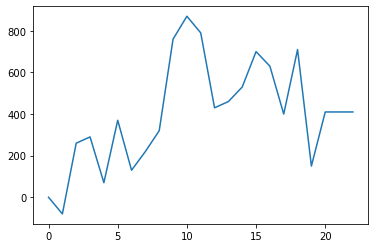

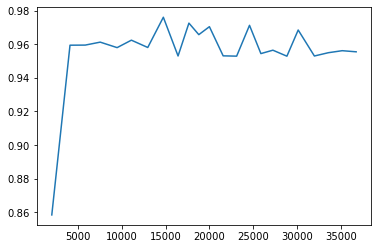

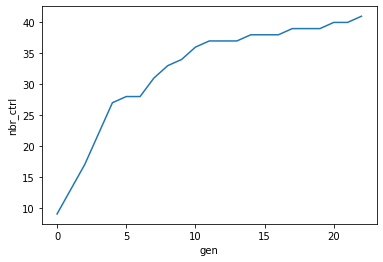

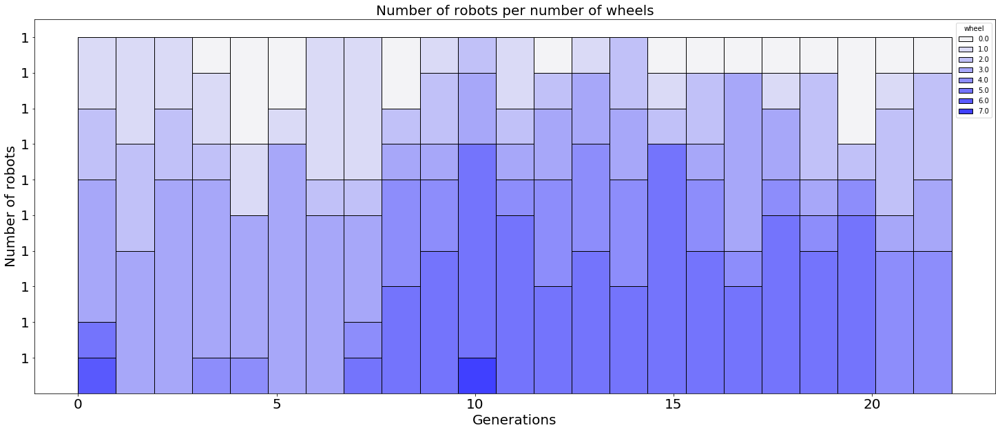

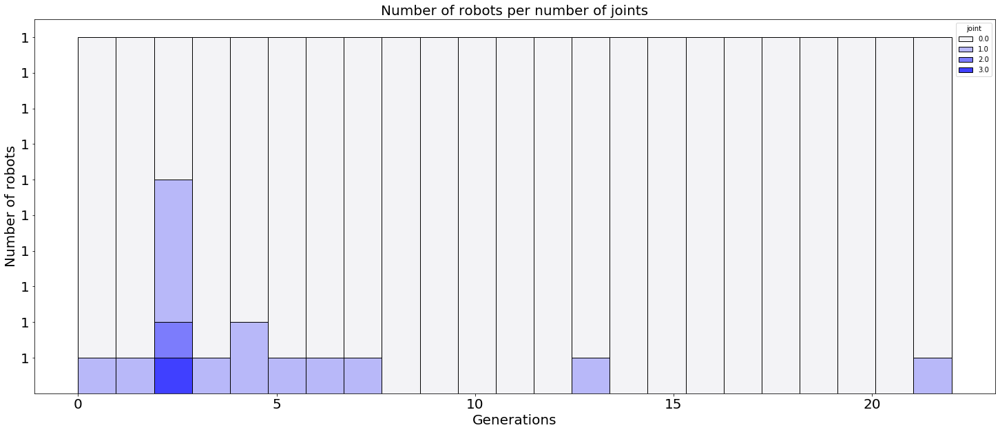

...

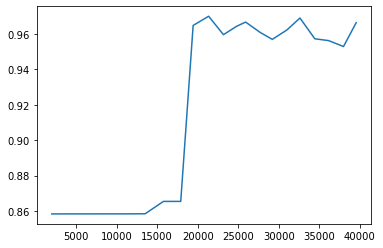

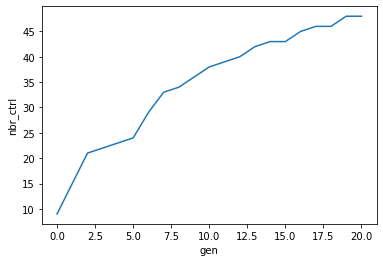

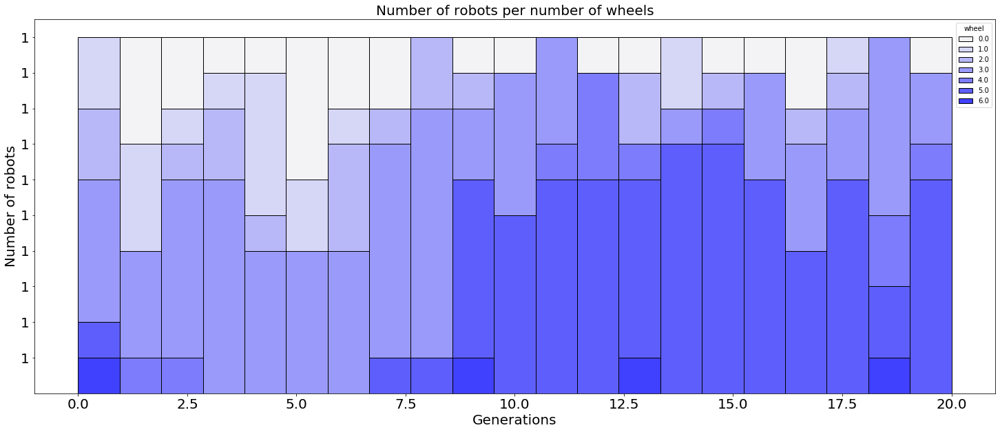

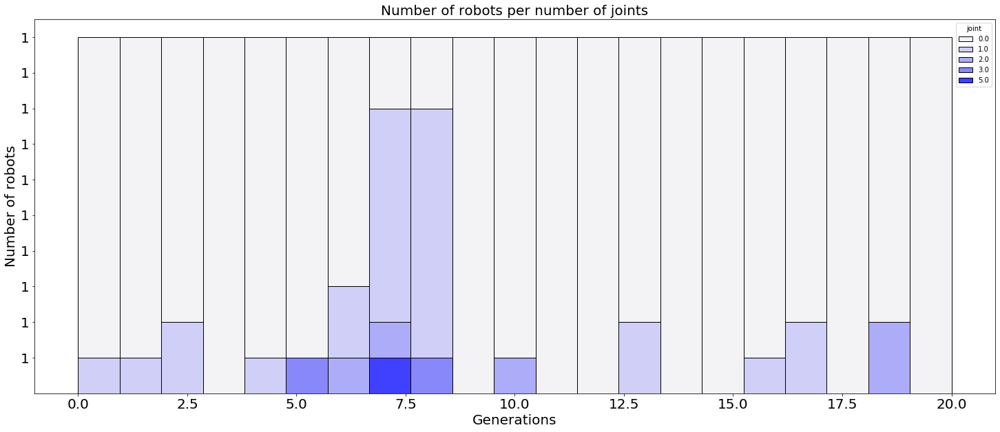

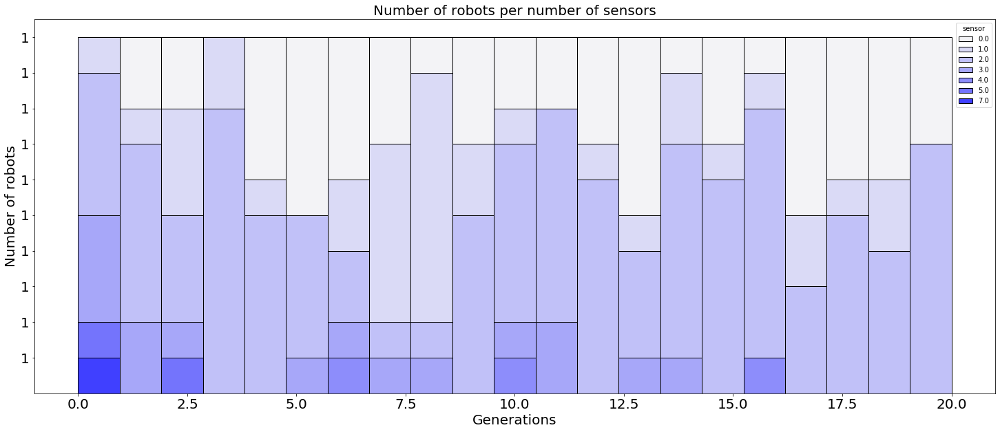

In [123]:
for i in range(5):
    plt.plot(speedup[i])
    plt.show()
    plt.plot(neval[i],best_fits[i])
    plt.show()
    sns.lineplot(data=dataframes[i],x='gen',y='nbr_ctrl')
    plt.show()
    plot_hist_nbr_rob("Number of robots per number of wheels",morph_data[i],'wheel',len(best_fits[i]))
    plot_hist_nbr_rob("Number of robots per number of joints",morph_data[i],'joint',len(best_fits[i]))
    plot_hist_nbr_rob("Number of robots per number of sensors",morph_data[i],'sensor',len(best_fits[i]))

In [5]:
exp_folder = "/home/leni/are-logs/mnipes_hard_bf/nb/"
lines = []
for folder in os.listdir(exp_folder):
    neval, best_ids, best_fit, avg_fit, pop_size = load_all_fitnesses(exp_folder + folder + "/fitnesses.csv",0)
    print(len(best_fit))
    nbr_eval = load_number_of_eval_per_gen(exp_folder + folder,len(best_fit))
    theo_max = [2000]*len(nbr_eval)
    speedup = np.array(theo_max) - np.array(nbr_eval)
    nbr_ctrl_v = []
    gen_v = []
    for file in os.listdir(exp_folder + folder):
        if(file.split("_")[0] != "controller"):
            continue
        gen_v.append(float(file.split("archive")[-1]))
        ctrl_arch = load_controller_archive(exp_folder + folder + "/" + file)
        nbr_ctrl=0
        for i,line in ctrl_arch.iterrows():
            if(line["fitness"] > 0):
                nbr_ctrl+=1
        nbr_ctrl_v.append(nbr_ctrl)
    nbr_ctrl_v = [nbr_ctrl_v[i] for i in np.argsort(gen_v)]
    for gen, bf, af, su,nc in zip(range(len(best_fit)),best_fit,avg_fit,speedup,nbr_ctrl_v):
        lines.append([gen,bf,af,su,nc])
nb_data = pd.DataFrame(data=lines,columns=["generation","best fitness","average fitness","speed up","number of controllers"])

20
20
20
20
20
20
20
20
20
20


In [4]:
lines = []
for folder in os.listdir(exp_folder):
    descriptors = load_descriptor(exp_folder + folder + "/MD_Cart_WDH.csv",8)
    for desc in descriptors:
        lines.append([desc[0],str(desc[1]),desc[6]*16,desc[7]*16,desc[8]*16])
morph_data = pd.DataFrame(data=lines,columns=["gen","robot","wheel","sensor","joint"])

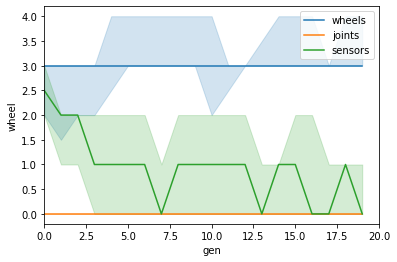

In [5]:
ax = sns.lineplot(data=morph_data,x="gen",y="wheel",estimator=np.median,ci=100)
sns.lineplot(data=morph_data,x="gen",y="joint",estimator=np.median,ci=100)
sns.lineplot(data=morph_data,x="gen",y="sensor",estimator=np.median,ci=100)
ax.set_xlim([0,20])
ax.legend(["wheels","joints","sensors"])

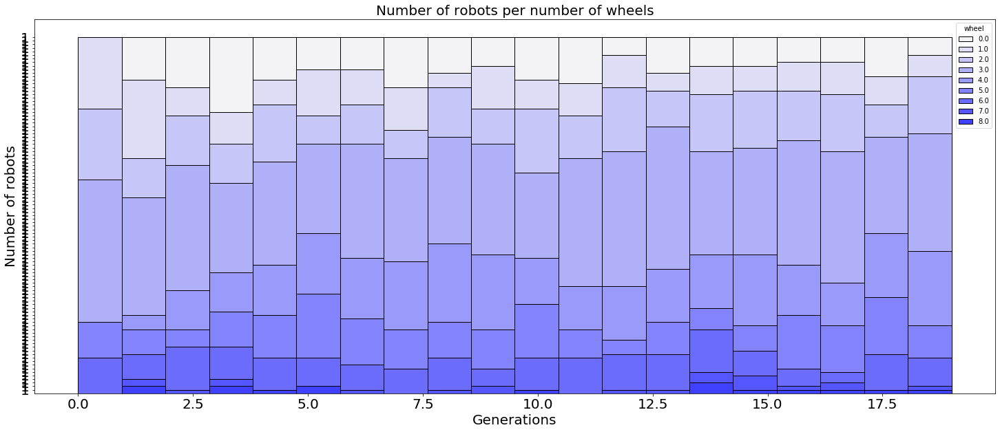

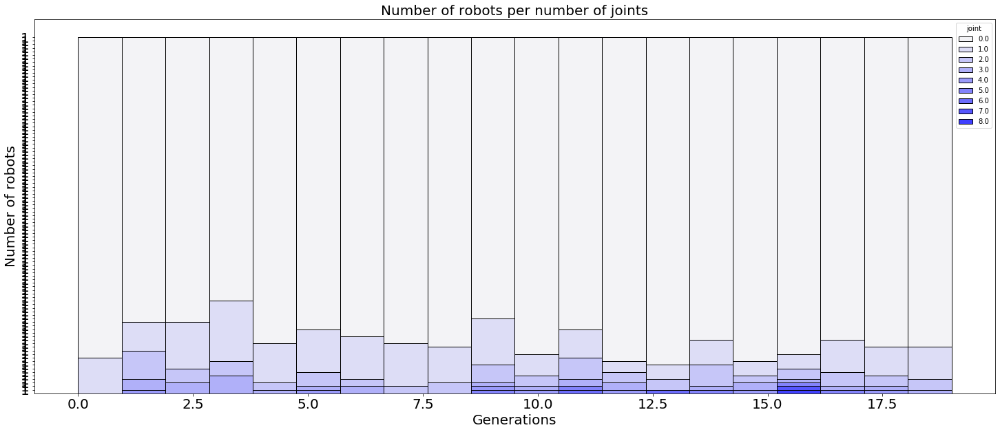

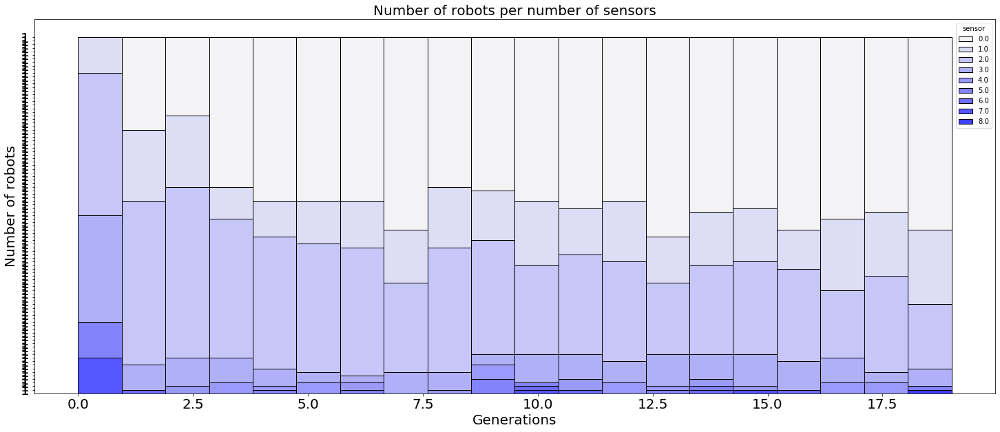

In [13]:
plot_hist_nbr_rob("Number of robots per number of wheels",morph_data,'wheel',20,100)
plot_hist_nbr_rob("Number of robots per number of joints",morph_data,'joint',20,100)
plot_hist_nbr_rob("Number of robots per number of sensors",morph_data,'sensor',20,100)

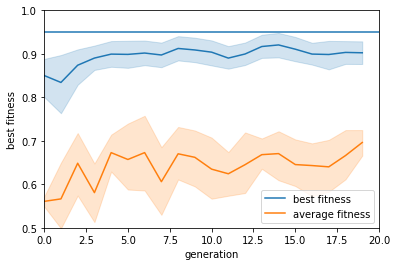

In [50]:
ax = sns.lineplot(data=nb_data,x="generation",y="best fitness")
ax = sns.lineplot(data=nb_data,x="generation",y="average fitness")
ax.set_xlim([0,20])
ax.set_ylim([0.5,1])
ax.axhline([0.95])
plt.legend(["best fitness","average fitness"])

(-400, 700)

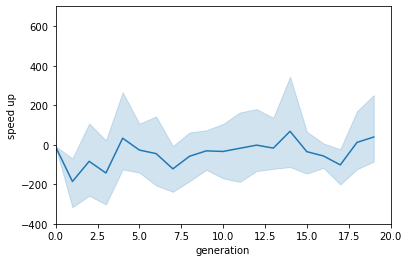

In [10]:
ax = sns.lineplot(data=data,x="generation",y="speed up")
ax.set_xlim([0,20])
ax.set_ylim([-400,700])

(9, 50)

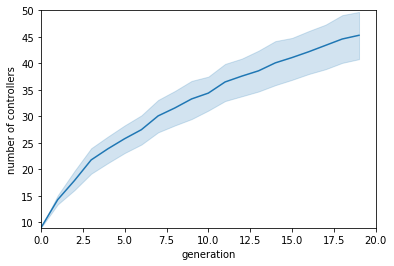

In [11]:
ax = sns.lineplot(data=data,x="generation",y="number of controllers")
ax.set_xlim([0,20])
ax.set_ylim([9,50])

In [147]:
exp_folder = "/home/leni/are-logs/mnipes_hard_bf/wb/"
lines = []
for folder in os.listdir(exp_folder):
    neval, best_ids, best_fit, avg_fit, pop_size = load_all_fitnesses(exp_folder + folder + "/fitnesses.csv",0)
    print(len(best_fit))
    nbr_eval = load_number_of_eval_per_gen(exp_folder + folder,len(best_fit))
    theo_max = [2000]*len(nbr_eval)
    speedup = np.array(theo_max) - np.array(nbr_eval)
    nbr_ctrl_v = []
    gen_v = []
    for file in os.listdir(exp_folder + folder):
        if(file.split("_")[0] != "controller"):
            continue
        gen_v.append(float(file.split("archive")[-1]))
        ctrl_arch = load_controller_archive(exp_folder + folder + "/" + file)
        nbr_ctrl=0
        for i,line in ctrl_arch.iterrows():
            if(line["fitness"] > 0):
                nbr_ctrl+=1
        nbr_ctrl_v.append(nbr_ctrl)
    nbr_ctrl_v = [nbr_ctrl_v[i] for i in np.argsort(gen_v)]
    for gen, bf, af, su,nc in zip(range(len(best_fit)),best_fit,avg_fit,speedup,nbr_ctrl_v):
        lines.append([gen,bf,af,su,nc])
wb_data = pd.DataFrame(data=lines,columns=["generation","best fitness","average fitness","speed up","number of controllers"])

20
20
20
20
20
20
20
20
20
20


In [140]:
lines = []
for folder in os.listdir(exp_folder):
    lines += load_ind_fitnesses(exp_folder + folder + "/fitnesses.csv",0)
fit_data = pd.DataFrame(data=lines,columns=["generation","individual","fitness"])


In [141]:
lines = []
sparsness = []
for folder in os.listdir(exp_folder):
    descriptors = load_descriptor(exp_folder + folder + "/MD_Cart_WDH.csv",8)
    sparsness += sparsness_per_gen(descriptors)
    for desc in descriptors:
        lines.append([desc[0],str(desc[1]),desc[6]*16,desc[7]*16,desc[8]*16])
        
sparsness_data = pd.DataFrame(data=sparsness,columns=["generation","sparsness"])
morph_data = pd.DataFrame(data=lines,columns=["gen","robot","wheel","sensor","joint"])
morph_data = pd.concat([morph_data,fit_data],axis=1,join="inner")

/home/leni/.local/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 78.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/leni/.local/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 53.6% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/leni/.local/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 65.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/leni/.local/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 23.9% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/leni/.local/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 35.7

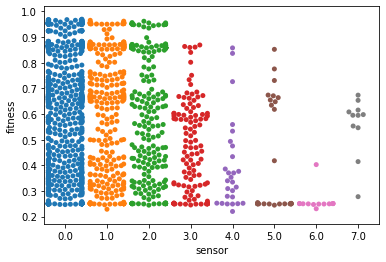

In [142]:
sns.swarmplot(data=morph_data,x="sensor",y="fitness")

/home/leni/.local/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 85.6% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/leni/.local/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 53.4% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/leni/.local/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 53.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/leni/.local/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 77.9% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/leni/.local/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 55.2

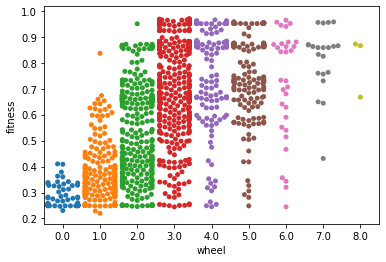

In [143]:
sns.swarmplot(data=morph_data,x="wheel",y="fitness")

/home/leni/.local/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 84.2% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/leni/.local/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 46.9% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/leni/.local/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 19.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/leni/.local/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 47.3% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/leni/.local/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 20.5

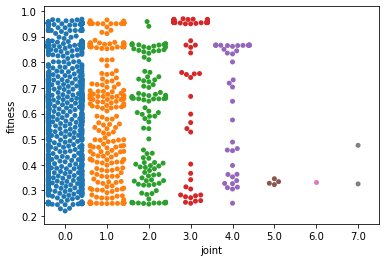

In [144]:
sns.swarmplot(data=morph_data,x="joint",y="fitness")

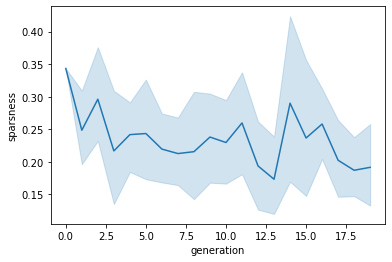

In [145]:
sns.lineplot(data=sparsness_data,x="generation",y="sparsness")

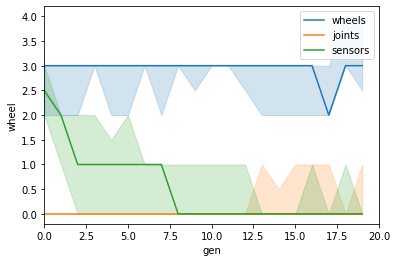

In [16]:
ax = sns.lineplot(data=morph_data,x="gen",y="wheel",estimator=np.median,ci=100)
sns.lineplot(data=morph_data,x="gen",y="joint",estimator=np.median,ci=100)
sns.lineplot(data=morph_data,x="gen",y="sensor",estimator=np.median,ci=100)
ax.set_xlim([0,20])
ax.legend(["wheels","joints","sensors"])

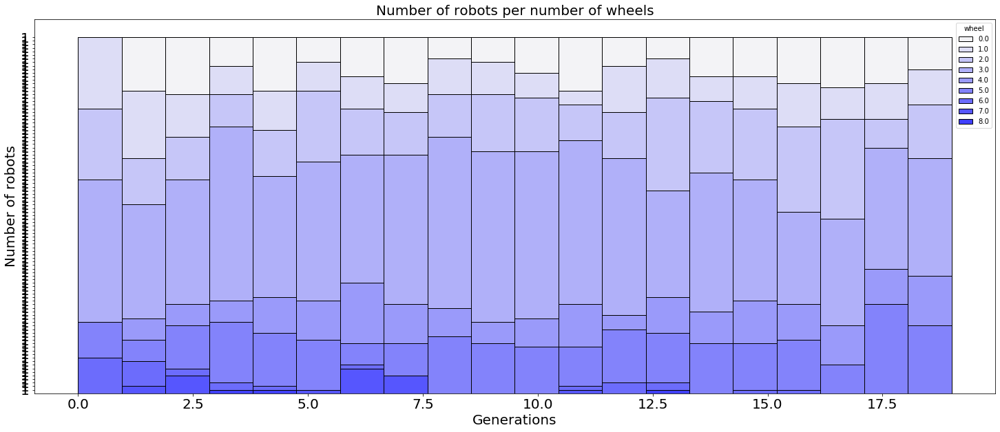

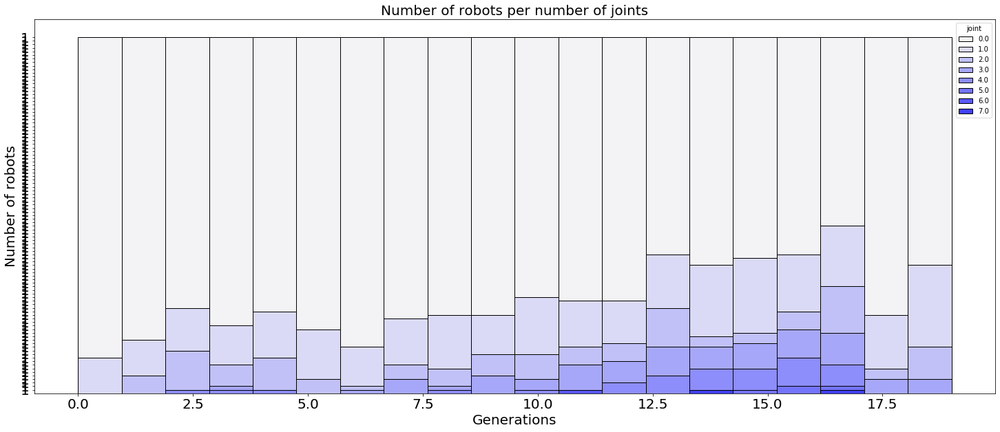

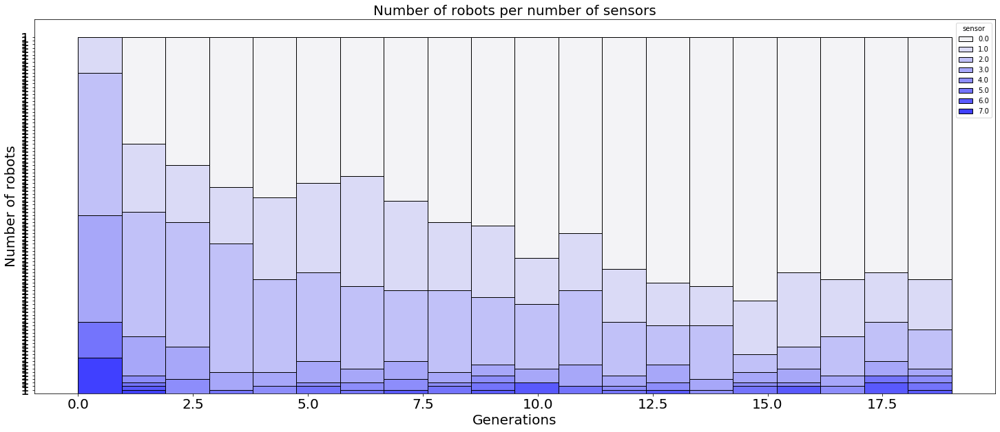

In [17]:
plot_hist_nbr_rob("Number of robots per number of wheels",morph_data,'wheel',20,100)
plot_hist_nbr_rob("Number of robots per number of joints",morph_data,'joint',20,100)
plot_hist_nbr_rob("Number of robots per number of sensors",morph_data,'sensor',20,100)

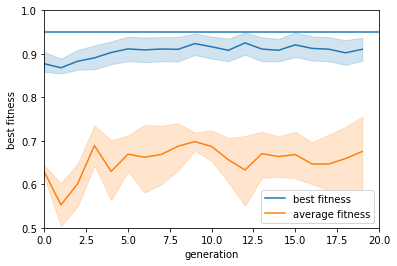

In [18]:
ax = sns.lineplot(data=data,x="generation",y="best fitness")
ax = sns.lineplot(data=data,x="generation",y="average fitness")
ax.set_xlim([0,20])
ax.set_ylim([0.5,1])
ax.axhline([0.95])
plt.legend(["best fitness","average fitness"])

(-400, 400)

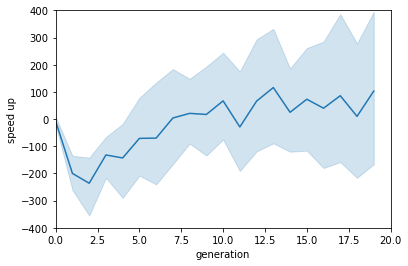

In [149]:
ax = sns.lineplot(data=wb_data,x="generation",y="speed up")
ax.set_xlim([0,20])
ax.set_ylim([-400,400])

(9, 50)

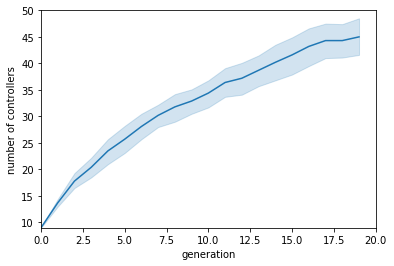

In [20]:
ax = sns.lineplot(data=data,x="generation",y="number of controllers")
ax.set_xlim([0,20])
ax.set_ylim([9,50])

In [131]:
exp_folder = "/home/leni/are-logs/mnipes_hard_bf/na/"
lines = []
for folder in os.listdir(exp_folder):
    neval, best_ids, best_fit, avg_fit, pop_size = load_all_fitnesses(exp_folder + folder + "/fitnesses.csv",0)
    print(len(best_fit))
    nbr_eval = load_number_of_eval_per_gen(exp_folder + folder,len(best_fit))
    theo_max = [2000]*len(nbr_eval)
    speedup = np.array(theo_max) - np.array(nbr_eval)
    nbr_ctrl_v = []
    gen_v = []
    
    for gen, bf, af, su in zip(range(len(best_fit)),best_fit,avg_fit,speedup):
        lines.append([gen,bf,af,su])
na_data = pd.DataFrame(data=lines,columns=["generation","best fitness","average fitness","speed up"])

20
20
20
20
20
20
20
20
20
20


In [132]:
lines = []
for folder in os.listdir(exp_folder):
    lines += load_ind_fitnesses(exp_folder + folder + "/fitnesses.csv",0)
fit_data = pd.DataFrame(data=lines,columns=["generation","individual","fitness"])


In [133]:
lines = []
sparsness = []
for folder in os.listdir(exp_folder):
    descriptors = load_descriptor(exp_folder + folder + "/MD_Cart_WDH.csv",8)
    sparsness += sparsness_per_gen(descriptors)
    for desc in descriptors:
        lines.append([desc[0],str(desc[1]),desc[6]*16,desc[7]*16,desc[8]*16])
        
sparsness_data = pd.DataFrame(data=sparsness,columns=["generation","sparsness"])
morph_data = pd.DataFrame(data=lines,columns=["gen","robot","wheel","sensor","joint"])
morph_data = pd.concat([morph_data,fit_data],axis=1,join="inner")

/home/leni/.local/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 76.6% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/leni/.local/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 62.2% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/leni/.local/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 74.4% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/leni/.local/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 47.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/leni/.local/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 31.4

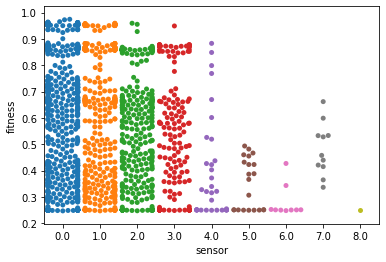

In [134]:
sns.swarmplot(data=morph_data,x="sensor",y="fitness")

/home/leni/.local/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 89.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/leni/.local/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 59.9% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/leni/.local/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 50.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/leni/.local/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 77.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/leni/.local/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 51.1

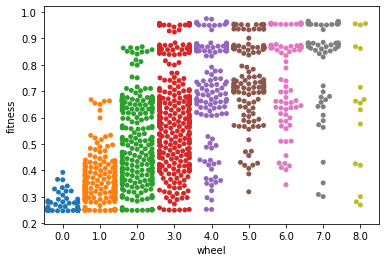

In [135]:
sns.swarmplot(data=morph_data,x="wheel",y="fitness")

/home/leni/.local/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 84.3% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/leni/.local/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 46.6% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/leni/.local/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 18.3% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


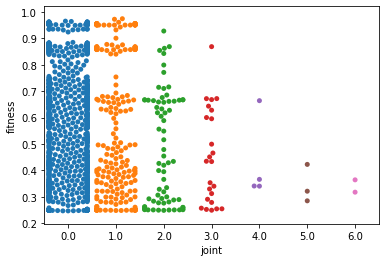

In [136]:
sns.swarmplot(data=morph_data,x="joint",y="fitness")

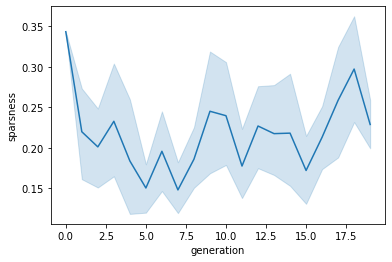

In [137]:
sns.lineplot(data=sparsness_data,x="generation",y="sparsness")

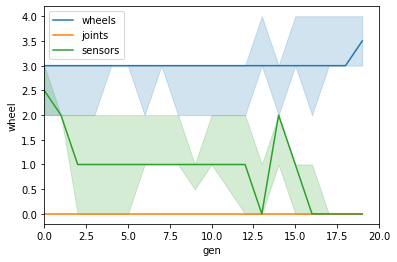

In [23]:
ax = sns.lineplot(data=morph_data,x="gen",y="wheel",estimator=np.median,ci=100)
sns.lineplot(data=morph_data,x="gen",y="joint",estimator=np.median,ci=100)
sns.lineplot(data=morph_data,x="gen",y="sensor",estimator=np.median,ci=100)
ax.set_xlim([0,20])
ax.legend(["wheels","joints","sensors"])

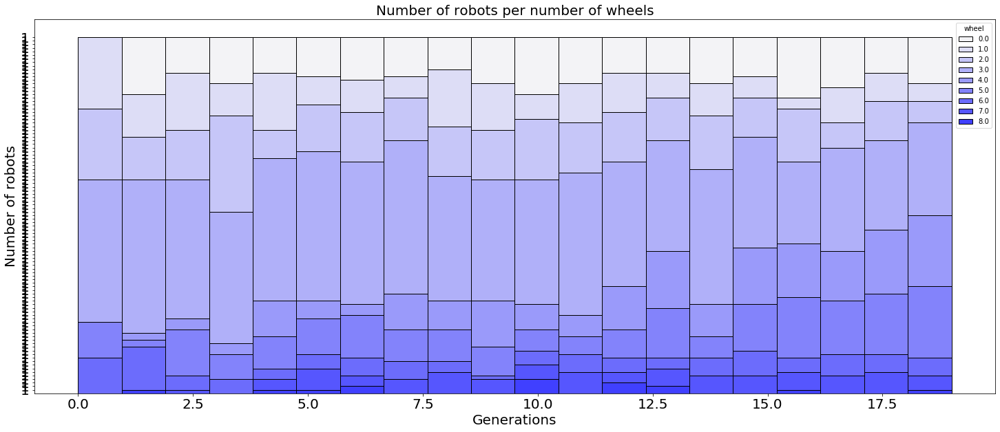

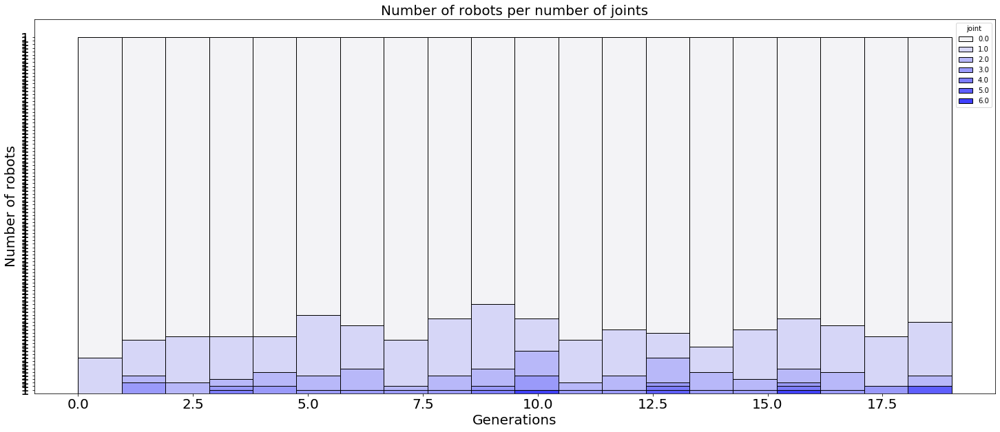

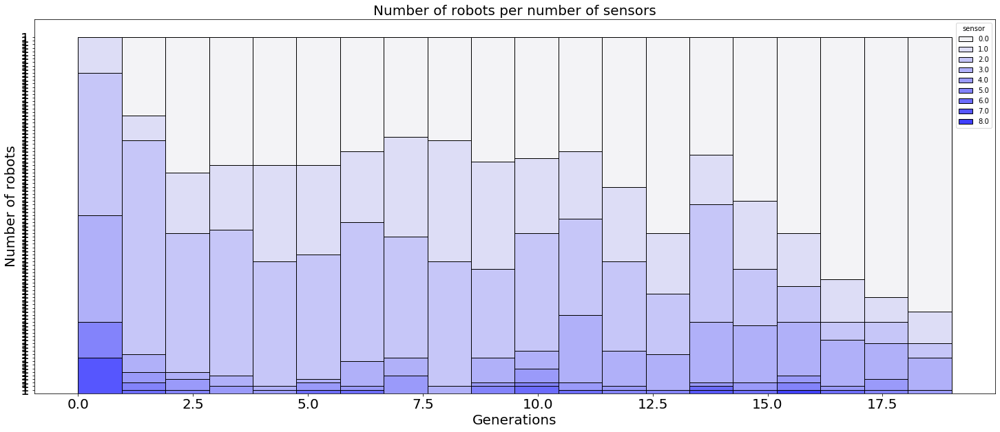

In [24]:
plot_hist_nbr_rob("Number of robots per number of wheels",morph_data,'wheel',20,100)
plot_hist_nbr_rob("Number of robots per number of joints",morph_data,'joint',20,100)
plot_hist_nbr_rob("Number of robots per number of sensors",morph_data,'sensor',20,100)

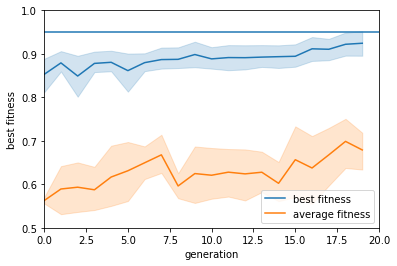

In [25]:
ax = sns.lineplot(data=na_data,x="generation",y="best fitness")
ax = sns.lineplot(data=na_data,x="generation",y="average fitness")
ax.set_xlim([0,20])
ax.set_ylim([0.5,1])
ax.axhline([0.95])
plt.legend(["best fitness","average fitness"])

(-400, 700)

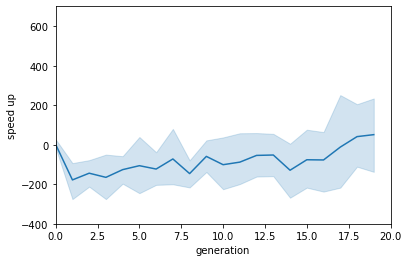

In [26]:
ax = sns.lineplot(data=na_data,x="generation",y="speed up")
ax.set_xlim([0,20])
ax.set_ylim([-400,700])

In [104]:
exp_folder = "/home/leni/are-logs/mnipes_hard_bf/cent/"
lines = []
for folder in os.listdir(exp_folder):
    neval, best_ids, best_fit, avg_fit, pop_size = load_all_fitnesses(exp_folder + folder + "/fitnesses.csv",0)
    print(len(best_fit))
    nbr_eval = load_number_of_eval_per_gen(exp_folder + folder,len(best_fit))
    theo_max = [1000]*len(nbr_eval)
    speedup = np.array(theo_max) - np.array(nbr_eval)
    nbr_ctrl_v = []
    gen_v = []
    for file in os.listdir(exp_folder + folder):
        if(file.split("_")[0] != "controller"):
            continue
        gen_v.append(float(file.split("archive")[-1]))
        ctrl_arch = load_controller_archive(exp_folder + folder + "/" + file)
        nbr_ctrl=0
        for i,line in ctrl_arch.iterrows():
            if(line["fitness"] > 0):
                nbr_ctrl+=1
        nbr_ctrl_v.append(nbr_ctrl)
    nbr_ctrl_v = [nbr_ctrl_v[i] for i in np.argsort(gen_v)]
    for gen, bf, af, su,nc in zip(range(len(best_fit)),best_fit,avg_fit,speedup,nbr_ctrl_v):
        lines.append([gen,bf,af,su,nc])
cent_data = pd.DataFrame(data=lines,columns=["generation","best fitness","average fitness","speed up","number of controllers"])

40
40
40
40
40
40
40
40
40
40


In [106]:
lines = []
for folder in os.listdir(exp_folder):
    lines += load_ind_fitnesses(exp_folder + folder + "/fitnesses.csv",0)
fit_data = pd.DataFrame(data=lines,columns=["generation","individual","fitness"])


      generation  individual   fitness
0              0           0  0.645930
1              0           1  0.376116
2              0           2  0.561976
3              0           3  0.858348
4              0           4  0.455103
...          ...         ...       ...
3995          39           5  0.250090
3996          39           6  0.856985
3997          39           7  0.523591
3998          39           8  0.384419
3999          39           9  0.560575

[4000 rows x 3 columns]


In [129]:
lines = []
sparsness = []
for folder in os.listdir(exp_folder):
    descriptors = load_descriptor(exp_folder + folder + "/MD_Cart_WDH.csv",8)
    sparsness += sparsness_per_gen(descriptors)
    for desc in descriptors:
        lines.append([desc[0],str(desc[1]),desc[6]*16,desc[7]*16,desc[8]*16])
        
sparsness_data = pd.DataFrame(data=sparsness,columns=["generation","sparsness"])
morph_data = pd.DataFrame(data=lines,columns=["gen","robot","wheel","sensor","joint"])
morph_data = pd.concat([morph_data,fit_data],axis=1,join="inner")

     generation  sparsness
0             0   0.343336
1             1   0.312714
2             2   0.138409
3             3   0.053749
4             4   0.158561
..          ...        ...
395          35   0.297502
396          36   0.172230
397          37   0.158410
398          38   0.262942
399          39   0.216627

[400 rows x 2 columns]


/home/leni/.local/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 89.3% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/leni/.local/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 69.3% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/leni/.local/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 74.6% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/leni/.local/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 52.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/leni/.local/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 28.6

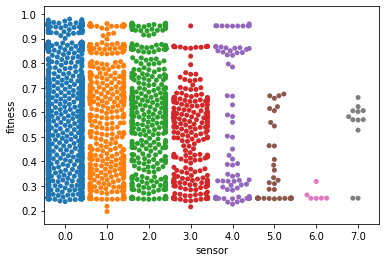

In [119]:
sns.swarmplot(data=morph_data,x="sensor",y="fitness")

/home/leni/.local/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 91.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/leni/.local/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 71.2% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/leni/.local/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 78.2% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/leni/.local/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 84.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/leni/.local/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 61.2

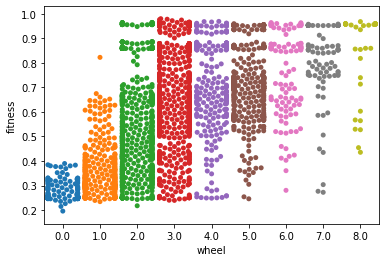

In [120]:
sns.swarmplot(data=morph_data,x="wheel",y="fitness")

/home/leni/.local/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 93.3% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/leni/.local/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 62.6% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/leni/.local/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 47.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/leni/.local/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 17.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/leni/.local/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 8.3%

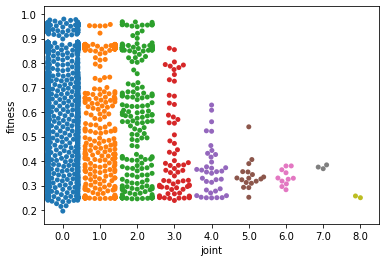

In [121]:
sns.swarmplot(data=morph_data,x="joint",y="fitness")

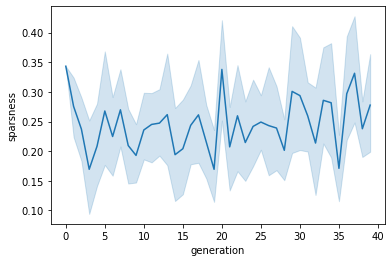

In [130]:
sns.lineplot(data=sparsness_data,x="generation",y="sparsness")

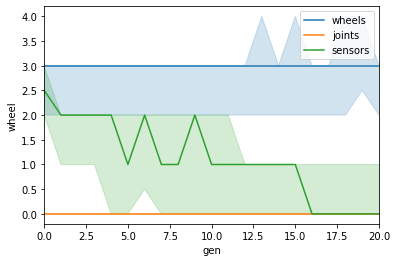

In [30]:
ax = sns.lineplot(data=morph_data,x="gen",y="wheel",estimator=np.median,ci=100)
sns.lineplot(data=morph_data,x="gen",y="joint",estimator=np.median,ci=100)
sns.lineplot(data=morph_data,x="gen",y="sensor",estimator=np.median,ci=100)
ax.set_xlim([0,20])
ax.legend(["wheels","joints","sensors"])

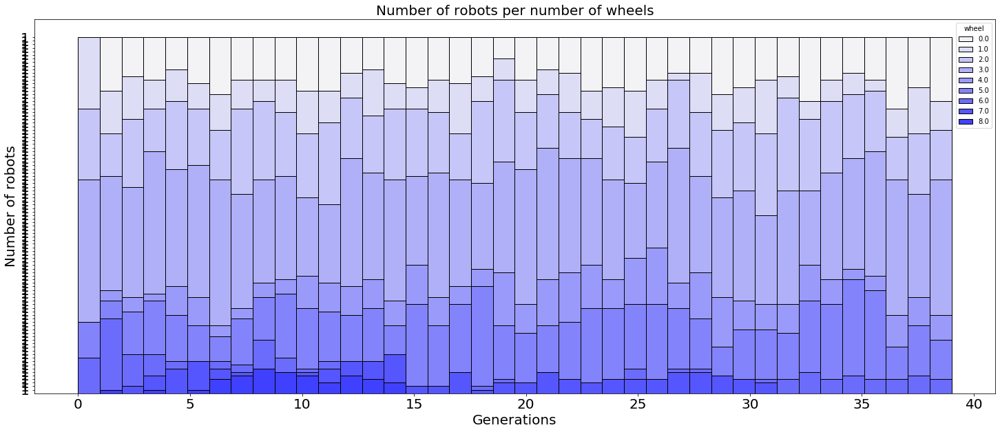

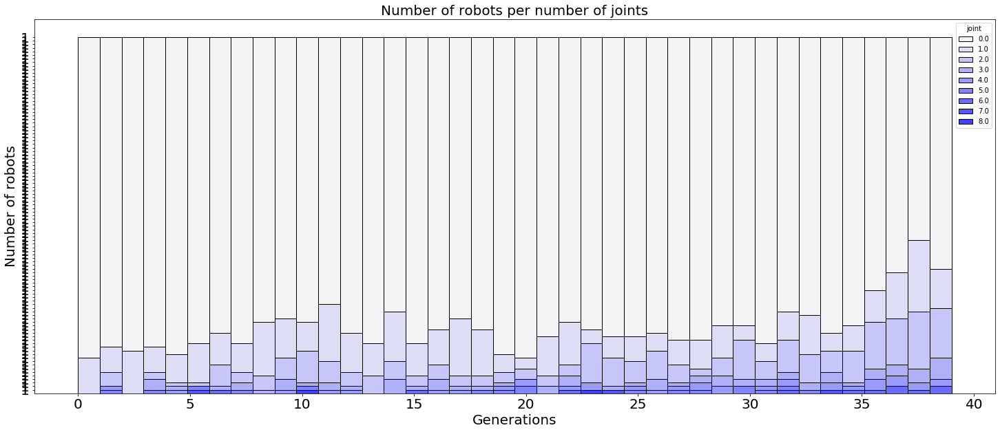

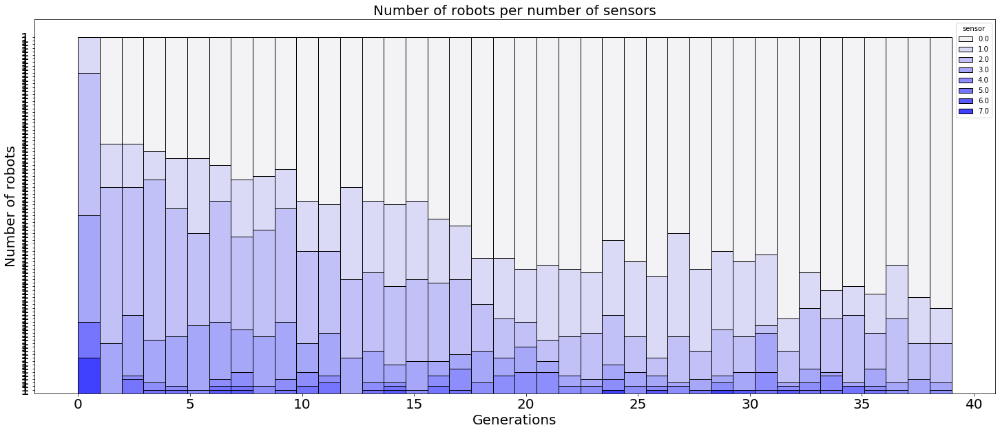

In [33]:
plot_hist_nbr_rob("Number of robots per number of wheels",morph_data,'wheel',40,100)
plot_hist_nbr_rob("Number of robots per number of joints",morph_data,'joint',40,100)
plot_hist_nbr_rob("Number of robots per number of sensors",morph_data,'sensor',40,100)

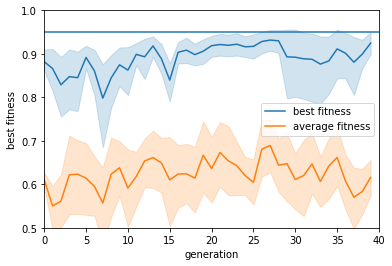

In [35]:
ax = sns.lineplot(data=cent_data,x="generation",y="best fitness")
ax = sns.lineplot(data=cent_data,x="generation",y="average fitness")
ax.set_xlim([0,40])
ax.set_ylim([0.5,1])
ax.axhline([0.95])
plt.legend(["best fitness","average fitness"])

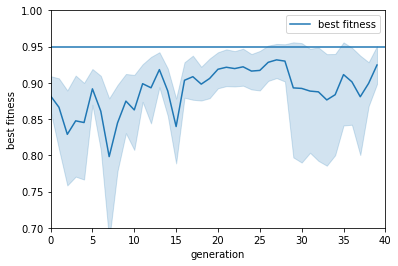

In [41]:
ax = sns.lineplot(data=cent_data,x="generation",y="best fitness")
ax.set_xlim([0,40])
ax.set_ylim([0.7,1])
ax.axhline([0.95])
plt.legend(["best fitness"])

(-200, 300)

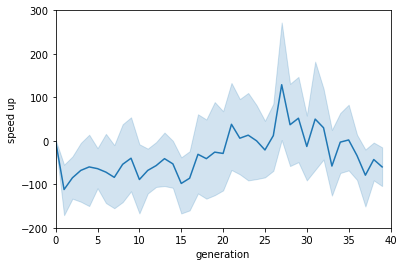

In [43]:
ax = sns.lineplot(data=cent_data,x="generation",y="speed up")
ax.set_xlim([0,40])
ax.set_ylim([-200,300])

(0, 40)

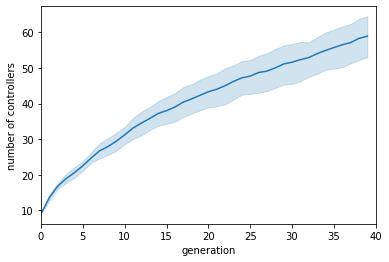

In [46]:
ax = sns.lineplot(data=cent_data,x="generation",y="number of controllers")
ax.set_xlim([0,40])
#ax.set_ylim([9,50])

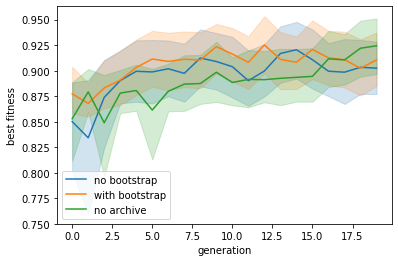

In [27]:
sns.lineplot(data=nb_data,x="generation",y="best fitness")
sns.lineplot(data=wb_data,x="generation",y="best fitness")
sns.lineplot(data=na_data,x="generation",y="best fitness")
plt.legend(["no bootstrap","with bootstrap","no archive"])

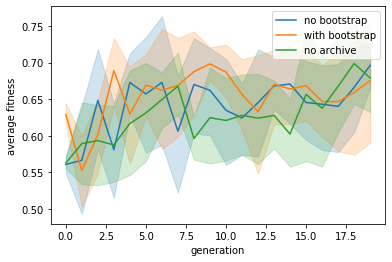

In [47]:
sns.lineplot(data=nb_data,x="generation",y="average fitness")
sns.lineplot(data=wb_data,x="generation",y="average fitness")
sns.lineplot(data=na_data,x="generation",y="average fitness")
plt.legend(["no bootstrap","with bootstrap","no archive"])

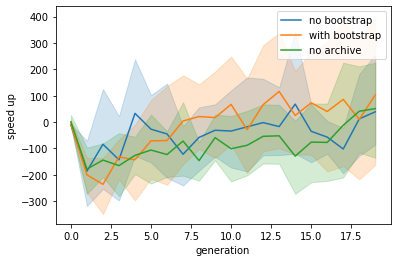

In [49]:
sns.lineplot(data=nb_data,x="generation",y="speed up")
sns.lineplot(data=wb_data,x="generation",y="speed up")
sns.lineplot(data=na_data,x="generation",y="speed up")
plt.legend(["no bootstrap","with bootstrap","no archive"])

In [167]:
exp_folder = "/home/leni/are-logs/mnipes_rooms_bf/200/"
lines = []
for folder in os.listdir(exp_folder):
    neval, best_ids, best_fit, avg_fit, pop_size = load_all_fitnesses(exp_folder + folder + "/fitnesses.csv",0)
    print(len(best_fit))
    nbr_eval = load_number_of_eval_per_gen(exp_folder + folder,len(best_fit))
    acc_nbr_eval = [0]
    for ne in nbr_eval:
        acc_nbr_eval.append(acc_nbr_eval[-1]+ne)
    nbr_ctrl_v = []
    gen_v = []
    for file in os.listdir(exp_folder + folder):
        if(file.split("_")[0] != "controller"):
            continue
        gen_v.append(float(file.split("archive")[-1]))
        ctrl_arch = load_controller_archive(exp_folder + folder + "/" + file)
        nbr_ctrl=0
        for i,line in ctrl_arch.iterrows():
            if(line["fitness"] > 0):
                nbr_ctrl+=1
        nbr_ctrl_v.append(nbr_ctrl)
    nbr_ctrl_v = [nbr_ctrl_v[i] for i in np.argsort(gen_v)]
    for gen, bf, af, nc,ane,ne in zip(range(len(best_fit)),best_fit,avg_fit,nbr_ctrl_v,acc_nbr_eval,nbr_eval):
        lines.append([gen,gen*2000,bf,af,ane,nc,ne])
dc_data = pd.DataFrame(data=lines,columns=["generation","max number of evaluations","best fitness","average fitness","evaluations","number of controllers","number of evaluations"])

30
30
30
30
12
30
13
30
17
19


In [54]:
print(dc_data)

     generation  best fitness  average fitness  evaluations  \
0             0      0.782802         0.739577            0   
1             1      0.781585         0.731529         2010   
2             2      0.756649         0.693618         4050   
3             3      0.813538         0.694608         6630   
4             4      0.868742         0.709128         9210   
..          ...           ...              ...          ...   
236          14      0.967040         0.847913        29530   
237          15      0.961807         0.740415        31280   
238          16      0.973181         0.817159        33350   
239          17      0.896620         0.740159        35410   
240          18      0.919076         0.736007        37780   

     number of controllers  number of evaluations  
0                        9                   2010  
1                       13                   2040  
2                       15                   2580  
3                       21         

In [168]:
lines = []
for folder in os.listdir(exp_folder):
    lines += load_ind_fitnesses(exp_folder + folder + "/fitnesses.csv",0)
fit_data = pd.DataFrame(data=lines,columns=["generation","individual","fitness"])


In [169]:
lines = []
sparsness = []
for folder in os.listdir(exp_folder):
    descriptors = load_descriptor(exp_folder + folder + "/MD_Cart_WDH.csv",8)
    sparsness += sparsness_per_gen(descriptors)
    for desc in descriptors:
        lines.append([desc[0],str(desc[1]),desc[6]*16,desc[7]*16,desc[8]*16])
print(len(lines))
sparsness_data = pd.DataFrame(data=sparsness,columns=["generation","sparsness"])
morph_data = pd.DataFrame(data=lines,columns=["gen","robot","wheel","sensor","joint"])
morph_data = pd.concat([morph_data,fit_data],axis=1,join="inner")

2410


In [170]:
for row in morph_data.iterrows():
    if(row[1]["fitness"] >= 0.95):
        print(row)

(50, gen                  5
robot              0.0
wheel                5
sensor               3
joint                0
generation           5
individual           0
fitness       0.953978
Name: 50, dtype: object)
(167, gen                 16
robot              7.0
wheel                3
sensor               0
joint                0
generation          16
individual           7
fitness       0.958144
Name: 167, dtype: object)
(170, gen                 17
robot              0.0
wheel                3
sensor               0
joint                0
generation          17
individual           0
fitness       0.955338
Name: 170, dtype: object)
(174, gen                 17
robot              4.0
wheel                3
sensor               0
joint                0
generation          17
individual           4
fitness       0.953837
Name: 174, dtype: object)
(177, gen                17
robot             7.0
wheel               3
sensor              0
joint               0
generation         17


Name: 1290, dtype: object)
(1293, gen                  9
robot              3.0
wheel                3
sensor               3
joint                0
generation           9
individual           3
fitness       0.963612
Name: 1293, dtype: object)
(1300, gen                 10
robot              0.0
wheel                3
sensor               3
joint                0
generation          10
individual           0
fitness       0.964675
Name: 1300, dtype: object)
(1305, gen                 10
robot              5.0
wheel                4
sensor               2
joint                0
generation          10
individual           5
fitness       0.966613
Name: 1305, dtype: object)
(1315, gen                 11
robot              5.0
wheel                4
sensor               2
joint                0
generation          11
individual           5
fitness       0.964665
Name: 1315, dtype: object)
(1342, gen                  2
robot              2.0
wheel                6
sensor               2
jo

/home/leni/.local/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 5.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


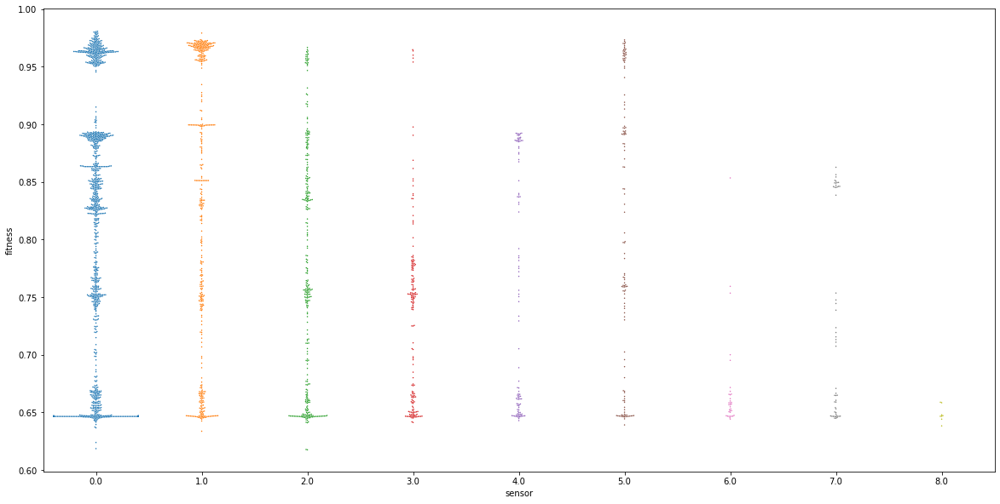

In [171]:
fig = plt.gcf()
fig.set_size_inches(20,10)
ax = sns.swarmplot(data=morph_data,x="sensor",y="fitness",size=1.5)
#ax.set_ylim(0.9,1.0)

/home/leni/.local/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 30.4% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


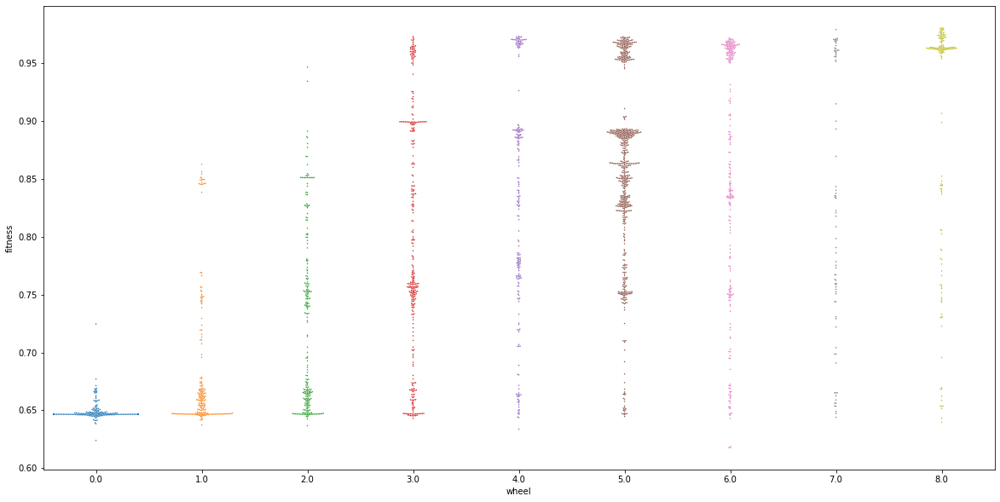

In [180]:
fig = plt.gcf()
fig.set_size_inches(20,10)
ax = sns.swarmplot(data=morph_data,x="wheel",y="fitness",size=1.5)
#ax.set_ylim(0.9,1.0)

/home/leni/.local/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 8.2% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


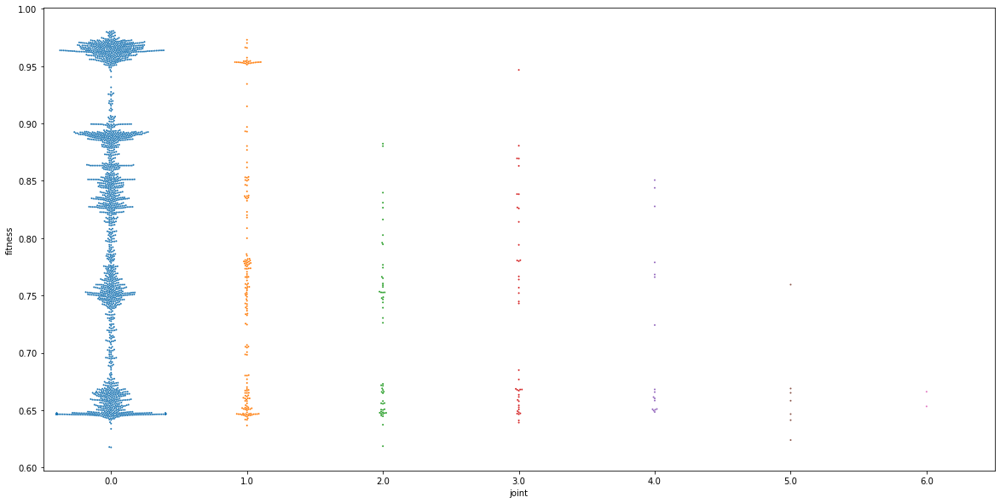

In [182]:
fig = plt.gcf()
fig.set_size_inches(20,10)
ax = sns.swarmplot(data=morph_data,x="joint",y="fitness",size=2)
#ax.set_ylim(0.9,1.0)

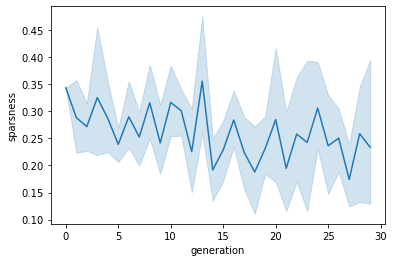

In [10]:
sns.lineplot(data=sparsness_data,x="generation",y="sparsness")

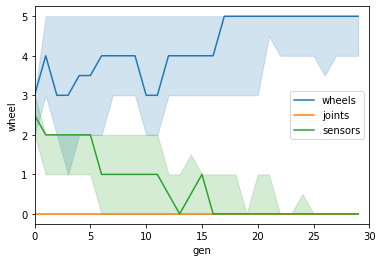

In [154]:
ax = sns.lineplot(data=morph_data,x="gen",y="wheel",estimator=np.median,ci=100)
sns.lineplot(data=morph_data,x="gen",y="joint",estimator=np.median,ci=100)
sns.lineplot(data=morph_data,x="gen",y="sensor",estimator=np.median,ci=100)
ax.set_xlim([0,30])
ax.legend(["wheels","joints","sensors"])

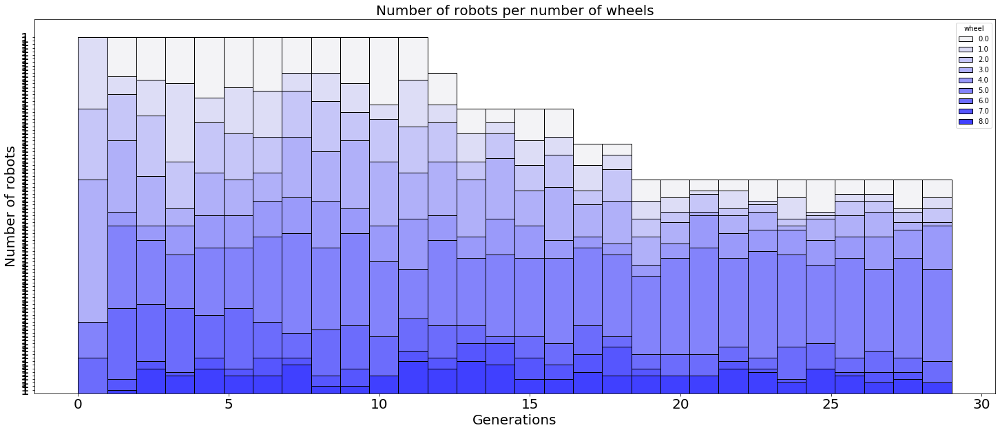

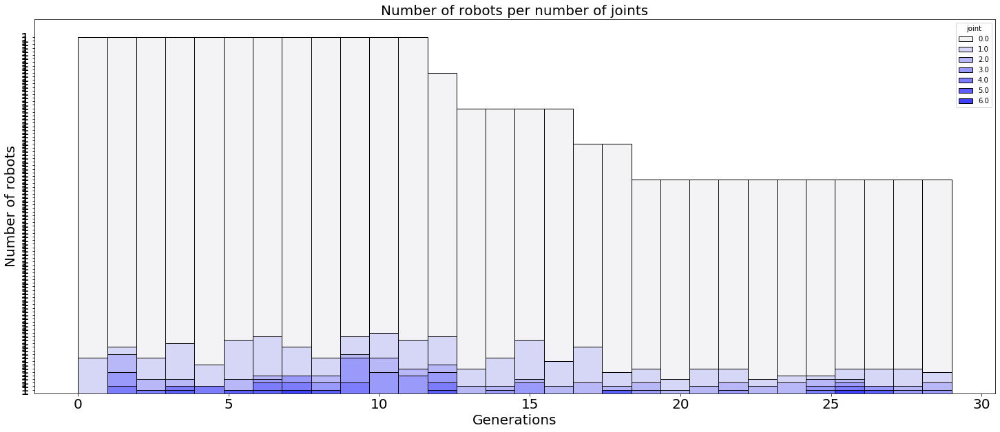

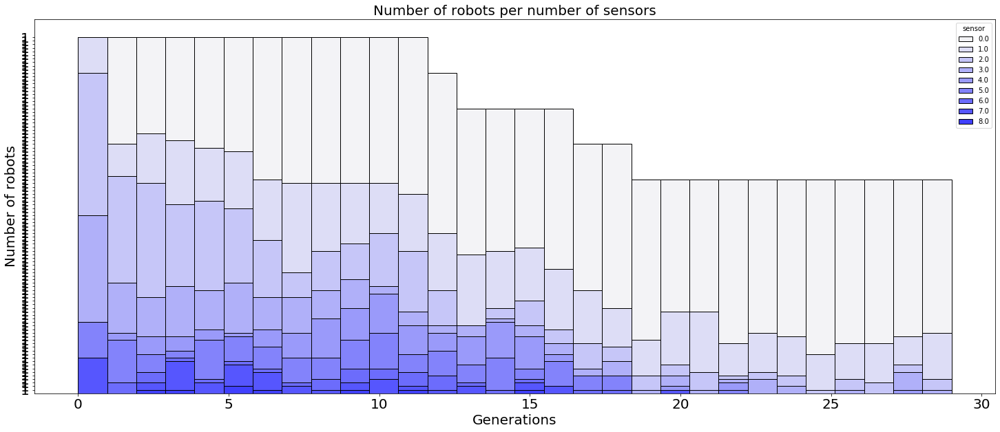

In [14]:
plot_hist_nbr_rob("Number of robots per number of wheels",morph_data,'wheel',30,100)
plot_hist_nbr_rob("Number of robots per number of joints",morph_data,'joint',30,100)
plot_hist_nbr_rob("Number of robots per number of sensors",morph_data,'sensor',30,100)

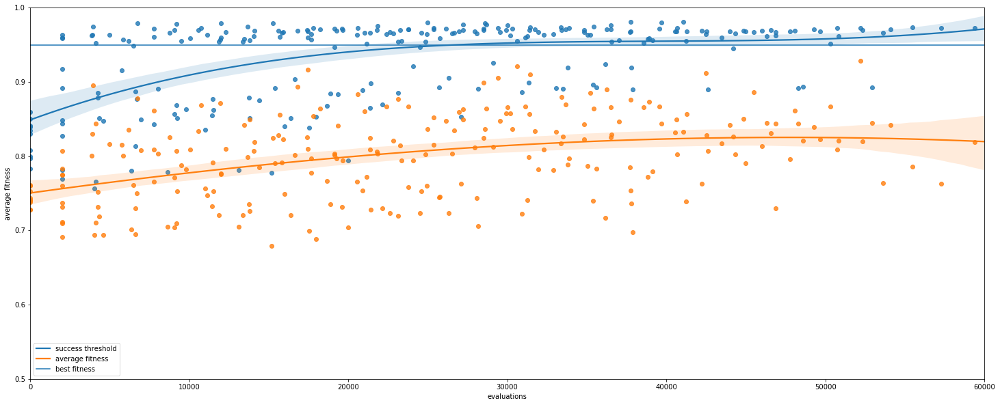

In [130]:
fig = plt.gcf()
fig.set_size_inches(25,10)
ax = sns.regplot(data=dc_data,x="evaluations",y="best fitness",order=3)
sns.regplot(data=dc_data,x="evaluations",y="average fitness",order=3)
ax.set_xlim([0,60000])
ax.set_ylim([0.5,1])
ax.axhline([0.95])
plt.legend(["success threshold","average fitness","best fitness"])

(0, 30)

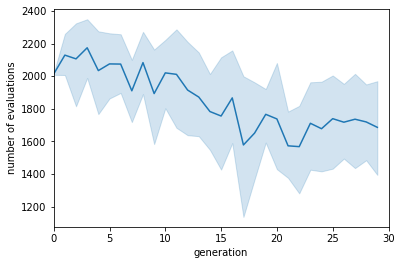

In [51]:
ax = sns.lineplot(data=dc_data,x="generation",y="number of evaluations")
ax.set_xlim([0,30])
#ax.set_ylim([-400,400])

(0, 30)

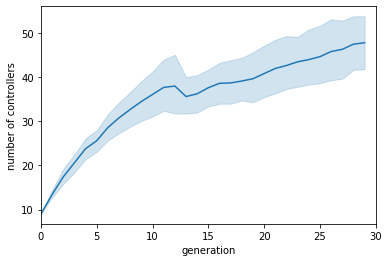

In [71]:
ax = sns.lineplot(data=dc_data,x="generation",y="number of controllers")
ax.set_xlim([0,30])
#ax.set_ylim([9,50])

In [97]:
exp_folder = "/home/leni/are-logs/mnipes_rooms_bf/150/"
lines = []
for folder in os.listdir(exp_folder):
    neval, best_ids, best_fit, avg_fit, pop_size = load_all_fitnesses(exp_folder + folder + "/fitnesses.csv",0)
    print(len(best_fit))
    nbr_eval = load_number_of_eval_per_gen(exp_folder + folder,len(best_fit))
    acc_nbr_eval = [0]
    for ne in nbr_eval:
        acc_nbr_eval.append(acc_nbr_eval[-1]+ne)
    nbr_ctrl_v = []
    gen_v = []
    for file in os.listdir(exp_folder + folder):
        if(file.split("_")[0] != "controller"):
            continue
        gen_v.append(float(file.split("archive")[-1]))
        ctrl_arch = load_controller_archive(exp_folder + folder + "/" + file)
        nbr_ctrl=0
        for i,line in ctrl_arch.iterrows():
            if(line["fitness"] > 0):
                nbr_ctrl+=1
        nbr_ctrl_v.append(nbr_ctrl)
    nbr_ctrl_v = [nbr_ctrl_v[i] for i in np.argsort(gen_v)]
    for gen, bf, af, nc,ane,ne in zip(range(len(best_fit)),best_fit,avg_fit,nbr_ctrl_v,acc_nbr_eval,nbr_eval):
        lines.append([gen,gen*1500,bf,af,ane,nc,ne])
cc_data = pd.DataFrame(data=lines,columns=["generation","max number of evaluations","best fitness","average fitness","evaluations","number of controllers","number of evaluations"])

30
30
30
30
30
30
30
30
30
20


In [24]:
lines = []
for folder in os.listdir(exp_folder):
    lines += load_ind_fitnesses(exp_folder + folder + "/fitnesses.csv",0)
fit_data = pd.DataFrame(data=lines,columns=["generation","individual","fitness"])


In [25]:
lines = []
sparsness = []
for folder in os.listdir(exp_folder):
    descriptors = load_descriptor(exp_folder + folder + "/MD_Cart_WDH.csv",8)
    sparsness += sparsness_per_gen(descriptors)
    for desc in descriptors:
        lines.append([desc[0],str(desc[1]),desc[6]*16,desc[7]*16,desc[8]*16])
        
sparsness_data = pd.DataFrame(data=sparsness,columns=["generation","sparsness"])
morph_data = pd.DataFrame(data=lines,columns=["gen","robot","wheel","sensor","joint"])
morph_data = pd.concat([morph_data,fit_data],axis=1,join="inner")

/home/leni/.local/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 83.2% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/leni/.local/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 69.2% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/leni/.local/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 73.6% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/leni/.local/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 64.6% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/leni/.local/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 51.0

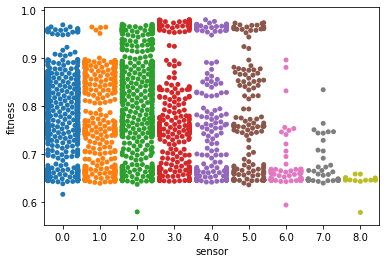

In [26]:
sns.swarmplot(data=morph_data,x="sensor",y="fitness")

/home/leni/.local/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 93.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/leni/.local/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 78.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/leni/.local/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 68.2% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/leni/.local/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 72.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/leni/.local/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 67.5

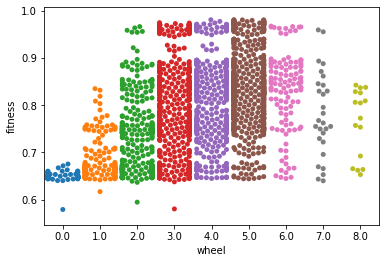

In [27]:
sns.swarmplot(data=morph_data,x="wheel",y="fitness")

/home/leni/.local/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 91.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/leni/.local/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 47.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/leni/.local/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 17.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


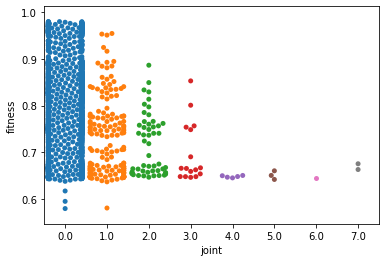

In [28]:
sns.swarmplot(data=morph_data,x="joint",y="fitness")

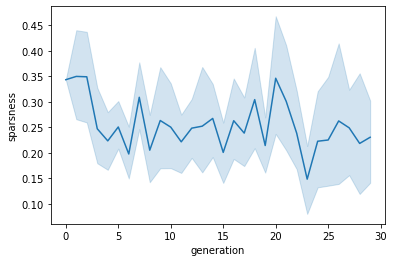

In [30]:
sns.lineplot(data=sparsness_data,x="generation",y="sparsness")

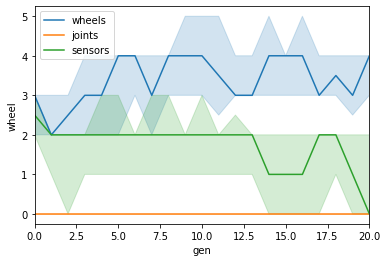

In [31]:
ax = sns.lineplot(data=morph_data,x="gen",y="wheel",estimator=np.median,ci=100)
sns.lineplot(data=morph_data,x="gen",y="joint",estimator=np.median,ci=100)
sns.lineplot(data=morph_data,x="gen",y="sensor",estimator=np.median,ci=100)
ax.set_xlim([0,20])
ax.legend(["wheels","joints","sensors"])

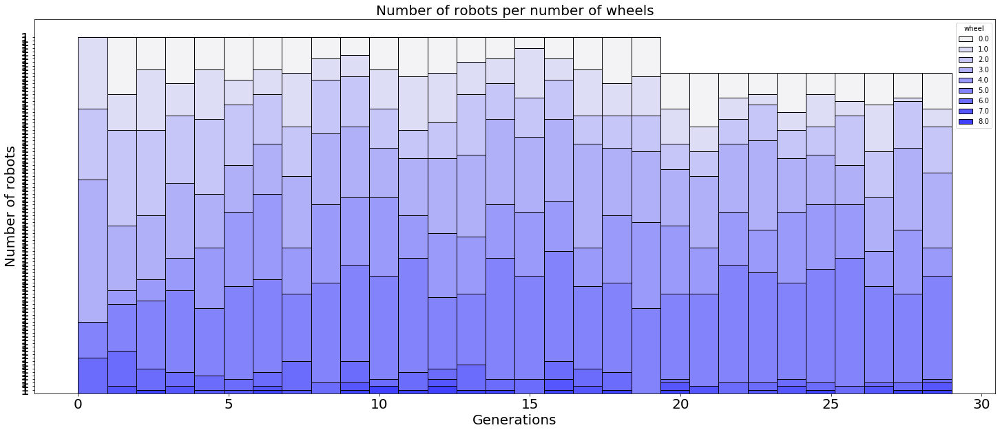

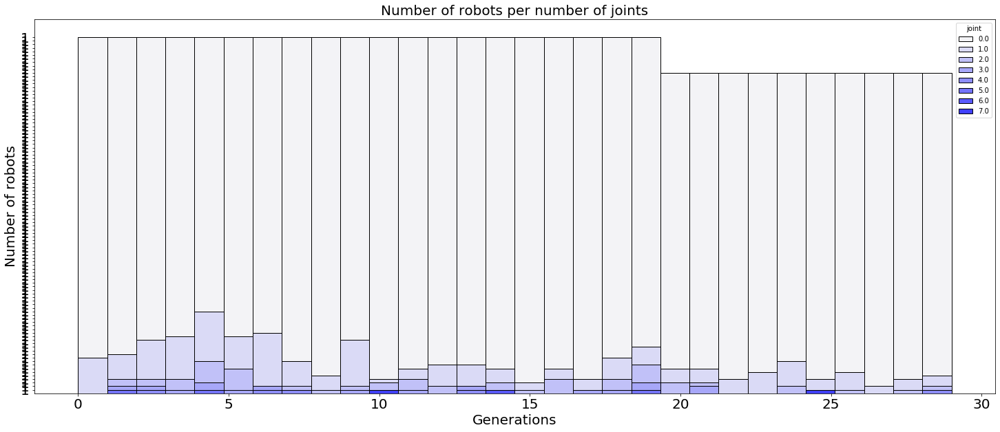

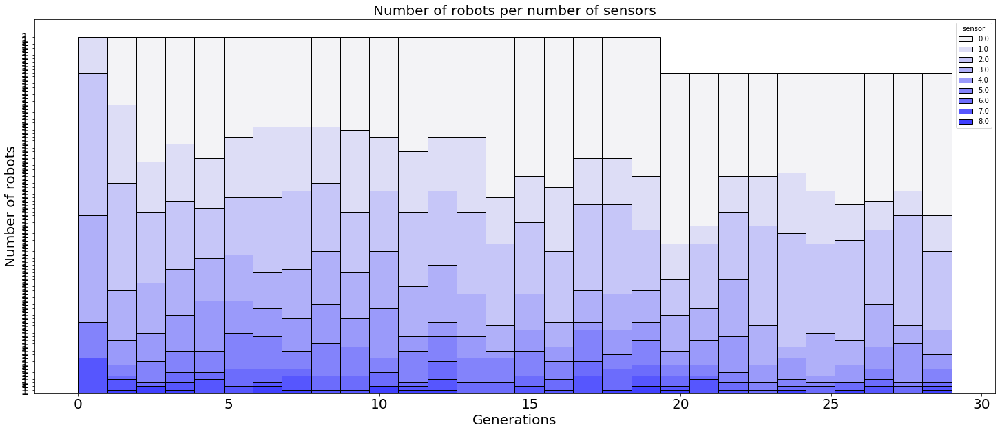

In [32]:
plot_hist_nbr_rob("Number of robots per number of wheels",morph_data,'wheel',30,100)
plot_hist_nbr_rob("Number of robots per number of joints",morph_data,'joint',30,100)
plot_hist_nbr_rob("Number of robots per number of sensors",morph_data,'sensor',30,100)

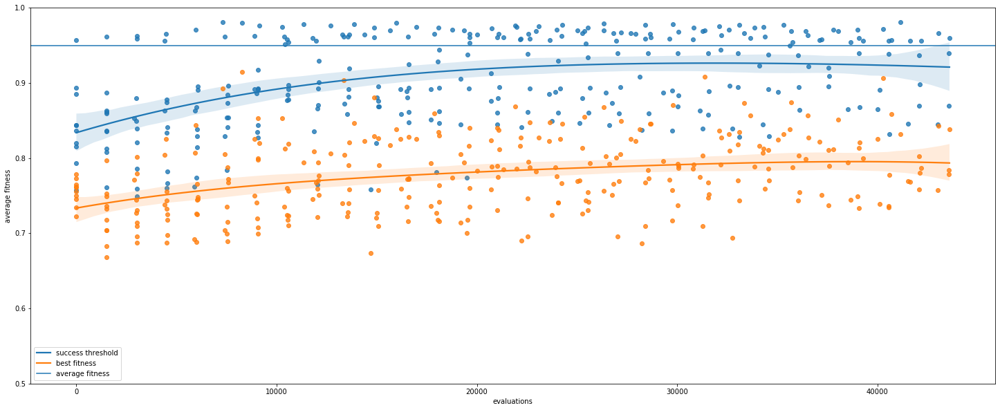

In [68]:
fig = plt.gcf()
fig.set_size_inches(25,10)
ax = sns.regplot(data=cc_data,x="evaluations",y="best fitness",order=4)
#sns.lineplot(data=dc_data,x="generation",y="best fitness")
ax = sns.regplot(data=cc_data,x="evaluations",y="average fitness",order=4)
#ax.set_xlim([0,30])
ax.set_ylim([0.5,1])
ax.axhline([0.95])
plt.legend(["success threshold","best fitness","average fitness"])

(0, 30)

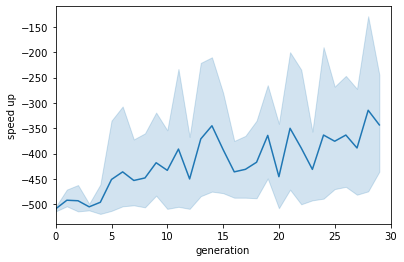

In [39]:
ax = sns.lineplot(data=cc_data,x="generation",y="speed up")
ax.set_xlim([0,30])
#ax.set_ylim([-400,400])

(0, 30)

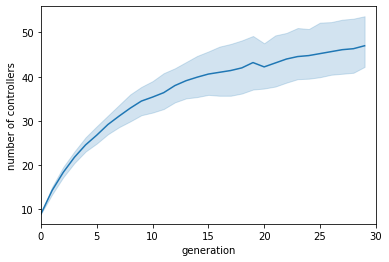

In [37]:
ax = sns.lineplot(data=cc_data,x="generation",y="number of controllers")
ax.set_xlim([0,30])
#ax.set_ylim([9,50])

In [98]:
exp_folder = "/home/leni/are-logs/mnipes_rooms_bf/100/"
lines = []
for folder in os.listdir(exp_folder):
    neval, best_ids, best_fit, avg_fit, pop_size = load_all_fitnesses(exp_folder + folder + "/fitnesses.csv",0)
    print(len(best_fit))
    nbr_eval = load_number_of_eval_per_gen(exp_folder + folder,len(best_fit))
    acc_nbr_eval = [0]
    for ne in nbr_eval:
        acc_nbr_eval.append(acc_nbr_eval[-1]+ne)
    nbr_ctrl_v = []
    gen_v = []
    for file in os.listdir(exp_folder + folder):
        if(file.split("_")[0] != "controller"):
            continue
        gen_v.append(float(file.split("archive")[-1]))
        ctrl_arch = load_controller_archive(exp_folder + folder + "/" + file)
        nbr_ctrl=0
        for i,line in ctrl_arch.iterrows():
            if(line["fitness"] > 0):
                nbr_ctrl+=1
        nbr_ctrl_v.append(nbr_ctrl)
    nbr_ctrl_v = [nbr_ctrl_v[i] for i in np.argsort(gen_v)]
    for gen, bf, af, nc,ane,ne in zip(range(len(best_fit)),best_fit,avg_fit,nbr_ctrl_v,acc_nbr_eval,nbr_eval):
        lines.append([gen,gen*1000,bf,af,ane,nc,ne])
cent_data = pd.DataFrame(data=lines,columns=["generation","max number of evaluations","best fitness","average fitness","evaluations","number of controllers","number of evaluations"])

40
40
40
26
40
40
33
40
40
40


In [77]:
lines = []
for folder in os.listdir(exp_folder):
    lines += load_ind_fitnesses(exp_folder + folder + "/fitnesses.csv",0)
fit_data = pd.DataFrame(data=lines,columns=["generation","individual","fitness"])


In [78]:
lines = []
sparsness = []
for folder in os.listdir(exp_folder):
    descriptors = load_descriptor(exp_folder + folder + "/MD_Cart_WDH.csv",8)
    sparsness += sparsness_per_gen(descriptors)
    for desc in descriptors:
        lines.append([desc[0],str(desc[1]),desc[6]*16,desc[7]*16,desc[8]*16])
        
sparsness_data = pd.DataFrame(data=sparsness,columns=["generation","sparsness"])
morph_data = pd.DataFrame(data=lines,columns=["gen","robot","wheel","sensor","joint"])
morph_data = pd.concat([morph_data,fit_data],axis=1,join="inner")

/home/leni/.local/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 92.4% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/leni/.local/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 78.9% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/leni/.local/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 66.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/leni/.local/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 60.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/leni/.local/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 63.6

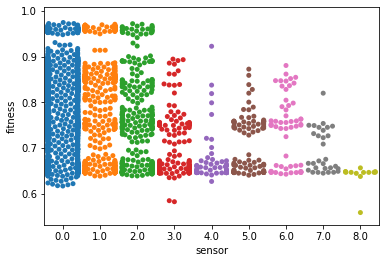

In [79]:
sns.swarmplot(data=morph_data,x="sensor",y="fitness")

/home/leni/.local/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 93.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/leni/.local/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 73.6% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/leni/.local/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 76.4% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/leni/.local/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 74.3% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/leni/.local/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 54.5

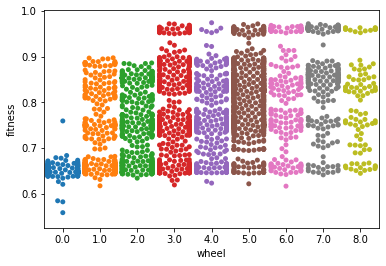

In [80]:
sns.swarmplot(data=morph_data,x="wheel",y="fitness")

/home/leni/.local/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 93.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/leni/.local/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 63.6% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/leni/.local/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 69.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/leni/.local/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 46.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/leni/.local/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 36.8

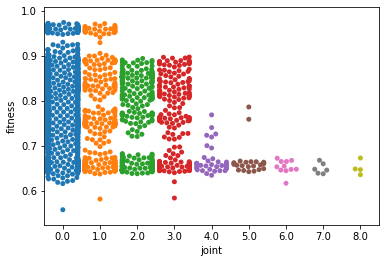

In [81]:
sns.swarmplot(data=morph_data,x="joint",y="fitness")

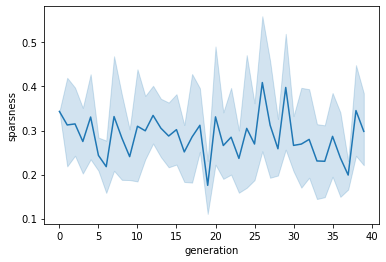

In [82]:
sns.lineplot(data=sparsness_data,x="generation",y="sparsness")

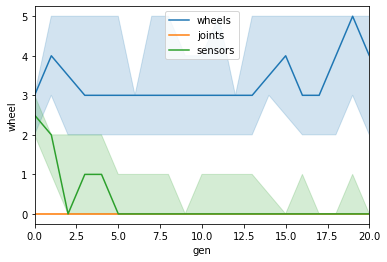

In [83]:
ax = sns.lineplot(data=morph_data,x="gen",y="wheel",estimator=np.median,ci=100)
sns.lineplot(data=morph_data,x="gen",y="joint",estimator=np.median,ci=100)
sns.lineplot(data=morph_data,x="gen",y="sensor",estimator=np.median,ci=100)
ax.set_xlim([0,20])
ax.legend(["wheels","joints","sensors"])

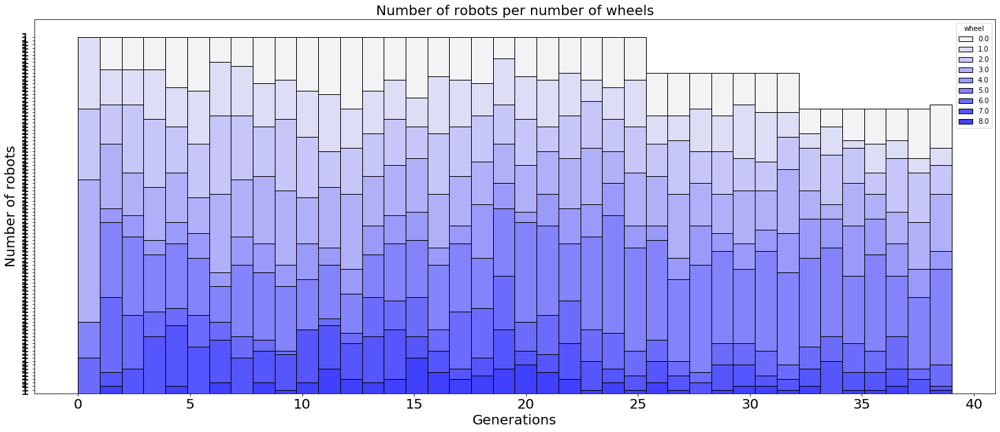

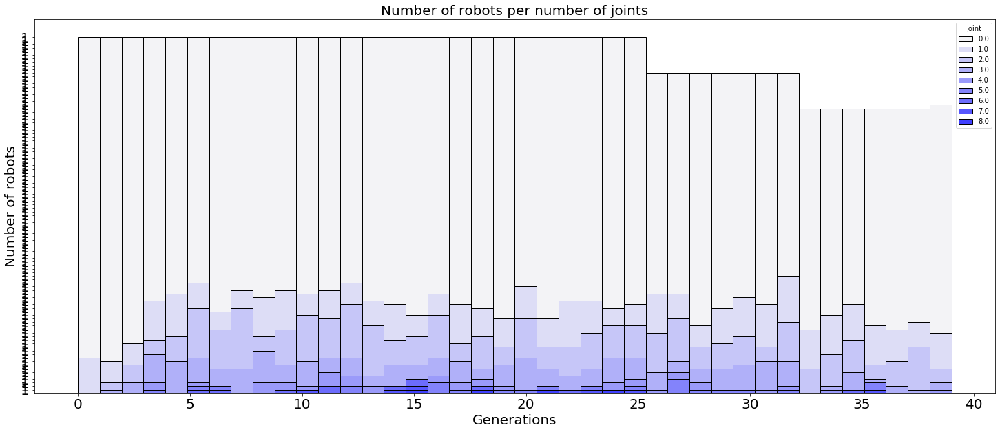

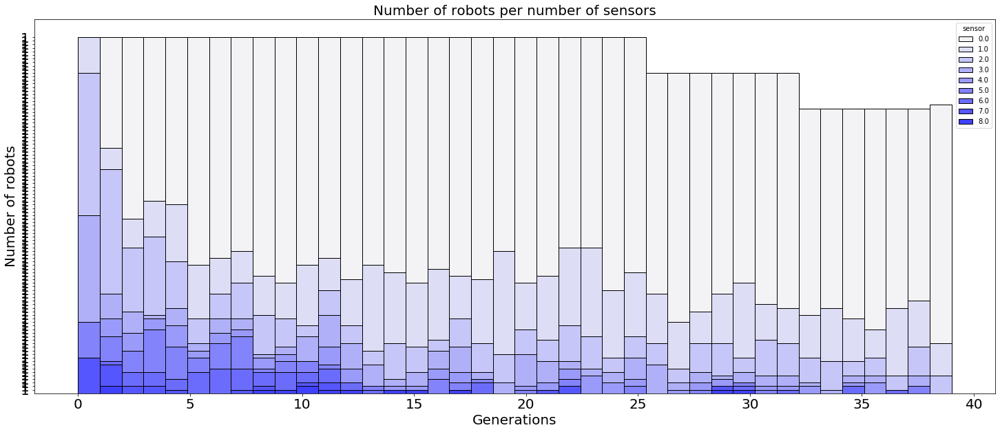

In [87]:
plot_hist_nbr_rob("Number of robots per number of wheels",morph_data,'wheel',40,100)
plot_hist_nbr_rob("Number of robots per number of joints",morph_data,'joint',40,100)
plot_hist_nbr_rob("Number of robots per number of sensors",morph_data,'sensor',40,100)

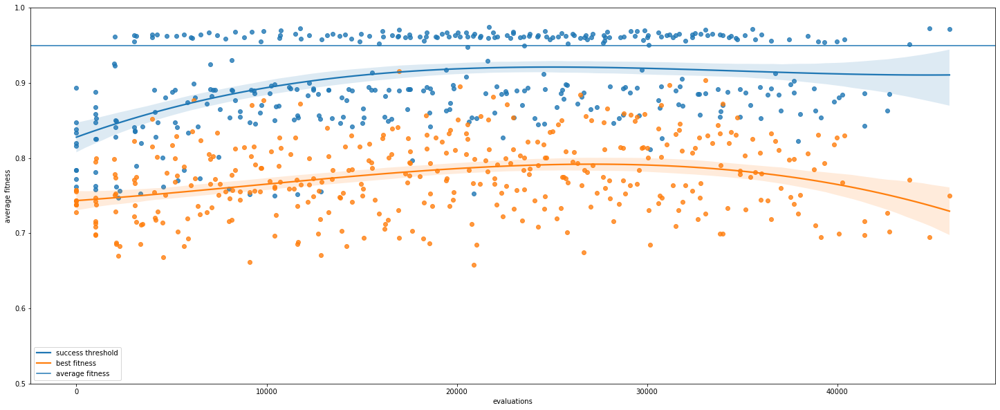

In [88]:
fig = plt.gcf()
fig.set_size_inches(25,10)
ax = sns.regplot(data=cent_data,x="evaluations",y="best fitness",order=3)
ax = sns.regplot(data=cent_data,x="evaluations",y="average fitness",order=3)
#ax.set_xlim([0,30])
ax.set_ylim([0.5,1])
ax.axhline([0.95])
plt.legend(["success threshold","best fitness","average fitness"])

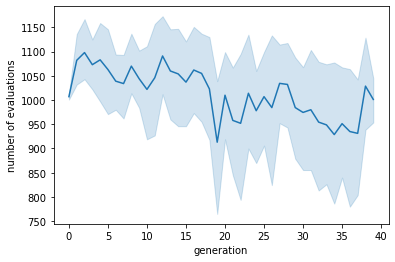

In [90]:
ax = sns.lineplot(data=cent_data,x="generation",y="number of evaluations")
#ax.set_xlim([0,30])
#ax.set_ylim([-400,400])

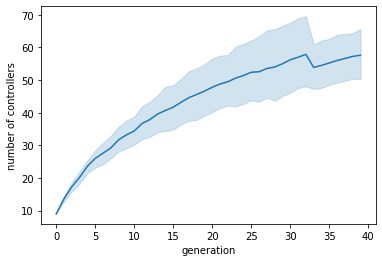

In [91]:
ax = sns.lineplot(data=cent_data,x="generation",y="number of controllers")
#ax.set_xlim([0,30])
#ax.set_ylim([9,50])

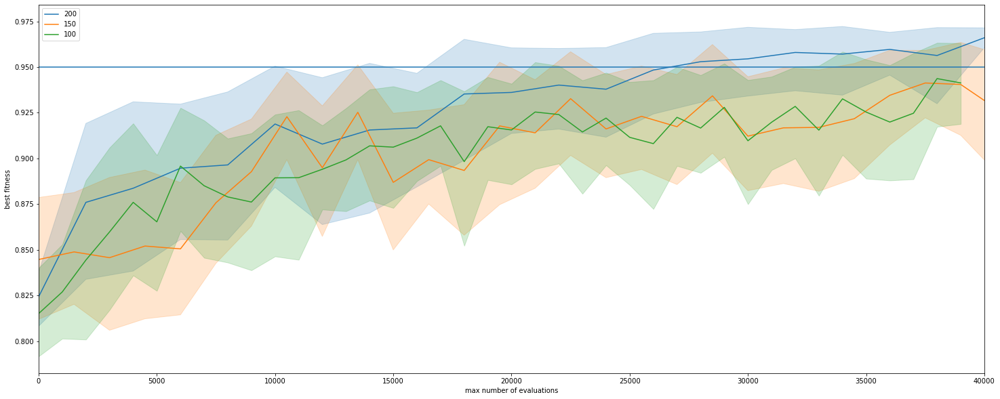

In [101]:
fig = plt.gcf()
fig.set_size_inches(25,10)
sns.lineplot(data=dc_data,x="max number of evaluations",y="best fitness")
sns.lineplot(data=cc_data,x="max number of evaluations",y="best fitness")
ax = sns.lineplot(data=cent_data,x="max number of evaluations",y="best fitness")
ax.axhline([0.95])
ax.set_xlim(0,40000)
plt.legend(["200","150","100"])

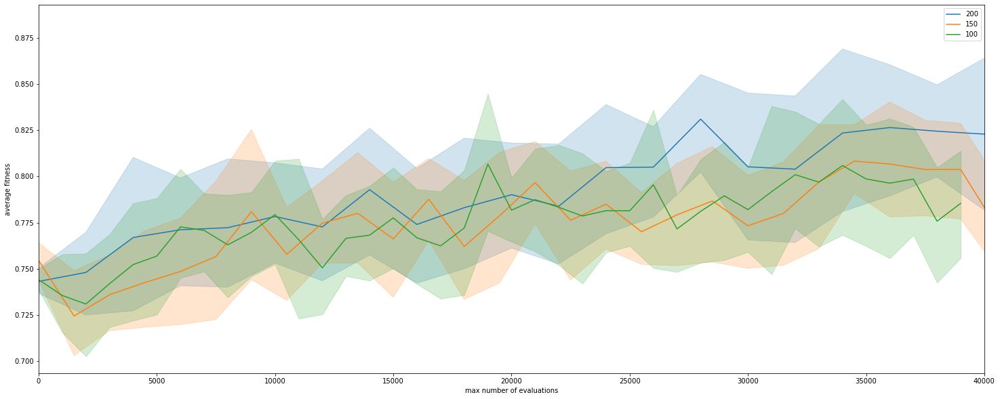

In [106]:
fig = plt.gcf()
fig.set_size_inches(25,10)
sns.lineplot(data=dc_data,x="max number of evaluations",y="average fitness")
sns.lineplot(data=cc_data,x="max number of evaluations",y="average fitness")
ax = sns.lineplot(data=cent_data,x="max number of evaluations",y="average fitness")
ax.set_xlim(0,40000)
plt.legend(["200","150","100"])

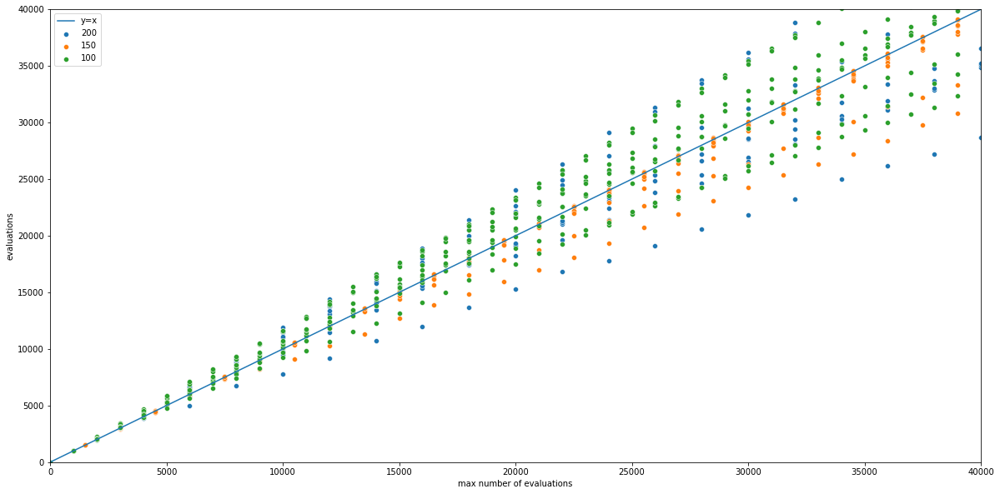

In [126]:
fig = plt.gcf()
fig.set_size_inches(20,10)
sns.scatterplot(data=dc_data,x="max number of evaluations",y="evaluations")
sns.scatterplot(data=cc_data,x="max number of evaluations",y="evaluations")
ax=sns.scatterplot(data=cent_data,x="max number of evaluations",y="evaluations")
plt.plot([x for x in range(40000)],[x for x in range(40000)])
ax.set_xlim(0,40000)
ax.set_ylim(0,40000)
plt.legend(["y=x","200","150","100"])

In [67]:
exp_folder = "/home/leni/are-logs/mnipes_steps_scratch/nos/"
lines = []
for folder in os.listdir(exp_folder):
    neval, best_ids, best_fit, avg_fit, pop_size = load_all_fitnesses(exp_folder + folder + "/fitnesses.csv",0)
    print(len(best_fit))
    nbr_eval = load_number_of_eval_per_gen(exp_folder + folder,len(best_fit))
    acc_nbr_eval = [0]
    for ne in nbr_eval:
        acc_nbr_eval.append(acc_nbr_eval[-1]+ne)
    nbr_ctrl_v = []
    gen_v = []
    for file in os.listdir(exp_folder + folder):
        if(file.split("_")[0] != "controller"):
            continue
        gen_v.append(float(file.split("archive")[-1]))
        ctrl_arch = load_controller_archive(exp_folder + folder + "/" + file)
        nbr_ctrl=0
        for i,line in ctrl_arch.iterrows():
            if(line["fitness"] > 0):
                nbr_ctrl+=1
        nbr_ctrl_v.append(nbr_ctrl)
    nbr_ctrl_v = [nbr_ctrl_v[i] for i in np.argsort(gen_v)]
    print(acc_nbr_eval[-1])
    for gen, bf, af, nc,ane,ne in zip(range(len(best_fit)),best_fit,avg_fit,nbr_ctrl_v,acc_nbr_eval,nbr_eval):
        lines.append([gen,gen*4000,bf,af,ane,nc,ne])
nos_data = pd.DataFrame(data=lines,columns=["generation","max number of evaluations","best fitness","average fitness","evaluations","number of controllers","number of evaluations"])

20
54900
20
54680
20
66500
20
66680
20
54390


In [68]:
lines = []
for folder in os.listdir(exp_folder):
    lines += load_ind_fitnesses(exp_folder + folder + "/fitnesses.csv",0)
fit_data = pd.DataFrame(data=lines,columns=["generation","individual","fitness"])


In [69]:
lines = []
sparsness = []
for folder in os.listdir(exp_folder):
    descriptors = load_descriptor(exp_folder + folder + "/MD_Cart_WDH.csv",8)
    sparsness += sparsness_per_gen(descriptors,20)
    for desc in descriptors:
        lines.append([desc[0],str(desc[1]),desc[6]*16,desc[7]*16,desc[8]*16])
print(len(lines))
nos_sparsness_data = pd.DataFrame(data=sparsness,columns=["generation","sparsness"])
morph_data = pd.DataFrame(data=lines,columns=["gen","robot","wheel","sensor","joint"])
morph_data = pd.concat([morph_data,fit_data],axis=1,join="inner")

2000


/home/leni/.local/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 7.9% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


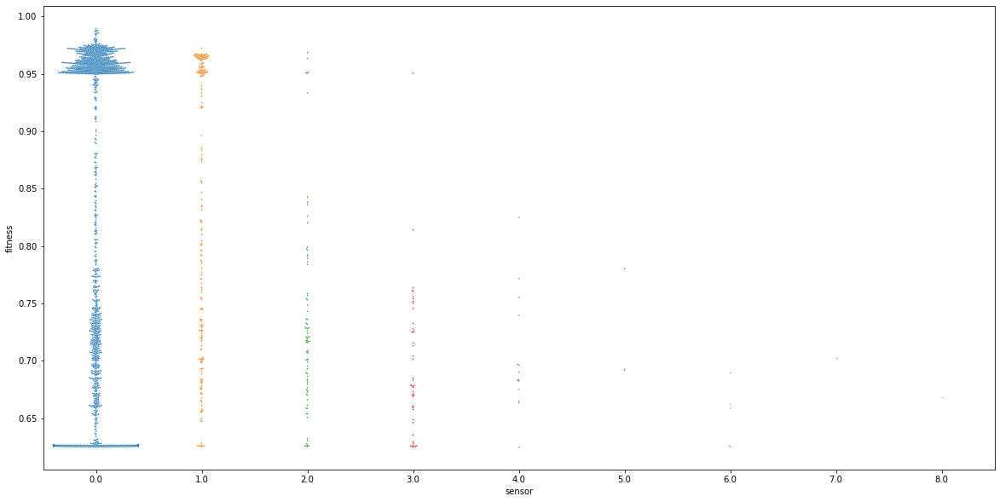

In [6]:
fig = plt.gcf()
fig.set_size_inches(20,10)
ax = sns.swarmplot(data=morph_data,x="sensor",y="fitness",size=1.5)
#ax.set_ylim(0.9,1.0)

/home/leni/.local/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 19.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


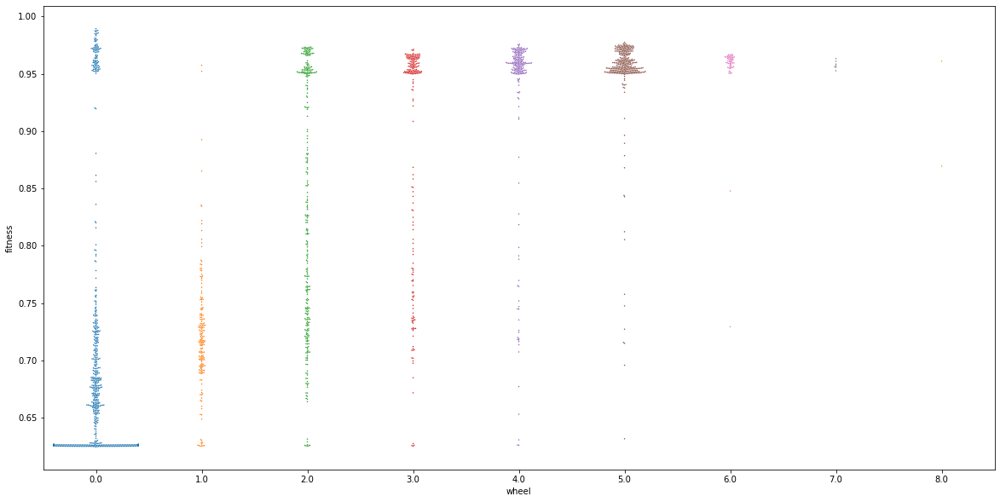

In [7]:
fig = plt.gcf()
fig.set_size_inches(20,10)
ax = sns.swarmplot(data=morph_data,x="wheel",y="fitness",size=1.5)
#ax.set_ylim(0.9,1.0)

/home/leni/.local/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 15.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


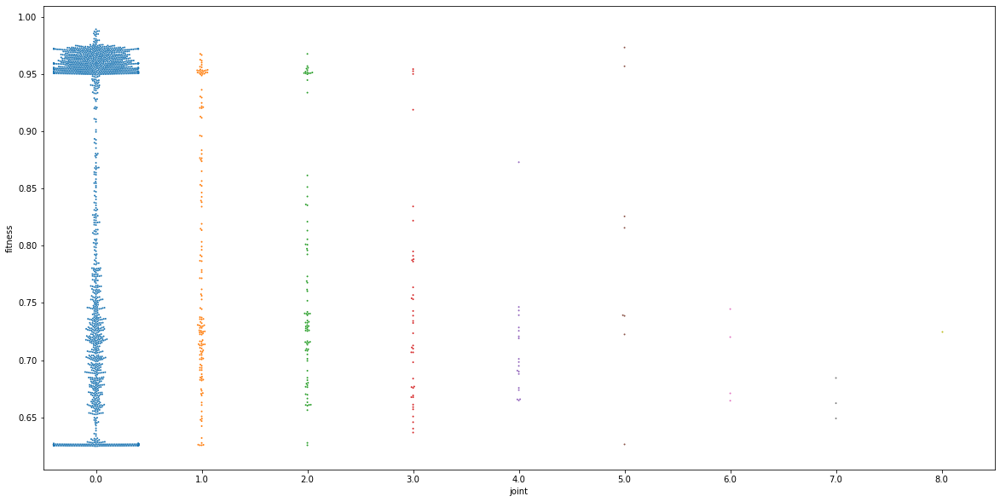

In [8]:
fig = plt.gcf()
fig.set_size_inches(20,10)
ax = sns.swarmplot(data=morph_data,x="joint",y="fitness",size=2)
#ax.set_ylim(0.9,1.0)

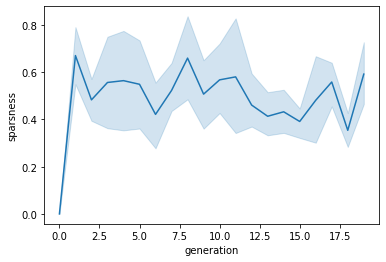

In [70]:
sns.lineplot(data=nos_sparsness_data,x="generation",y="sparsness")

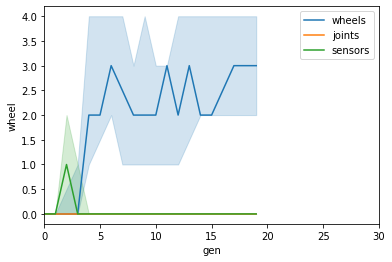

In [10]:
ax = sns.lineplot(data=morph_data,x="gen",y="wheel",estimator=np.median,ci=100)
sns.lineplot(data=morph_data,x="gen",y="joint",estimator=np.median,ci=100)
sns.lineplot(data=morph_data,x="gen",y="sensor",estimator=np.median,ci=100)
ax.set_xlim([0,30])
ax.legend(["wheels","joints","sensors"])

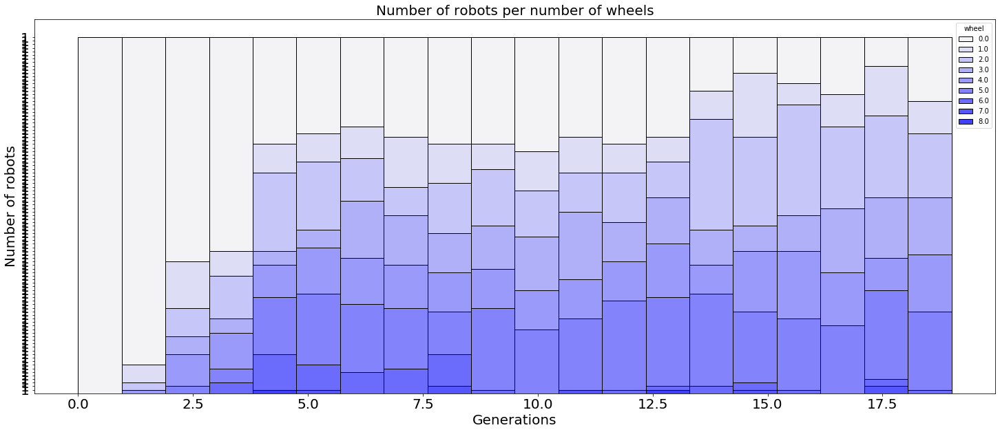

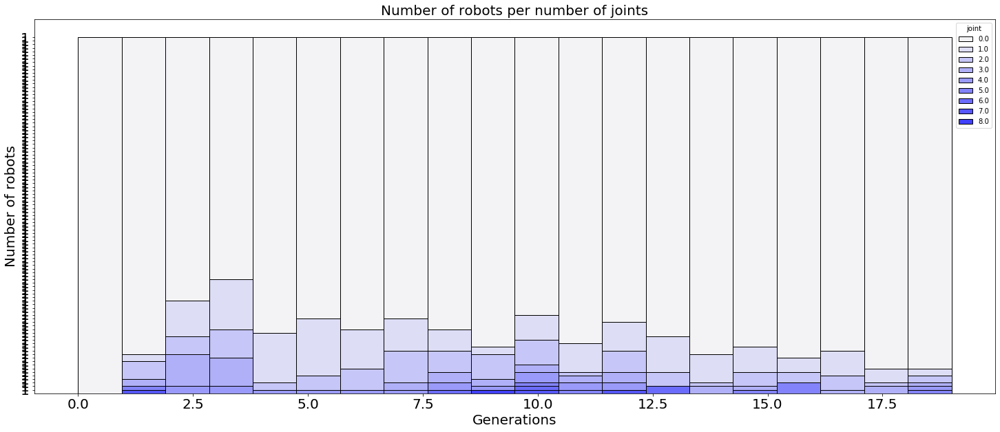

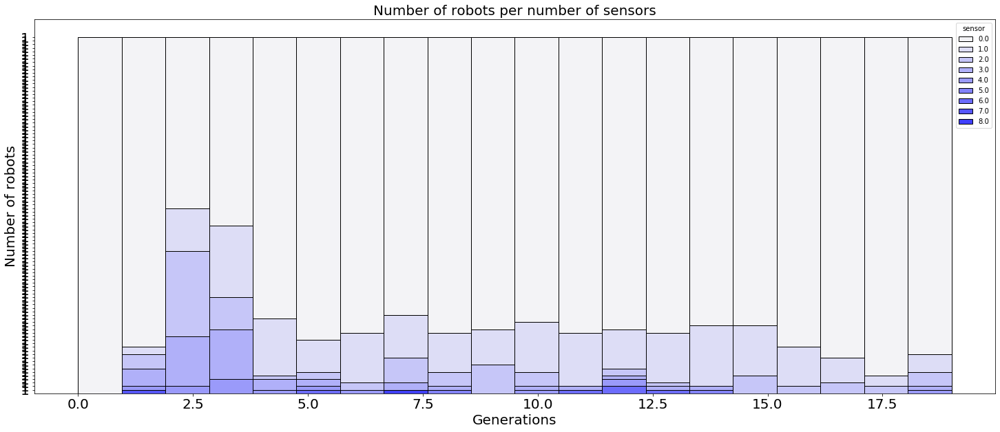

In [12]:
plot_hist_nbr_rob("Number of robots per number of wheels",morph_data,'wheel',20,100)
plot_hist_nbr_rob("Number of robots per number of joints",morph_data,'joint',20,100)
plot_hist_nbr_rob("Number of robots per number of sensors",morph_data,'sensor',20,100)

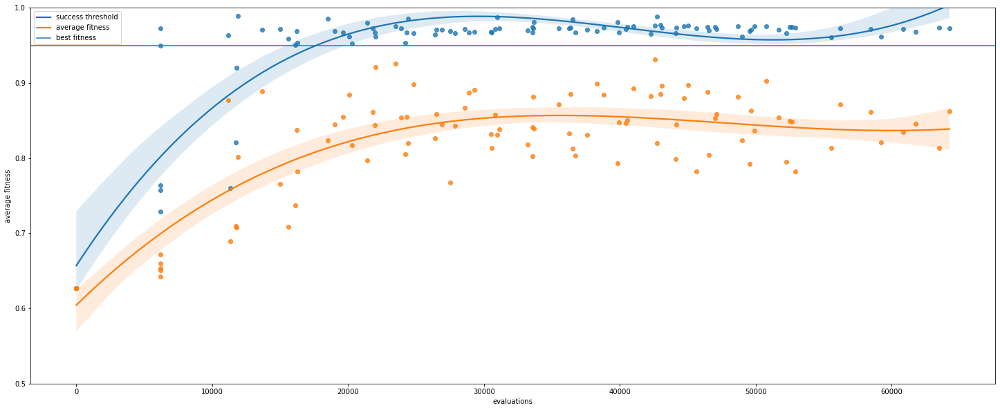

In [38]:
fig = plt.gcf()
fig.set_size_inches(25,10)
ax = sns.regplot(data=nos_data,x="evaluations",y="best fitness",order=3)
sns.regplot(data=nos_data,x="evaluations",y="average fitness",order=3)
#ax.set_xlim([0,60000])
ax.set_ylim([0.5,1])
ax.axhline([0.95])
plt.legend(["success threshold","average fitness","best fitness"])

(0, 20)

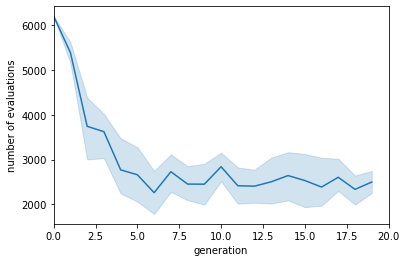

In [15]:
ax = sns.lineplot(data=nos_data,x="generation",y="number of evaluations")
ax.set_xlim([0,20])
#ax.set_ylim([-400,400])

(0, 20)

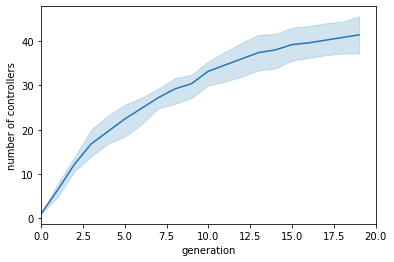

In [19]:
ax = sns.lineplot(data=nos_data,x="generation",y="number of controllers")
ax.set_xlim([0,20])
#ax.set_ylim([9,50])

In [71]:
exp_folder = "/home/leni/are-logs/mnipes_steps_scratch/seg/"
lines = []
for folder in os.listdir(exp_folder):
    neval, best_ids, best_fit, avg_fit, pop_size = load_all_fitnesses(exp_folder + folder + "/fitnesses.csv",0)
    print(len(best_fit))
    nbr_eval = load_number_of_eval_per_gen(exp_folder + folder,len(best_fit))
    acc_nbr_eval = [0]
    for ne in nbr_eval:
        acc_nbr_eval.append(acc_nbr_eval[-1]+ne)
    nbr_ctrl_v = []
    gen_v = []
    for file in os.listdir(exp_folder + folder):
        if(file.split("_")[0] != "controller"):
            continue
        gen_v.append(float(file.split("archive")[-1]))
        ctrl_arch = load_controller_archive(exp_folder + folder + "/" + file)
        nbr_ctrl=0
        for i,line in ctrl_arch.iterrows():
            if(line["fitness"] > 0):
                nbr_ctrl+=1
        nbr_ctrl_v.append(nbr_ctrl)
    nbr_ctrl_v = [nbr_ctrl_v[i] for i in np.argsort(gen_v)]
    print(acc_nbr_eval[-1])

    for gen, bf, af, nc,ane,ne in zip(range(len(best_fit)),best_fit,avg_fit,nbr_ctrl_v,acc_nbr_eval,nbr_eval):
        lines.append([gen,gen*4000,bf,af,ane,nc,ne])
seg_data = pd.DataFrame(data=lines,columns=["generation","max number of evaluations","best fitness","average fitness","evaluations","number of controllers","number of evaluations"])

20
64320
20
41260
20
55860
20
36690
20
46200


In [72]:
lines = []
for folder in os.listdir(exp_folder):
    lines += load_ind_fitnesses(exp_folder + folder + "/fitnesses.csv",0)
fit_data = pd.DataFrame(data=lines,columns=["generation","individual","fitness"])


In [73]:
lines = []
sparsness = []
for folder in os.listdir(exp_folder):
    descriptors = load_descriptor(exp_folder + folder + "/MD_Cart_WDH.csv",8)
    sparsness += sparsness_per_gen(descriptors,20)
    for desc in descriptors:
        lines.append([desc[0],str(desc[1]),desc[6]*16,desc[7]*16,desc[8]*16])
print(len(lines))
seg_sparsness_data = pd.DataFrame(data=sparsness,columns=["generation","sparsness"])
morph_data = pd.DataFrame(data=lines,columns=["gen","robot","wheel","sensor","joint"])
morph_data = pd.concat([morph_data,fit_data],axis=1,join="inner")

2000


/home/leni/.local/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 46.3% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


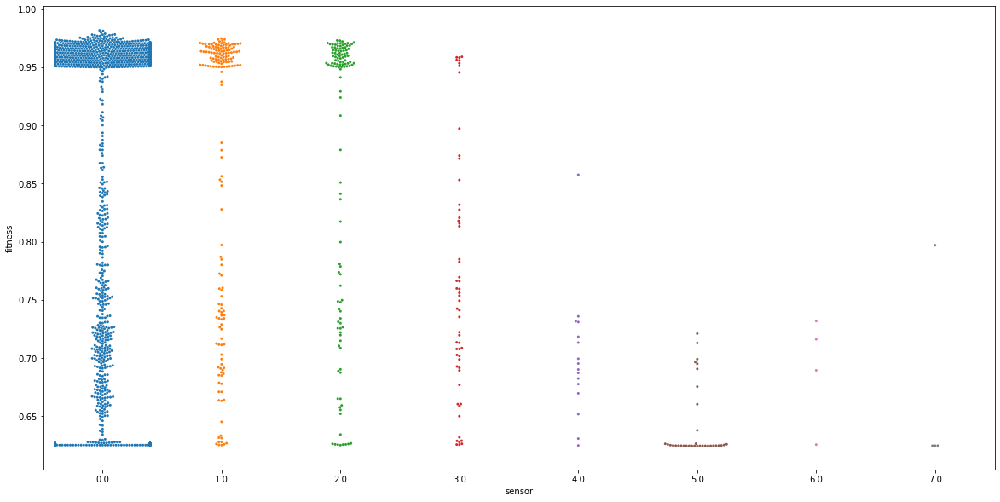

In [82]:
fig = plt.gcf()
fig.set_size_inches(20,10)
ax = sns.swarmplot(data=morph_data,x="sensor",y="fitness",size=3)
#ax.set_ylim(0.9,1.0)

/home/leni/.local/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 53.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/leni/.local/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 47.9% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


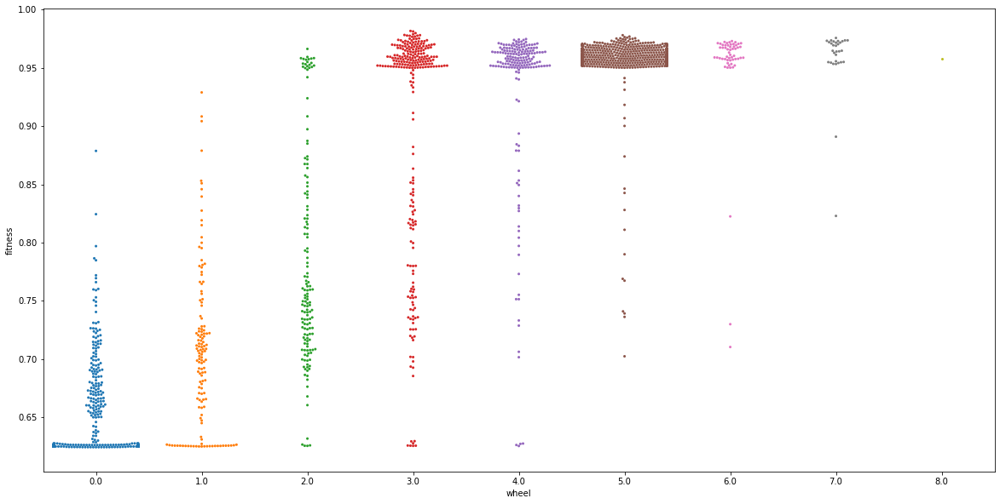

In [81]:
fig = plt.gcf()
fig.set_size_inches(20,10)
ax = sns.swarmplot(data=morph_data,x="wheel",y="fitness",size=3)
#ax.set_ylim(0.9,1.0)

/home/leni/.local/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 51.9% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


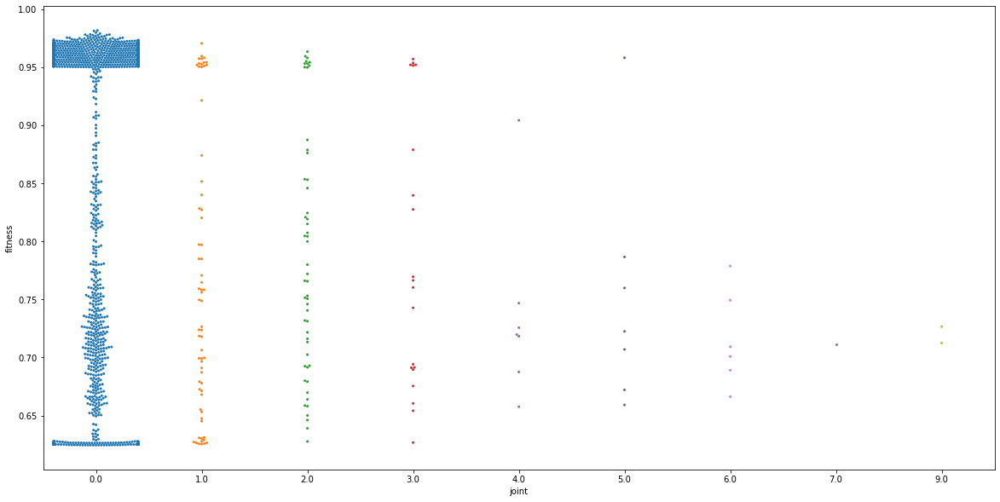

In [80]:
fig = plt.gcf()
fig.set_size_inches(20,10)
ax = sns.swarmplot(data=morph_data,x="joint",y="fitness",size=3)
#ax.set_ylim(0.9,1.0)

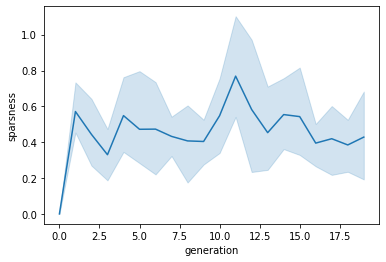

In [74]:
sns.lineplot(data=seg_sparsness_data,x="generation",y="sparsness")

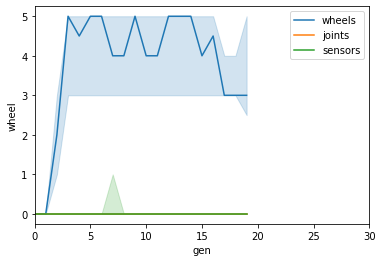

In [27]:
ax = sns.lineplot(data=morph_data,x="gen",y="wheel",estimator=np.median,ci=100)
sns.lineplot(data=morph_data,x="gen",y="joint",estimator=np.median,ci=100)
sns.lineplot(data=morph_data,x="gen",y="sensor",estimator=np.median,ci=100)
ax.set_xlim([0,30])
ax.legend(["wheels","joints","sensors"])

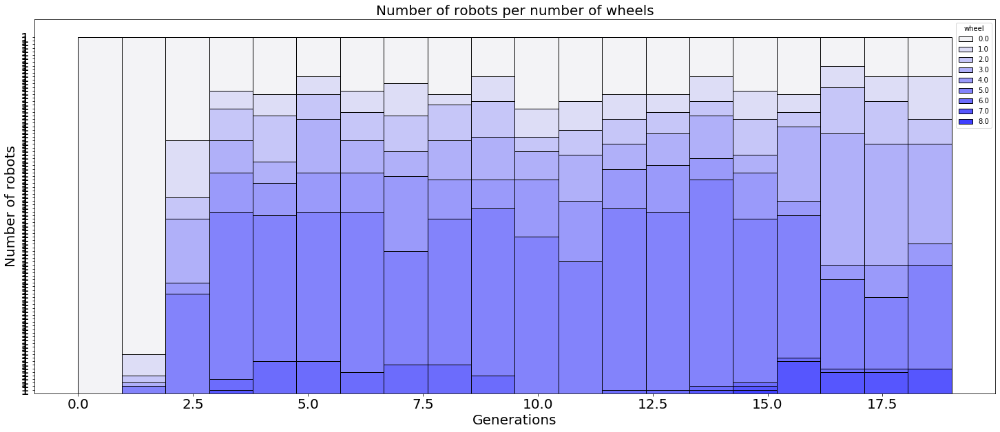

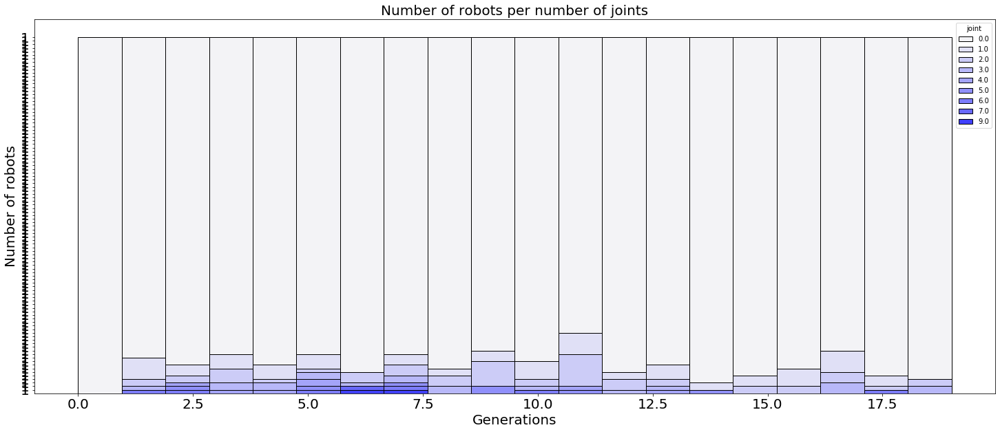

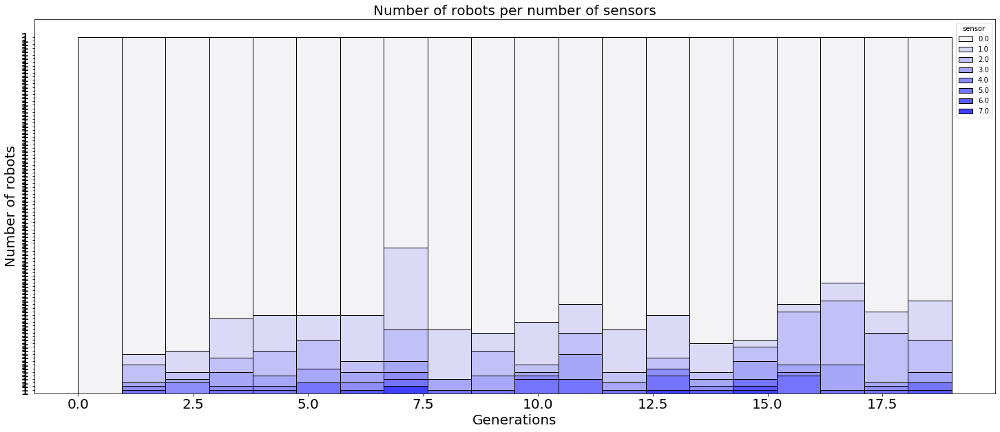

In [28]:
plot_hist_nbr_rob("Number of robots per number of wheels",morph_data,'wheel',20,100)
plot_hist_nbr_rob("Number of robots per number of joints",morph_data,'joint',20,100)
plot_hist_nbr_rob("Number of robots per number of sensors",morph_data,'sensor',20,100)

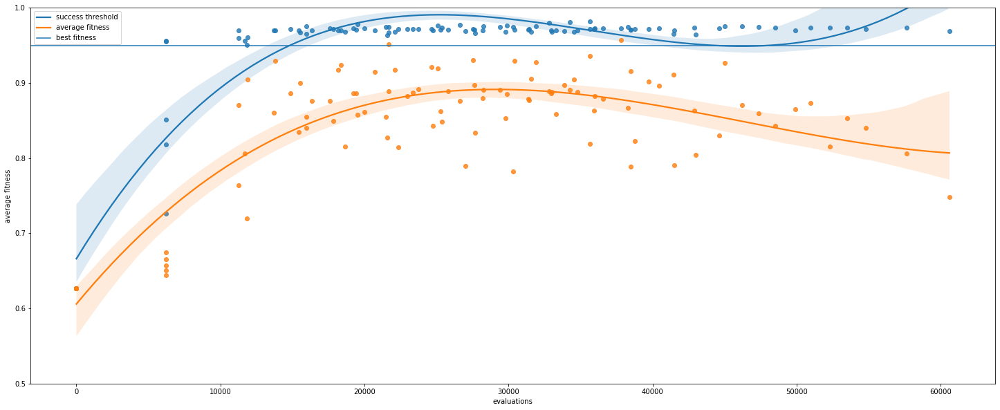

In [36]:
fig = plt.gcf()
fig.set_size_inches(25,10)
ax = sns.regplot(data=seg_data,x="evaluations",y="best fitness",order=3)
sns.regplot(data=seg_data,x="evaluations",y="average fitness",order=3)
#ax.set_xlim([0,60000])
ax.set_ylim([0.5,1])
ax.axhline([0.95])
plt.legend(["success threshold","average fitness","best fitness"])

(0, 20)

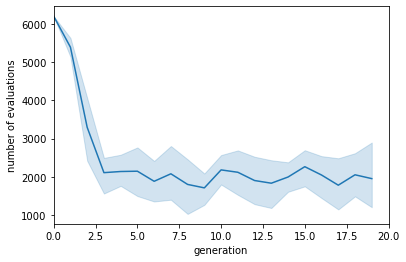

In [31]:
ax = sns.lineplot(data=seg_data,x="generation",y="number of evaluations")
ax.set_xlim([0,20])
#ax.set_ylim([-400,400])

(0, 20)

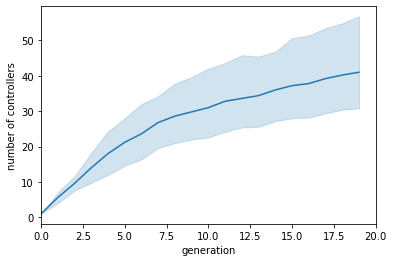

In [32]:
ax = sns.lineplot(data=seg_data,x="generation",y="number of controllers")
ax.set_xlim([0,20])
#ax.set_ylim([9,50])

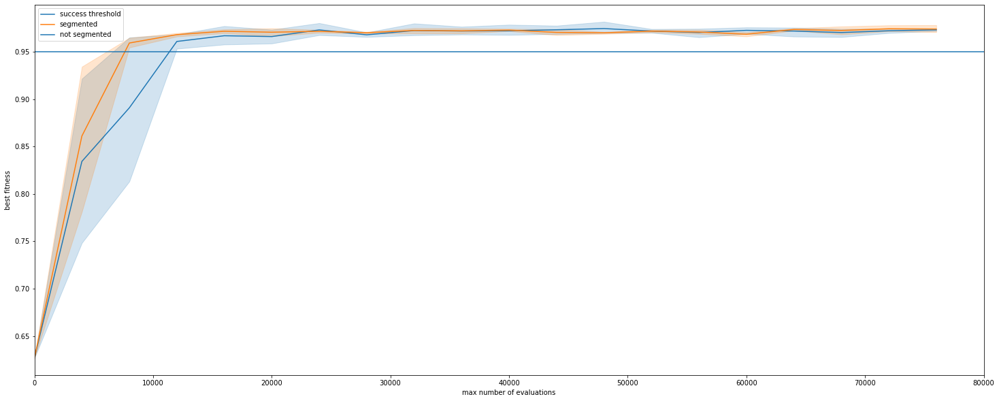

In [45]:
fig = plt.gcf()
fig.set_size_inches(25,10)
sns.lineplot(data=nos_data,x="max number of evaluations",y="best fitness")
ax = sns.lineplot(data=seg_data,x="max number of evaluations",y="best fitness")
ax.axhline([0.95])
ax.set_xlim(0,80000)
plt.legend(["success threshold","segmented","not segmented"])

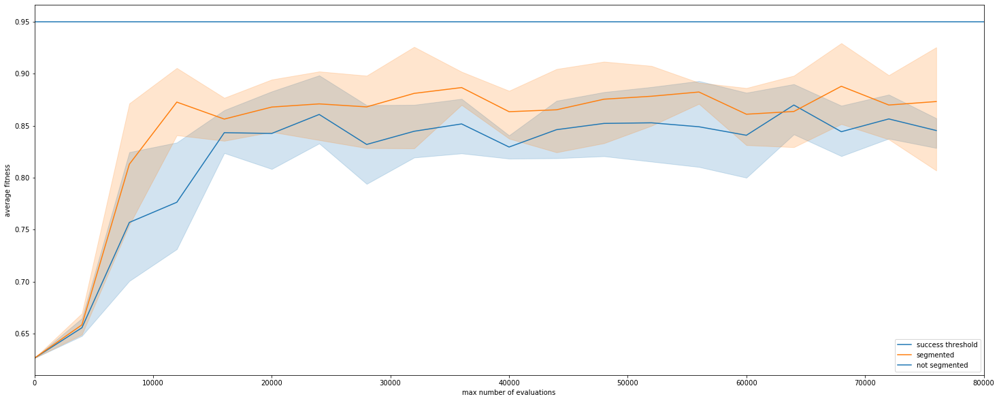

In [48]:
fig = plt.gcf()
fig.set_size_inches(25,10)
sns.lineplot(data=nos_data,x="max number of evaluations",y="average fitness")
ax = sns.lineplot(data=seg_data,x="max number of evaluations",y="average fitness")
ax.axhline([0.95])
ax.set_xlim(0,80000)
plt.legend(["success threshold","segmented","not segmented"])

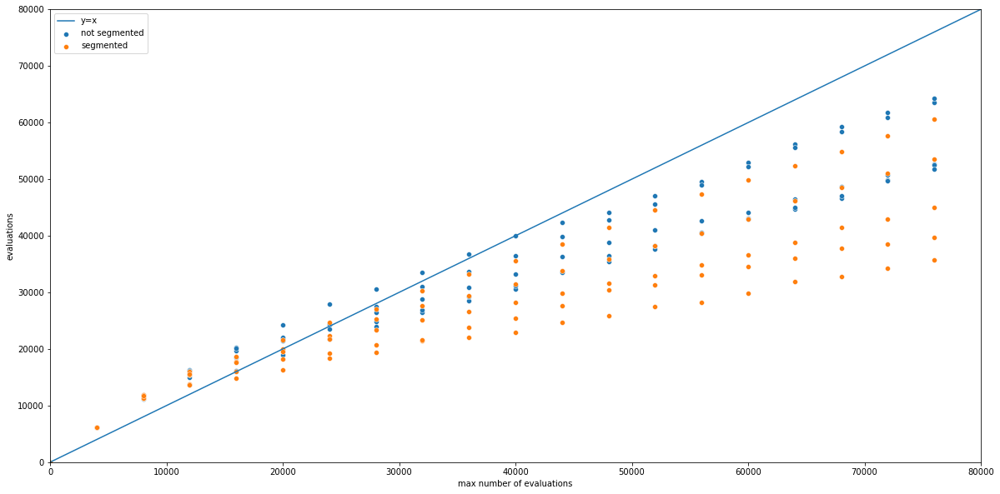

In [51]:
fig = plt.gcf()
fig.set_size_inches(20,10)
sns.scatterplot(data=nos_data,x="max number of evaluations",y="evaluations")
ax = sns.scatterplot(data=seg_data,x="max number of evaluations",y="evaluations")
plt.plot([x for x in range(80000)],[x for x in range(80000)])
ax.set_xlim(0,80000)
ax.set_ylim(0,80000)
plt.legend(["y=x","not segmented","segmented"])

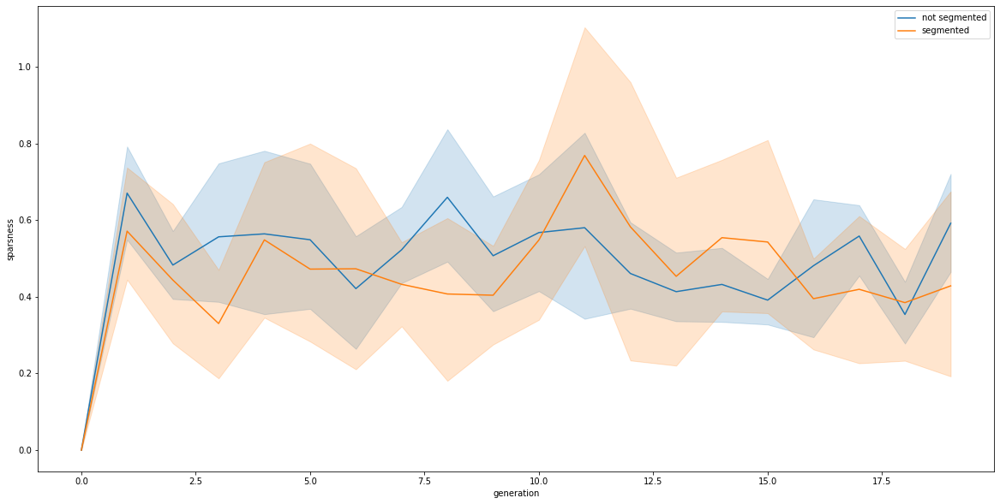

In [79]:
fig = plt.gcf()
fig.set_size_inches(20,10)
sns.lineplot(data=nos_sparsness_data,x="generation",y="sparsness")
ax = sns.lineplot(data=seg_sparsness_data,x="generation",y="sparsness")
ax.legend(["not segmented","segmented"])

In [83]:
exp_folder = "/home/leni/are-logs/mnipes_hard_2/"
lines = []
for folder in os.listdir(exp_folder):
    neval, best_ids, best_fit, avg_fit, pop_size = load_all_fitnesses(exp_folder + folder + "/fitnesses.csv",0)
    print(len(best_fit))
    nbr_eval = load_number_of_eval_per_gen(exp_folder + folder,len(best_fit))
    acc_nbr_eval = [0]
    for ne in nbr_eval:
        acc_nbr_eval.append(acc_nbr_eval[-1]+ne)
    nbr_ctrl_v = []
    gen_v = []
    for file in os.listdir(exp_folder + folder):
        if(file.split("_")[0] != "controller"):
            continue
        gen_v.append(float(file.split("archive")[-1]))
        ctrl_arch = load_controller_archive(exp_folder + folder + "/" + file)
        nbr_ctrl=0
        for i,line in ctrl_arch.iterrows():
            if(line["fitness"] > 0):
                nbr_ctrl+=1
        nbr_ctrl_v.append(nbr_ctrl)
    nbr_ctrl_v = [nbr_ctrl_v[i] for i in np.argsort(gen_v)]
    print(acc_nbr_eval[-1])

    for gen, bf, af, nc,ane,ne in zip(range(len(best_fit)),best_fit,avg_fit,nbr_ctrl_v,acc_nbr_eval,nbr_eval):
        lines.append([gen,gen*4000,bf,af,ane,nc,ne])
seg_data = pd.DataFrame(data=lines,columns=["generation","max number of evaluations","best fitness","average fitness","evaluations","number of controllers","number of evaluations"])

12
20800
9
15480
12
18270
19
27740
6
11600
15
24900
14
21370
6
10310
6
11560
20
21500


In [84]:
lines = []
for folder in os.listdir(exp_folder):
    lines += load_ind_fitnesses(exp_folder + folder + "/fitnesses.csv",0)
fit_data = pd.DataFrame(data=lines,columns=["generation","individual","fitness"])


In [85]:
lines = []
sparsness = []
for folder in os.listdir(exp_folder):
    descriptors = load_descriptor(exp_folder + folder + "/MD_Cart_WDH.csv",8)
    sparsness += sparsness_per_gen(descriptors,20)
    for desc in descriptors:
        lines.append([desc[0],str(desc[1]),desc[6]*16,desc[7]*16,desc[8]*16])
print(len(lines))
seg_sparsness_data = pd.DataFrame(data=sparsness,columns=["generation","sparsness"])
morph_data = pd.DataFrame(data=lines,columns=["gen","robot","wheel","sensor","joint"])
morph_data = pd.concat([morph_data,fit_data],axis=1,join="inner")

1190


/home/leni/.local/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 33.4% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


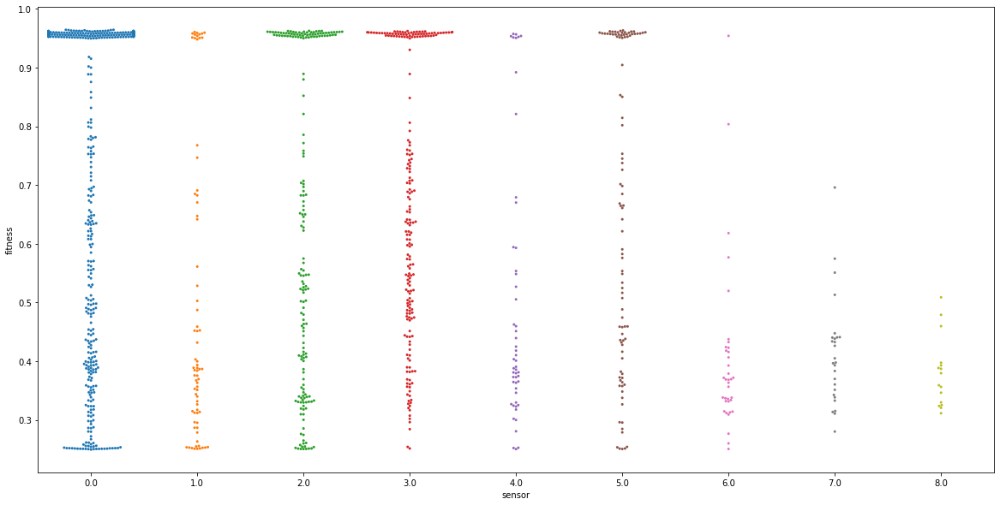

In [86]:
fig = plt.gcf()
fig.set_size_inches(20,10)
ax = sns.swarmplot(data=morph_data,x="sensor",y="fitness",size=3)
#ax.set_ylim(0.9,1.0)

/home/leni/.local/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 11.3% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/leni/.local/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 41.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


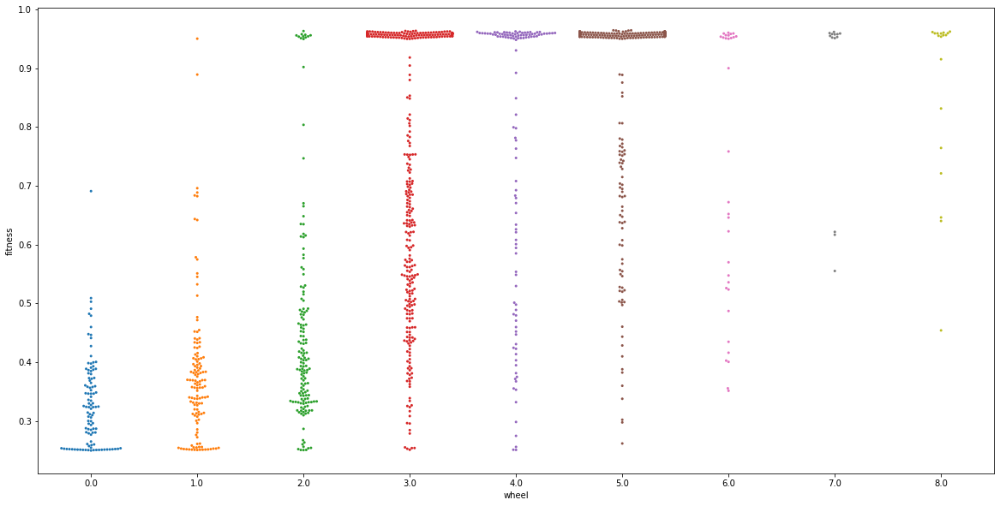

In [87]:
fig = plt.gcf()
fig.set_size_inches(20,10)
ax = sns.swarmplot(data=morph_data,x="wheel",y="fitness",size=3)
#ax.set_ylim(0.9,1.0)

/home/leni/.local/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 25.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


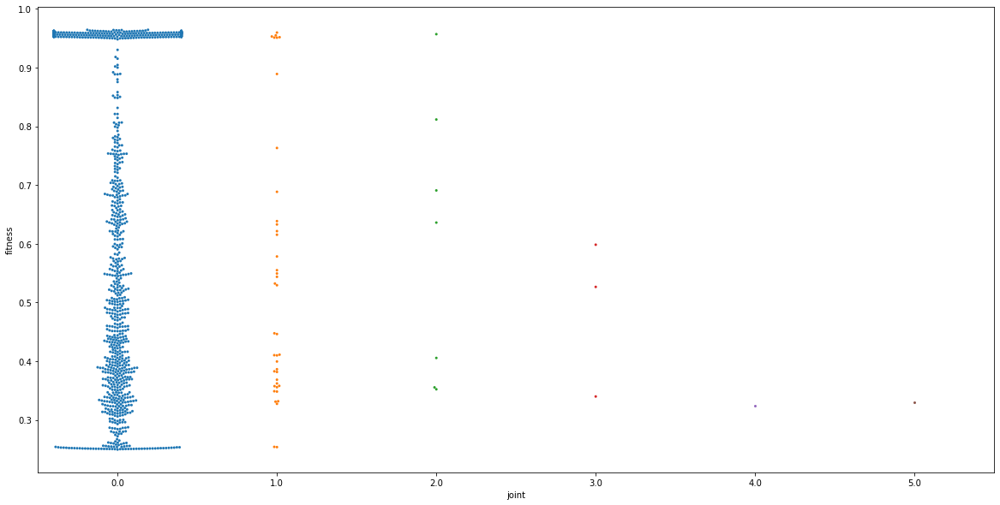

In [88]:
fig = plt.gcf()
fig.set_size_inches(20,10)
ax = sns.swarmplot(data=morph_data,x="joint",y="fitness",size=3)
#ax.set_ylim(0.9,1.0)

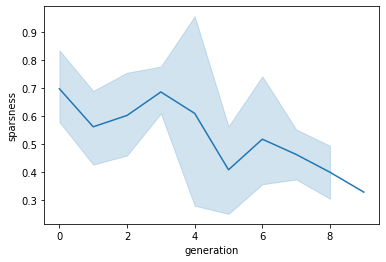

In [89]:
sns.lineplot(data=seg_sparsness_data,x="generation",y="sparsness")

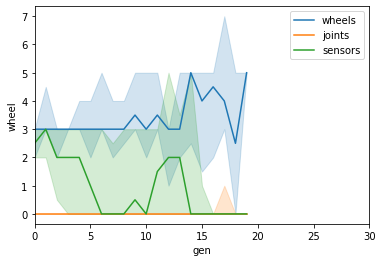

In [90]:
ax = sns.lineplot(data=morph_data,x="gen",y="wheel",estimator=np.median,ci=100)
sns.lineplot(data=morph_data,x="gen",y="joint",estimator=np.median,ci=100)
sns.lineplot(data=morph_data,x="gen",y="sensor",estimator=np.median,ci=100)
ax.set_xlim([0,30])
ax.legend(["wheels","joints","sensors"])

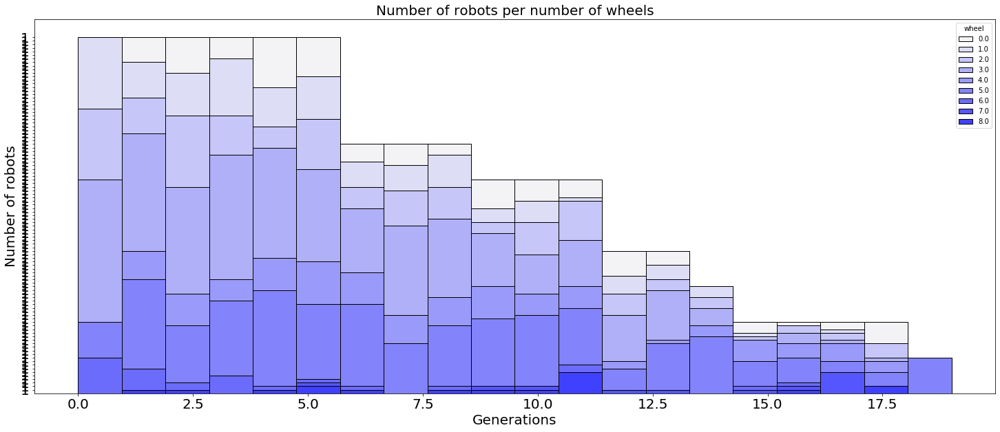

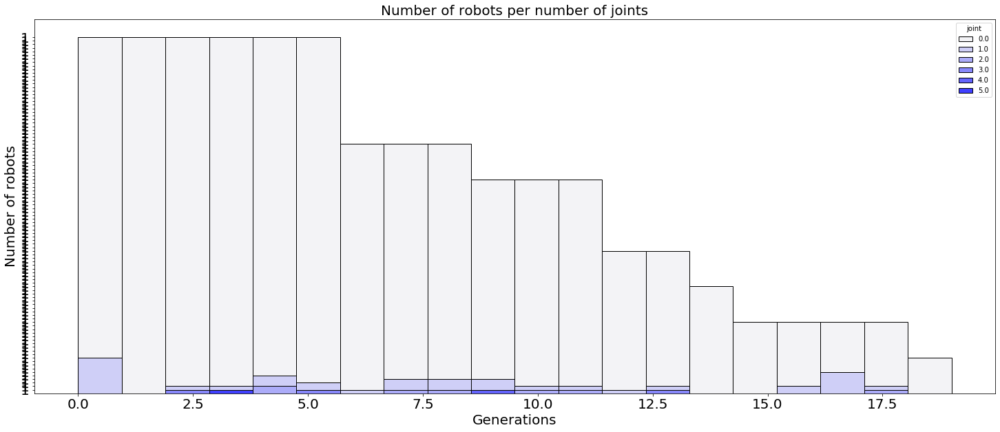

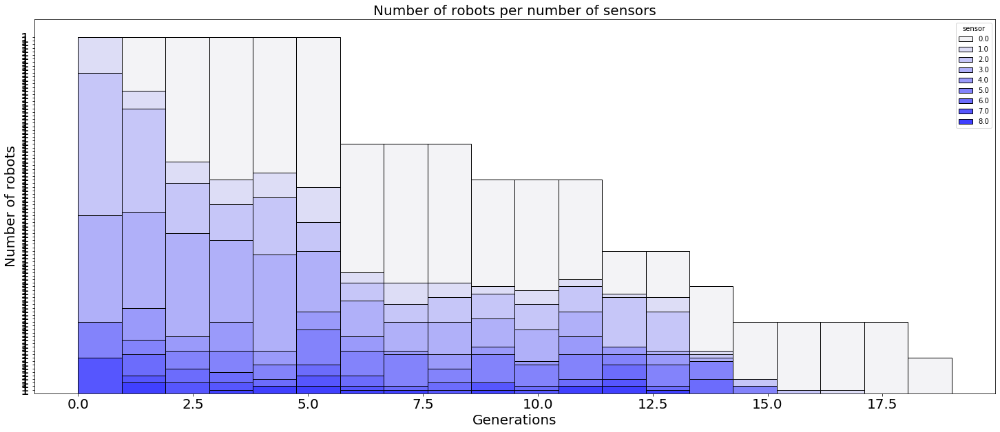

In [91]:
plot_hist_nbr_rob("Number of robots per number of wheels",morph_data,'wheel',20,100)
plot_hist_nbr_rob("Number of robots per number of joints",morph_data,'joint',20,100)
plot_hist_nbr_rob("Number of robots per number of sensors",morph_data,'sensor',20,100)

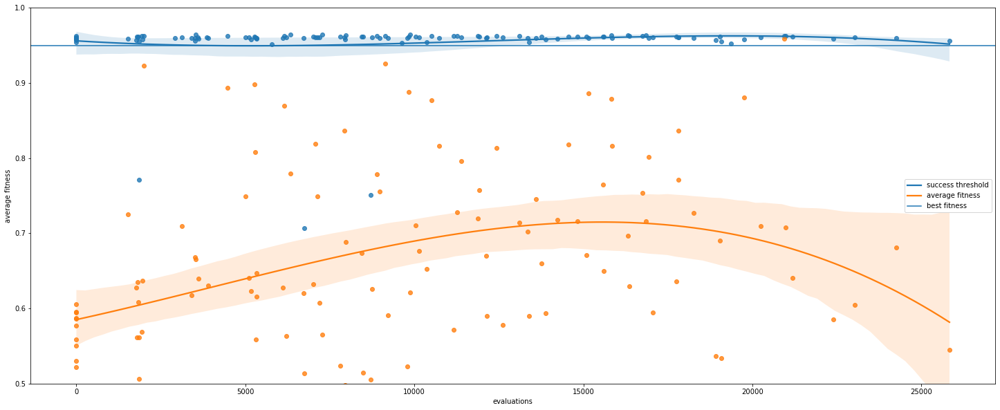

In [92]:
fig = plt.gcf()
fig.set_size_inches(25,10)
ax = sns.regplot(data=seg_data,x="evaluations",y="best fitness",order=3)
sns.regplot(data=seg_data,x="evaluations",y="average fitness",order=3)
#ax.set_xlim([0,60000])
ax.set_ylim([0.5,1])
ax.axhline([0.95])
plt.legend(["success threshold","average fitness","best fitness"])

(0, 20)

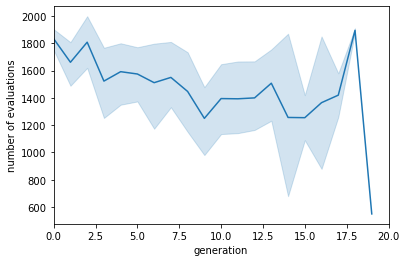

In [93]:
ax = sns.lineplot(data=seg_data,x="generation",y="number of evaluations")
ax.set_xlim([0,20])
#ax.set_ylim([-400,400])

(0, 20)

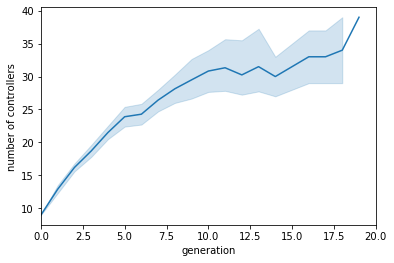

In [94]:
ax = sns.lineplot(data=seg_data,x="generation",y="number of controllers")
ax.set_xlim([0,20])
#ax.set_ylim([9,50])

In [95]:
exp_folder = "/home/leni/are-logs/mnipes_rooms_2/"
lines = []
for folder in os.listdir(exp_folder):
    neval, best_ids, best_fit, avg_fit, pop_size = load_all_fitnesses(exp_folder + folder + "/fitnesses.csv",0)
    print(len(best_fit))
    nbr_eval = load_number_of_eval_per_gen(exp_folder + folder,len(best_fit))
    acc_nbr_eval = [0]
    for ne in nbr_eval:
        acc_nbr_eval.append(acc_nbr_eval[-1]+ne)
    nbr_ctrl_v = []
    gen_v = []
    for file in os.listdir(exp_folder + folder):
        if(file.split("_")[0] != "controller"):
            continue
        gen_v.append(float(file.split("archive")[-1]))
        ctrl_arch = load_controller_archive(exp_folder + folder + "/" + file)
        nbr_ctrl=0
        for i,line in ctrl_arch.iterrows():
            if(line["fitness"] > 0):
                nbr_ctrl+=1
        nbr_ctrl_v.append(nbr_ctrl)
    nbr_ctrl_v = [nbr_ctrl_v[i] for i in np.argsort(gen_v)]
    print(acc_nbr_eval[-1])

    for gen, bf, af, nc,ane,ne in zip(range(len(best_fit)),best_fit,avg_fit,nbr_ctrl_v,acc_nbr_eval,nbr_eval):
        lines.append([gen,gen*4000,bf,af,ane,nc,ne])
seg_data = pd.DataFrame(data=lines,columns=["generation","max number of evaluations","best fitness","average fitness","evaluations","number of controllers","number of evaluations"])

10
21450
13
27270
19
39900
20
41190
20
40990
20
41030
11
23570
20
40550
20
43120
20
41870


In [96]:
lines = []
for folder in os.listdir(exp_folder):
    lines += load_ind_fitnesses(exp_folder + folder + "/fitnesses.csv",0)
fit_data = pd.DataFrame(data=lines,columns=["generation","individual","fitness"])


In [97]:
lines = []
sparsness = []
for folder in os.listdir(exp_folder):
    descriptors = load_descriptor(exp_folder + folder + "/MD_Cart_WDH.csv",8)
    sparsness += sparsness_per_gen(descriptors,20)
    for desc in descriptors:
        lines.append([desc[0],str(desc[1]),desc[6]*16,desc[7]*16,desc[8]*16])
print(len(lines))
seg_sparsness_data = pd.DataFrame(data=sparsness,columns=["generation","sparsness"])
morph_data = pd.DataFrame(data=lines,columns=["gen","robot","wheel","sensor","joint"])
morph_data = pd.concat([morph_data,fit_data],axis=1,join="inner")

1730


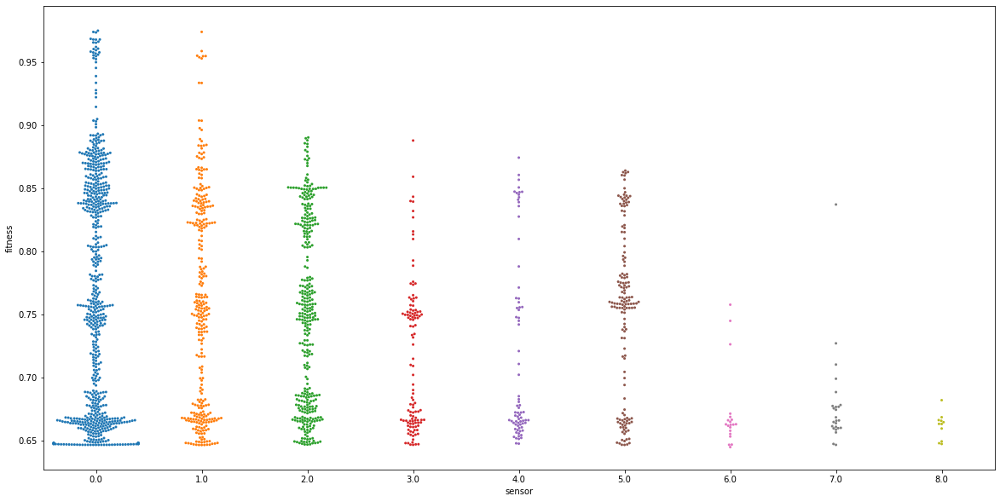

In [98]:
fig = plt.gcf()
fig.set_size_inches(20,10)
ax = sns.swarmplot(data=morph_data,x="sensor",y="fitness",size=3)
#ax.set_ylim(0.9,1.0)

/home/leni/.local/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 9.9% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


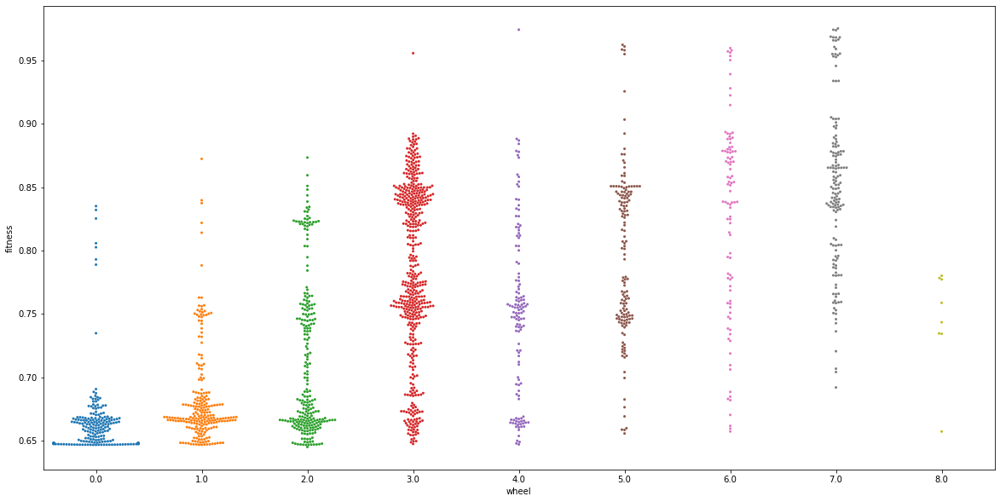

In [99]:
fig = plt.gcf()
fig.set_size_inches(20,10)
ax = sns.swarmplot(data=morph_data,x="wheel",y="fitness",size=3)
#ax.set_ylim(0.9,1.0)

/home/leni/.local/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 6.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


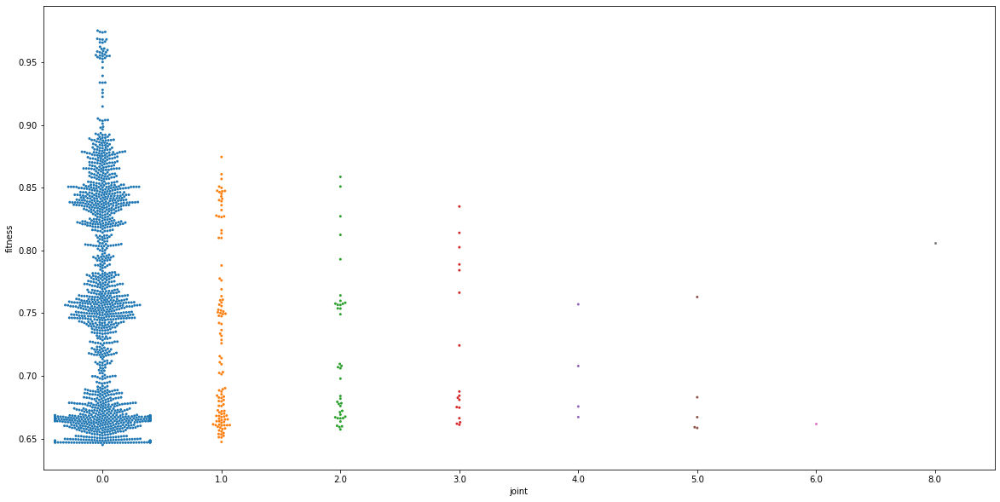

In [100]:
fig = plt.gcf()
fig.set_size_inches(20,10)
ax = sns.swarmplot(data=morph_data,x="joint",y="fitness",size=3)
#ax.set_ylim(0.9,1.0)

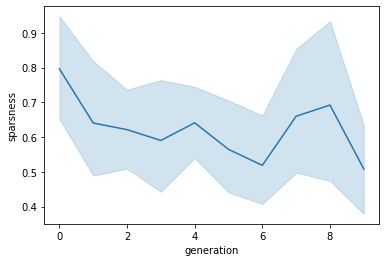

In [101]:
sns.lineplot(data=seg_sparsness_data,x="generation",y="sparsness")

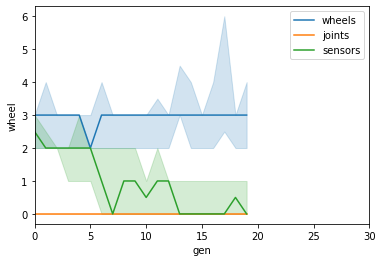

In [102]:
ax = sns.lineplot(data=morph_data,x="gen",y="wheel",estimator=np.median,ci=100)
sns.lineplot(data=morph_data,x="gen",y="joint",estimator=np.median,ci=100)
sns.lineplot(data=morph_data,x="gen",y="sensor",estimator=np.median,ci=100)
ax.set_xlim([0,30])
ax.legend(["wheels","joints","sensors"])

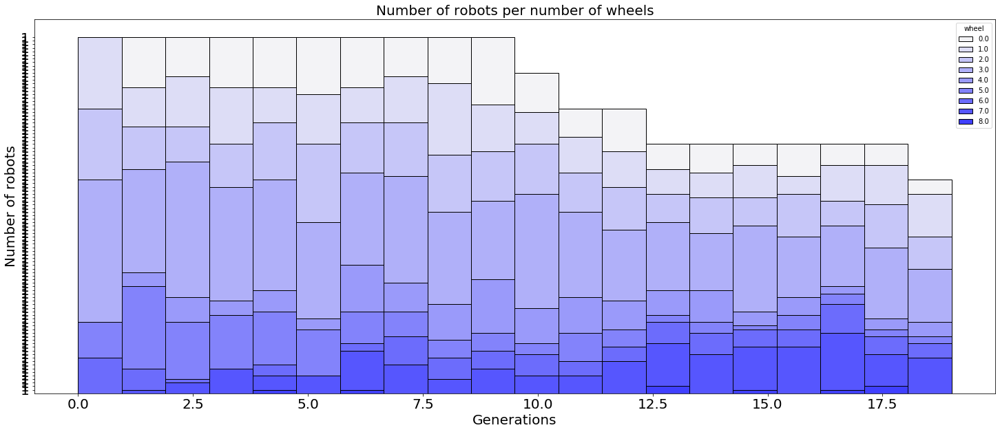

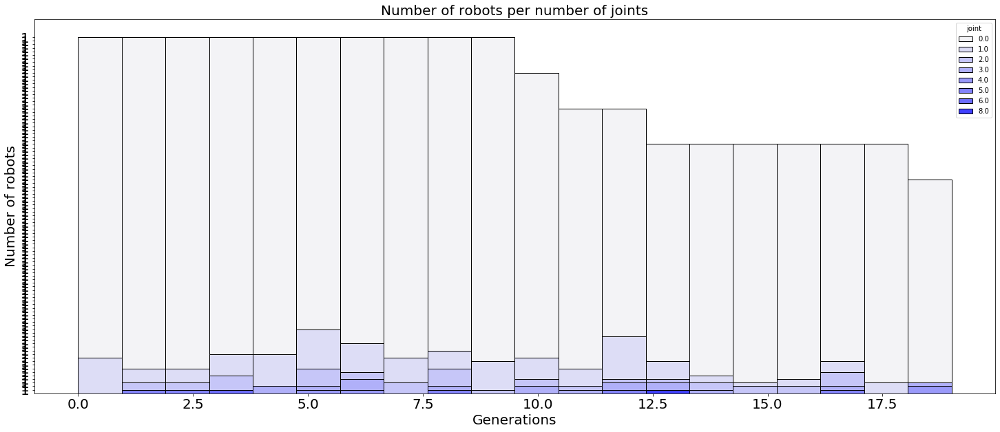

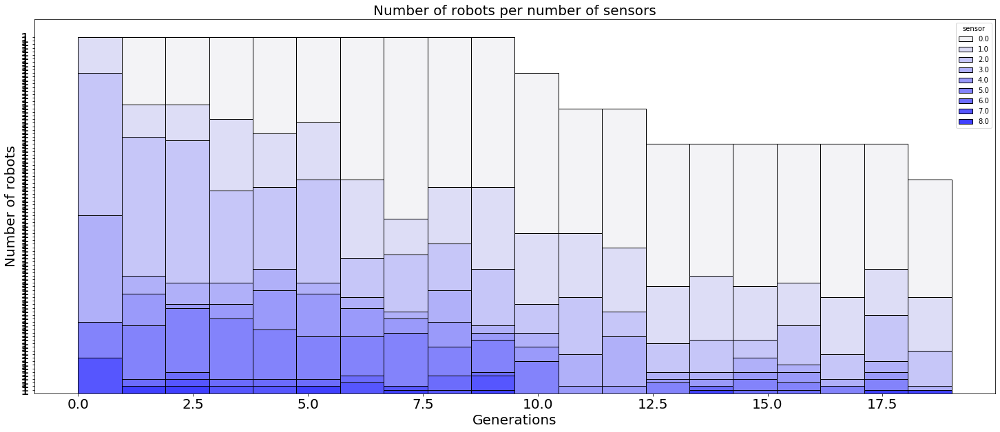

In [103]:
plot_hist_nbr_rob("Number of robots per number of wheels",morph_data,'wheel',20,100)
plot_hist_nbr_rob("Number of robots per number of joints",morph_data,'joint',20,100)
plot_hist_nbr_rob("Number of robots per number of sensors",morph_data,'sensor',20,100)

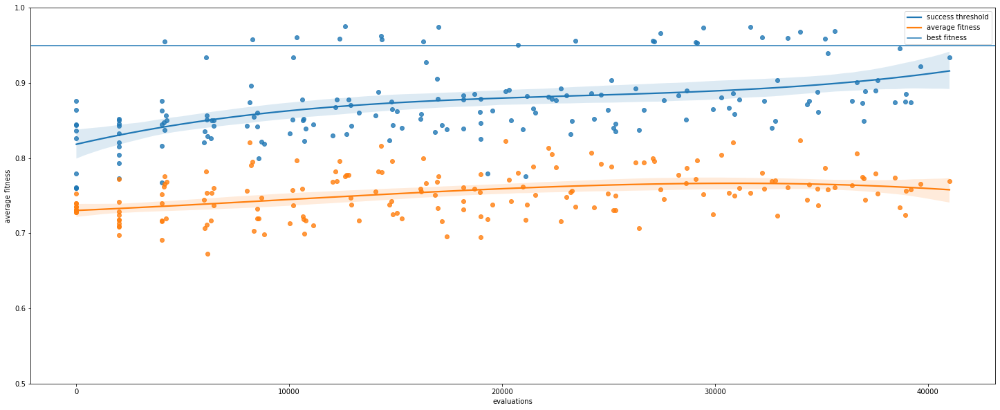

In [104]:
fig = plt.gcf()
fig.set_size_inches(25,10)
ax = sns.regplot(data=seg_data,x="evaluations",y="best fitness",order=3)
sns.regplot(data=seg_data,x="evaluations",y="average fitness",order=3)
#ax.set_xlim([0,60000])
ax.set_ylim([0.5,1])
ax.axhline([0.95])
plt.legend(["success threshold","average fitness","best fitness"])

(0, 20)

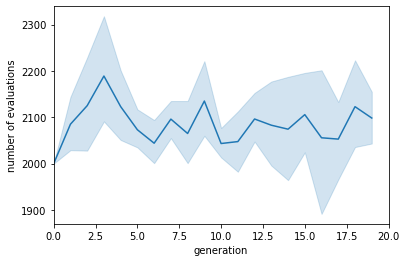

In [105]:
ax = sns.lineplot(data=seg_data,x="generation",y="number of evaluations")
ax.set_xlim([0,20])
#ax.set_ylim([-400,400])

(0, 20)

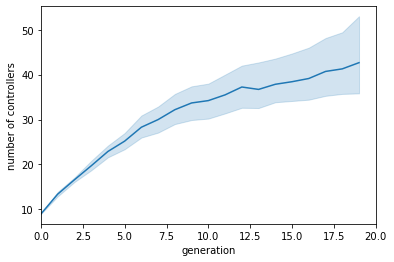

In [106]:
ax = sns.lineplot(data=seg_data,x="generation",y="number of controllers")
ax.set_xlim([0,20])
#ax.set_ylim([9,50])